In [ ]:
# Install required libraries
!pip install numpy networkx matplotlib seaborn scikit-learn torch

# Import necessary libraries
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import time
import random
import torch
import torch.nn as nn
import pandas as pd
from sklearn.metrics import pairwise_distances



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.10.19
    Uninstalling nvidia-curand-cu12-10.3.10.19:
      Successfully uninstalled nvidia-curand-cu12-10.3.10.19
  Attemp

# **Implementing Minimal Viable Components**

**LatentSpace**

In [ ]:
class LatentSpace:
    def __init__(self, dimensions=2):
        self.dimensions = dimensions
        self.vectors = {}  # Dictionary to store vectors with their IDs

    def add_vector(self, vector_id, vector):
        if len(vector) != self.dimensions:
            raise ValueError(f"Vector dimension must be {self.dimensions}")
        self.vectors[vector_id] = np.array(vector)

    def get_vector(self, vector_id):
        return self.vectors.get(vector_id, None)

    def update_vector(self, vector_id, new_vector):
        if len(new_vector) != self.dimensions:
            raise ValueError(f"Vector dimension must be {self.dimensions}")
        if vector_id in self.vectors:
            self.vectors[vector_id] = np.array(new_vector)
        else:
            raise ValueError(f"Vector ID {vector_id} not found")

    def get_all_vectors(self):
        return self.vectors

# Test LatentSpace
latent_space = LatentSpace(dimensions=2)
latent_space.add_vector(1, [1.0, 2.0])
latent_space.add_vector(2, [3.0, 4.0])

print(latent_space.get_vector(1))  # Should print [1.0, 2.0]
print(latent_space.get_all_vectors())  # Should print all vectors


[1. 2.]
{1: array([1., 2.]), 2: array([3., 4.])}


**MycelialEngine**

{'data': 'Experience 1'}


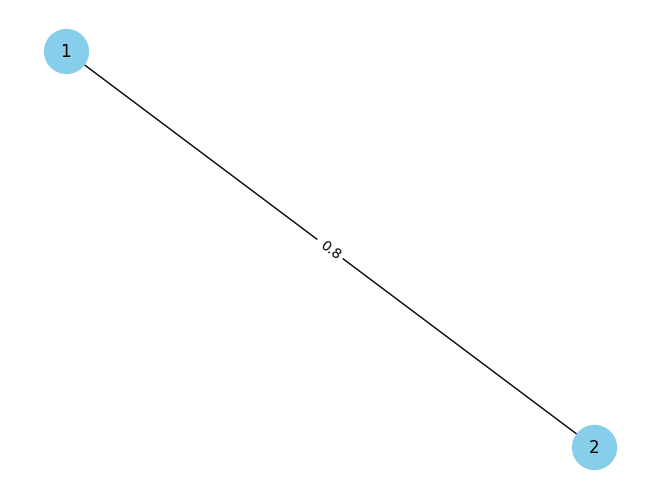

In [ ]:
class MycelialEngine:
    def __init__(self):
        self.graph = nx.Graph()

    def add_experience(self, experience_id, experience_data):
        self.graph.add_node(experience_id, data=experience_data)

    def add_connection(self, experience_id1, experience_id2, similarity):
        self.graph.add_edge(experience_id1, experience_id2, weight=similarity)

    def get_experience(self, experience_id):
        return self.graph.nodes.get(experience_id, {}).get('data', None)

    def get_connected_experiences(self, experience_id):
        neighbors = list(self.graph.neighbors(experience_id))
        return neighbors

    def visualize(self):
        pos = nx.spring_layout(self.graph)
        nx.draw(self.graph, pos, with_labels=True, node_size=1000, node_color='skyblue')
        edge_labels = nx.get_edge_attributes(self.graph, 'weight')
        nx.draw_networkx_edge_labels(self.graph, pos, edge_labels=edge_labels)
        plt.show()

# Test MycelialEngine
mycelial_engine = MycelialEngine()
mycelial_engine.add_experience(1, {"data": "Experience 1"})
mycelial_engine.add_experience(2, {"data": "Experience 2"})
mycelial_engine.add_connection(1, 2, 0.8)

print(mycelial_engine.get_experience(1))  # Should print {"data": "Experience 1"}
mycelial_engine.visualize()  # Visualize the graph


**AttentionField**

In [ ]:
class AttentionField:
    def __init__(self, latent_space):
        self.latent_space = latent_space

    def sense_resonance(self):
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return None

        # Calculate resonance as the norm of the vectors
        resonance = {vec_id: np.linalg.norm(vec) for vec_id, vec in vectors.items()}
        return resonance

    def focus_on(self, vector_id):
        # For simplicity, just return the vector and its resonance
        vector = self.latent_space.get_vector(vector_id)
        if vector is not None:
            resonance = np.linalg.norm(vector)
            return {"vector_id": vector_id, "vector": vector, "resonance": resonance}
        return None

# Test AttentionField
attention_field = AttentionField(latent_space)
resonance = attention_field.sense_resonance()
print("Resonance:", resonance)  # Should print resonance values for each vector

focus = attention_field.focus_on(1)
print("Focus:", focus)  # Should print the focused vector and its resonance


Resonance: {1: 2.23606797749979, 2: 5.0}
Focus: {'vector_id': 1, 'vector': array([1., 2.]), 'resonance': 2.23606797749979}


# Integration Testing

Let's test the interaction between LatentSpace and AttentionField.

In [ ]:
# Interaction between LatentSpace and AttentionField
latent_space = LatentSpace(dimensions=2)
latent_space.add_vector(1, [1.0, 2.0])
latent_space.add_vector(2, [3.0, 4.0])

attention_field = AttentionField(latent_space)
resonance = attention_field.sense_resonance()
print("Resonance:", resonance)  # Should print resonance values for each vector

# Update a vector in LatentSpace and check if AttentionField senses the change
latent_space.update_vector(1, [1.5, 2.5])
updated_resonance = attention_field.sense_resonance()
print("Updated Resonance:", updated_resonance)  # Should reflect the updated vector


Resonance: {1: 2.23606797749979, 2: 5.0}
Updated Resonance: {1: 2.9154759474226504, 2: 5.0}


**SemanticMemory**

In [ ]:
class SemanticMemory:
    def __init__(self):
        self.memory = {}

    def store_node(self, node_id, node_data):
        self.memory[node_id] = node_data

    def retrieve_node(self, node_id):
        return self.memory.get(node_id, None)

    def get_all_nodes(self):
        return self.memory

# Test SemanticMemory
semantic_memory = SemanticMemory()
semantic_memory.store_node(1, {"data": "Important Experience 1"})
semantic_memory.store_node(2, {"data": "Important Experience 2"})

print(semantic_memory.retrieve_node(1))  # Should print {"data": "Important Experience 1"}
print(semantic_memory.get_all_nodes())  # Should print all nodes


{'data': 'Important Experience 1'}
{1: {'data': 'Important Experience 1'}, 2: {'data': 'Important Experience 2'}}


Now, let's test the interaction between MycelialEngine and SemanticMemory.

In [ ]:
# Interaction between MycelialEngine and SemanticMemory
mycelial_engine = MycelialEngine()
mycelial_engine.add_experience(1, {"data": "Experience 1"})
mycelial_engine.add_experience(2, {"data": "Experience 2"})
mycelial_engine.add_connection(1, 2, 0.8)

semantic_memory = SemanticMemory()

# For simplicity, let's assume that experiences with high similarity are semantically salient
for node in mycelial_engine.graph.nodes:
    node_data = mycelial_engine.get_experience(node)
    if node_data:
        semantic_memory.store_node(node, node_data)

print(semantic_memory.get_all_nodes())  # Should print all stored nodes


{1: {'data': 'Experience 1'}, 2: {'data': 'Experience 2'}}


# System Testing

**Integrating Components**

In [ ]:
# Initialize components
latent_space = LatentSpace(dimensions=2)
mycelial_engine = MycelialEngine()
attention_field = AttentionField(latent_space)
semantic_memory = SemanticMemory()

# Add some initial data
latent_space.add_vector(1, [1.0, 2.0])
latent_space.add_vector(2, [3.0, 4.0])

mycelial_engine.add_experience(1, {"data": "Experience 1", "vector_id": 1})
mycelial_engine.add_experience(2, {"data": "Experience 2", "vector_id": 2})
mycelial_engine.add_connection(1, 2, 0.8)

# Simulate interaction
resonance = attention_field.sense_resonance()
print("Initial Resonance:", resonance)

# Store semantically salient experiences
for node in mycelial_engine.graph.nodes:
    node_data = mycelial_engine.get_experience(node)
    if node_data:
        semantic_memory.store_node(node, node_data)

print("Semantic Memory:", semantic_memory.get_all_nodes())

# Update LatentSpace and observe changes
latent_space.update_vector(1, [1.5, 2.5])
updated_resonance = attention_field.sense_resonance()
print("Updated Resonance:", updated_resonance)

# Add a new experience and update SemanticMemory
mycelial_engine.add_experience(3, {"data": "Experience 3", "vector_id": 3})
mycelial_engine.add_connection(1, 3, 0.7)
latent_space.add_vector(3, [2.0, 3.0])

# Update SemanticMemory with new experience
node_data = mycelial_engine.get_experience(3)
if node_data:
    semantic_memory.store_node(3, node_data)

print("Updated Semantic Memory:", semantic_memory.get_all_nodes())


Initial Resonance: {1: 2.23606797749979, 2: 5.0}
Semantic Memory: {1: {'data': 'Experience 1', 'vector_id': 1}, 2: {'data': 'Experience 2', 'vector_id': 2}}
Updated Resonance: {1: 2.9154759474226504, 2: 5.0}
Updated Semantic Memory: {1: {'data': 'Experience 1', 'vector_id': 1}, 2: {'data': 'Experience 2', 'vector_id': 2}, 3: {'data': 'Experience 3', 'vector_id': 3}}


# Debugging and Monitoring

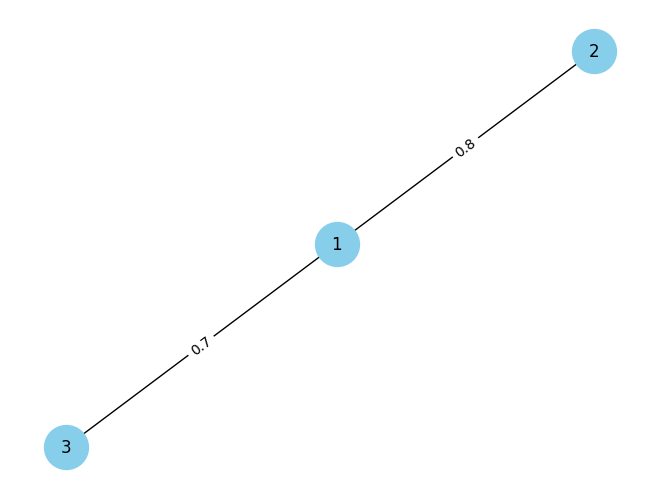

In [ ]:
import logging

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Integrate components with logging
latent_space = LatentSpace(dimensions=2)
mycelial_engine = MycelialEngine()
attention_field = AttentionField(latent_space)
semantic_memory = SemanticMemory()

# Add some initial data with logging
logger.info("Adding initial vectors to LatentSpace")
latent_space.add_vector(1, [1.0, 2.0])
latent_space.add_vector(2, [3.0, 4.0])
logger.info(f"Initial vectors: {latent_space.get_all_vectors()}")

logger.info("Adding initial experiences to MycelialEngine")
mycelial_engine.add_experience(1, {"data": "Experience 1", "vector_id": 1})
mycelial_engine.add_experience(2, {"data": "Experience 2", "vector_id": 2})
mycelial_engine.add_connection(1, 2, 0.8)
logger.info(f"Initial experiences: {list(mycelial_engine.graph.nodes)}")

# Simulate interaction with logging
logger.info("Sensing initial resonance")
resonance = attention_field.sense_resonance()
logger.info(f"Initial Resonance: {resonance}")

# Store semantically salient experiences with logging
logger.info("Storing semantically salient experiences")
for node in mycelial_engine.graph.nodes:
    node_data = mycelial_engine.get_experience(node)
    if node_data:
        semantic_memory.store_node(node, node_data)
logger.info(f"Semantic Memory: {semantic_memory.get_all_nodes()}")

# Update LatentSpace and observe changes with logging
logger.info("Updating vector in LatentSpace")
latent_space.update_vector(1, [1.5, 2.5])
updated_resonance = attention_field.sense_resonance()
logger.info(f"Updated Resonance: {updated_resonance}")

# Add a new experience and update SemanticMemory with logging
logger.info("Adding new experience to MycelialEngine")
mycelial_engine.add_experience(3, {"data": "Experience 3", "vector_id": 3})
mycelial_engine.add_connection(1, 3, 0.7)
latent_space.add_vector(3, [2.0, 3.0])

logger.info("Updating SemanticMemory with new experience")
node_data = mycelial_engine.get_experience(3)
if node_data:
    semantic_memory.store_node(3, node_data)
logger.info(f"Updated Semantic Memory: {semantic_memory.get_all_nodes()}")

# Visualize MycelialEngine graph
logger.info("Visualizing MycelialEngine graph")
mycelial_engine.visualize()


# Final Response

[1. 2.]
{1: array([1., 2.]), 2: array([3., 4.])}
{'data': 'Experience 1'}


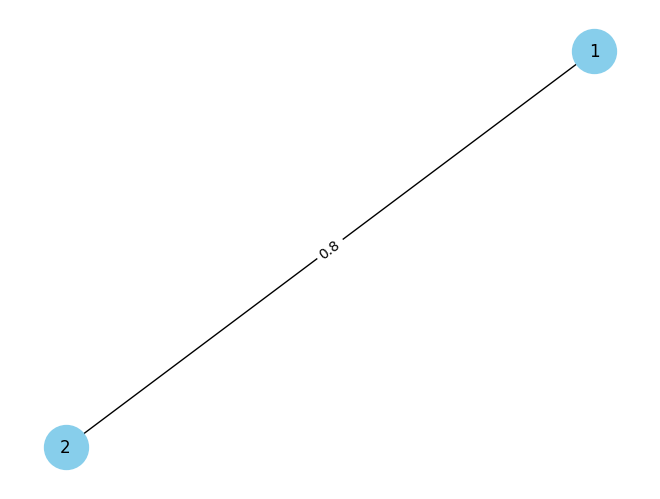

Resonance: {1: 2.23606797749979, 2: 5.0}
Focus: {'vector_id': 1, 'vector': array([1., 2.]), 'resonance': 2.23606797749979}
{'data': 'Important Experience 1'}
{1: {'data': 'Important Experience 1'}, 2: {'data': 'Important Experience 2'}}
Initial Resonance: {1: 2.23606797749979, 2: 5.0}
Updated Resonance: {1: 2.9154759474226504, 2: 5.0}
{1: {'data': 'Experience 1', 'vector_id': 1}, 2: {'data': 'Experience 2', 'vector_id': 2}}
Updated Semantic Memory: {1: {'data': 'Experience 1', 'vector_id': 1}, 2: {'data': 'Experience 2', 'vector_id': 2}, 3: {'data': 'Experience 3', 'vector_id': 3}}


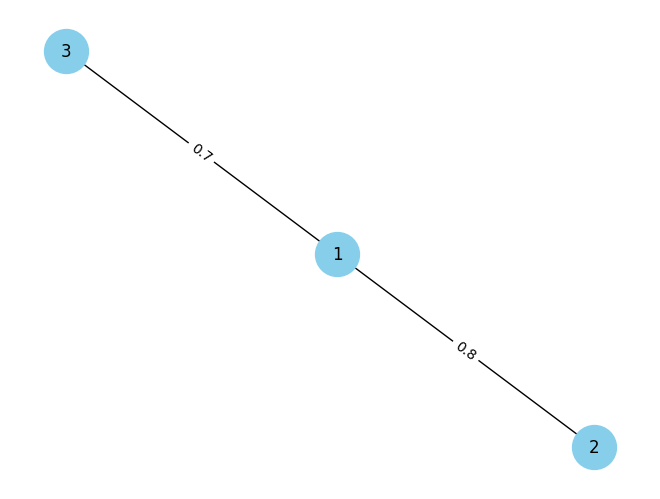

In [ ]:
# Install required libraries
!pip install numpy torch networkx matplotlib seaborn scikit-learn

# Import necessary libraries
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import logging

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Define LatentSpace class
class LatentSpace:
    def __init__(self, dimensions=2):
        self.dimensions = dimensions
        self.vectors = {}  # Dictionary to store vectors with their IDs

    def add_vector(self, vector_id, vector):
        if len(vector) != self.dimensions:
            raise ValueError(f"Vector dimension must be {self.dimensions}")
        self.vectors[vector_id] = np.array(vector)

    def get_vector(self, vector_id):
        return self.vectors.get(vector_id, None)

    def update_vector(self, vector_id, new_vector):
        if len(new_vector) != self.dimensions:
            raise ValueError(f"Vector dimension must be {self.dimensions}")
        if vector_id in self.vectors:
            self.vectors[vector_id] = np.array(new_vector)
        else:
            raise ValueError(f"Vector ID {vector_id} not found")

    def get_all_vectors(self):
        return self.vectors

# Define MycelialEngine class
class MycelialEngine:
    def __init__(self):
        self.graph = nx.Graph()

    def add_experience(self, experience_id, experience_data):
        self.graph.add_node(experience_id, data=experience_data)

    def add_connection(self, experience_id1, experience_id2, similarity):
        self.graph.add_edge(experience_id1, experience_id2, weight=similarity)

    def get_experience(self, experience_id):
        return self.graph.nodes.get(experience_id, {}).get('data', None)

    def get_connected_experiences(self, experience_id):
        neighbors = list(self.graph.neighbors(experience_id))
        return neighbors

    def visualize(self):
        pos = nx.spring_layout(self.graph)
        nx.draw(self.graph, pos, with_labels=True, node_size=1000, node_color='skyblue')
        edge_labels = nx.get_edge_attributes(self.graph, 'weight')
        nx.draw_networkx_edge_labels(self.graph, pos, edge_labels=edge_labels)
        plt.show()

# Define AttentionField class
class AttentionField:
    def __init__(self, latent_space):
        self.latent_space = latent_space

    def sense_resonance(self):
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return None

        # Calculate resonance as the norm of the vectors
        resonance = {vec_id: np.linalg.norm(vec) for vec_id, vec in vectors.items()}
        return resonance

    def focus_on(self, vector_id):
        # For simplicity, just return the vector and its resonance
        vector = self.latent_space.get_vector(vector_id)
        if vector is not None:
            resonance = np.linalg.norm(vector)
            return {"vector_id": vector_id, "vector": vector, "resonance": resonance}
        return None

# Define SemanticMemory class
class SemanticMemory:
    def __init__(self):
        self.memory = {}

    def store_node(self, node_id, node_data):
        self.memory[node_id] = node_data

    def retrieve_node(self, node_id):
        return self.memory.get(node_id, None)

    def get_all_nodes(self):
        return self.memory

# Test LatentSpace
latent_space = LatentSpace(dimensions=2)
latent_space.add_vector(1, [1.0, 2.0])
latent_space.add_vector(2, [3.0, 4.0])

print(latent_space.get_vector(1))  # Should print [1.0, 2.0]
print(latent_space.get_all_vectors())  # Should print all vectors

# Test MycelialEngine
mycelial_engine = MycelialEngine()
mycelial_engine.add_experience(1, {"data": "Experience 1"})
mycelial_engine.add_experience(2, {"data": "Experience 2"})
mycelial_engine.add_connection(1, 2, 0.8)

print(mycelial_engine.get_experience(1))  # Should print {"data": "Experience 1"}
mycelial_engine.visualize()  # Visualize the graph

# Test AttentionField
attention_field = AttentionField(latent_space)
resonance = attention_field.sense_resonance()
print("Resonance:", resonance)  # Should print resonance values for each vector

focus = attention_field.focus_on(1)
print("Focus:", focus)  # Should print the focused vector and its resonance

# Test SemanticMemory
semantic_memory = SemanticMemory()
semantic_memory.store_node(1, {"data": "Important Experience 1"})
semantic_memory.store_node(2, {"data": "Important Experience 2"})

print(semantic_memory.retrieve_node(1))  # Should print {"data": "Important Experience 1"}
print(semantic_memory.get_all_nodes())  # Should print all nodes

# Integration test between LatentSpace and AttentionField
latent_space = LatentSpace(dimensions=2)
latent_space.add_vector(1, [1.0, 2.0])
latent_space.add_vector(2, [3.0, 4.0])

attention_field = AttentionField(latent_space)
resonance = attention_field.sense_resonance()
print("Initial Resonance:", resonance)

# Update a vector in LatentSpace and check if AttentionField senses the change
latent_space.update_vector(1, [1.5, 2.5])
updated_resonance = attention_field.sense_resonance()
print("Updated Resonance:", updated_resonance)

# Integration test between MycelialEngine and SemanticMemory
mycelial_engine = MycelialEngine()
mycelial_engine.add_experience(1, {"data": "Experience 1", "vector_id": 1})
mycelial_engine.add_experience(2, {"data": "Experience 2", "vector_id": 2})
mycelial_engine.add_connection(1, 2, 0.8)

semantic_memory = SemanticMemory()

# For simplicity, let's assume that experiences with high similarity are semantically salient
for node in mycelial_engine.graph.nodes:
    node_data = mycelial_engine.get_experience(node)
    if node_data:
        semantic_memory.store_node(node, node_data)

print(semantic_memory.get_all_nodes())  # Should print all stored nodes

# Add a new experience and update SemanticMemory
mycelial_engine.add_experience(3, {"data": "Experience 3", "vector_id": 3})
mycelial_engine.add_connection(1, 3, 0.7)
latent_space.add_vector(3, [2.0, 3.0])

# Update SemanticMemory with new experience
node_data = mycelial_engine.get_experience(3)
if node_data:
    semantic_memory.store_node(3, node_data)

print("Updated Semantic Memory:", semantic_memory.get_all_nodes())

# Full integration test with logging
# Initialize components
latent_space = LatentSpace(dimensions=2)
mycelial_engine = MycelialEngine()
attention_field = AttentionField(latent_space)
semantic_memory = SemanticMemory()

# Add some initial data with logging
logger.info("Adding initial vectors to LatentSpace")
latent_space.add_vector(1, [1.0, 2.0])
latent_space.add_vector(2, [3.0, 4.0])
logger.info(f"Initial vectors: {latent_space.get_all_vectors()}")

logger.info("Adding initial experiences to MycelialEngine")
mycelial_engine.add_experience(1, {"data": "Experience 1", "vector_id": 1})
mycelial_engine.add_experience(2, {"data": "Experience 2", "vector_id": 2})
mycelial_engine.add_connection(1, 2, 0.8)
logger.info(f"Initial experiences: {list(mycelial_engine.graph.nodes)}")

# Simulate interaction with logging
logger.info("Sensing initial resonance")
resonance = attention_field.sense_resonance()
logger.info(f"Initial Resonance: {resonance}")

# Store semantically salient experiences with logging
logger.info("Storing semantically salient experiences")
for node in mycelial_engine.graph.nodes:
    node_data = mycelial_engine.get_experience(node)
    if node_data:
        semantic_memory.store_node(node, node_data)
logger.info(f"Semantic Memory: {semantic_memory.get_all_nodes()}")

# Update LatentSpace and observe changes with logging
logger.info("Updating vector in LatentSpace")
latent_space.update_vector(1, [1.5, 2.5])
updated_resonance = attention_field.sense_resonance()
logger.info(f"Updated Resonance: {updated_resonance}")

# Add a new experience and update SemanticMemory with logging
logger.info("Adding new experience to MycelialEngine")
mycelial_engine.add_experience(3, {"data": "Experience 3", "vector_id": 3})
mycelial_engine.add_connection(1, 3, 0.7)
latent_space.add_vector(3, [2.0, 3.0])

logger.info("Updating SemanticMemory with new experience")
node_data = mycelial_engine.get_experience(3)
if node_data:
    semantic_memory.store_node(3, node_data)
logger.info(f"Updated Semantic Memory: {semantic_memory.get_all_nodes()}")

# Visualize MycelialEngine graph
logger.info("Visualizing MycelialEngine graph")
mycelial_engine.visualize()


# Next Steps for Implementing and Testing Fractal AI Core


**Step 1: Implementing Additional Components**

* FeedbackLoop and FractalAI

In [ ]:
class FractalAI:
    def __init__(self, latent_space):
        self.latent_space = latent_space

    def predict_future_state(self, vector_id):
        current_vector = self.latent_space.get_vector(vector_id)
        if current_vector is None:
            return None

        # Simple prediction: add a small perturbation to the current vector
        perturbation = np.random.normal(0, 0.1, size=current_vector.shape)
        predicted_vector = current_vector + perturbation
        return predicted_vector

class FeedbackLoop:
    def __init__(self, latent_space, fractal_ai):
        self.latent_space = latent_space
        self.fractal_ai = fractal_ai
        self.prediction_errors = {}

    def compute_prediction_error(self, vector_id):
        current_vector = self.latent_space.get_vector(vector_id)
        if current_vector is None:
            return None

        predicted_vector = self.fractal_ai.predict_future_state(vector_id)
        if predicted_vector is None:
            return None

        error = np.linalg.norm(current_vector - predicted_vector)
        self.prediction_errors[vector_id] = error
        return error

    def drive_adaptation(self, vector_id):
        error = self.compute_prediction_error(vector_id)
        if error is not None:
            current_vector = self.latent_space.get_vector(vector_id)
            predicted_vector = self.fractal_ai.predict_future_state(vector_id)
            if current_vector is not None and predicted_vector is not None:
                adjusted_vector = current_vector + 0.1 * (predicted_vector - current_vector)
                self.latent_space.update_vector(vector_id, adjusted_vector)
                return adjusted_vector
        return None


* SelfModel and CohesionLayer

In [ ]:
class SelfModel:
    def __init__(self, latent_space):
        self.latent_space = latent_space
        self.i_vector = None
        self.consistency = 0.0

    def compute_i_vector(self):
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return None

        # Simple I-vector computation: average of all vectors
        avg_vector = np.mean(list(vectors.values()), axis=0)
        self.i_vector = avg_vector
        return avg_vector

    def compute_consistency(self):
        if self.i_vector is None:
            return 0.0

        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return 0.0

        # Simple consistency measure: average cosine similarity between vectors and I-vector
        similarities = []
        for vec_id, vec in vectors.items():
            cosine_sim = np.dot(vec, self.i_vector) / (np.linalg.norm(vec) * np.linalg.norm(self.i_vector))
            similarities.append(cosine_sim)

        avg_similarity = np.mean(similarities)
        self.consistency = avg_similarity
        return avg_similarity

    def get_i_vector(self):
        return self.i_vector

    def get_consistency(self):
        return self.consistency

class CohesionLayer:
    def __init__(self, latent_space, feedback_loop, self_model):
        self.latent_space = latent_space
        self.feedback_loop = feedback_loop
        self.self_model = self_model

    def compute_entropy(self):
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return 0.0

        # Simple entropy measure: variance of vector norms
        norms = [np.linalg.norm(vec) for vec in vectors.values()]
        variance = np.var(norms)
        return variance

    def compute_coherence(self):
        entropy = self.compute_entropy()
        prediction_errors = self.feedback_loop.prediction_errors
        avg_error = np.mean(list(prediction_errors.values())) if prediction_errors else 0.0
        consistency = self.self_model.compute_consistency()

        # Simple coherence measure: weighted sum of entropy, prediction error, and consistency
        coherence = 0.5 * (1 - entropy) + 0.3 * (1 - avg_error) + 0.2 * consistency
        return coherence


* LanguageCortex and NarrativeLoop

In [ ]:
class LanguageCortex:
    def __init__(self, latent_space):
        self.latent_space = latent_space
        # Simple vocabulary mapping for demonstration
        self.vocabulary = {
            0: "calm",
            1: "focused",
            2: "confused",
            3: "excited"
        }

    def project_to_language(self, vector_id):
        vector = self.latent_space.get_vector(vector_id)
        if vector is None:
            return None

        # Simple projection: map the first dimension to vocabulary indices
        vocab_index = int(np.round(vector[0] % len(self.vocabulary)))
        word = self.vocabulary.get(vocab_index, "unknown")
        return word

class NarrativeLoop:
    def __init__(self, semantic_memory):
        self.semantic_memory = semantic_memory
        self.narratives = []

    def create_narrative(self):
        nodes = self.semantic_memory.get_all_nodes()
        if not nodes:
            return None

        # Simple narrative creation: concatenate all node data in order
        narrative = []
        for node_id in sorted(nodes.keys()):
            node_data = nodes[node_id]
            narrative.append(node_data.get("data", ""))

        narrative_text = " -> ".join(narrative)
        self.narratives.append(narrative_text)
        return narrative_text


* GRUModulator, EventLoop, and GURProtocol


In [ ]:
class GRUModulator:
    def __init__(self):
        self.phase = "exploration"  # Alternates between "exploration" and "consolidation"
        self.cycle_count = 0
        self.max_cycles = 10  # Number of cycles before switching phase

    def get_current_phase(self):
        return self.phase

    def advance_cycle(self):
        self.cycle_count += 1
        if self.cycle_count >= self.max_cycles:
            self.cycle_count = 0
            self.phase = "consolidation" if self.phase == "exploration" else "exploration"
        return self.phase

    def modulate_input(self, input_signal):
        # Simple modulation: scale input based on current phase
        if self.phase == "exploration":
            return input_signal * 1.0  # No change during exploration
        else:
            return input_signal * 0.5  # Reduce input during consolidation

class EventLoop:
    def __init__(self, components):
        self.components = components
        self.running = False

    def start(self):
        self.running = True
        while self.running:
            # Simulate asynchronous events
            for component in self.components:
                if random.random() < 0.3:  # Randomly trigger component actions
                    self.trigger_component(component)
            time.sleep(1)  # Simulate real-time delay

    def stop(self):
        self.running = False

    def trigger_component(self, component):
        # Simulate triggering a component's action
        if isinstance(component, FeedbackLoop):
            vec_id = random.choice(list(component.latent_space.get_all_vectors().keys()))
            print(f"Triggering FeedbackLoop for vector {vec_id}")
            component.drive_adaptation(vec_id)
        elif isinstance(component, AttentionField):
            print("Triggering AttentionField to sense resonance")
            resonance = component.sense_resonance()
            print(f"Resonance: {resonance}")
        # Add more component-specific triggers as needed

class GURProtocol:
    def __init__(self, cohesion_layer, self_model):
        self.cohesion_layer = cohesion_layer
        self.self_model = self_model
        self.crystallization_threshold = 0.8  # Threshold for coherence to trigger crystallization
        self.crystallized = False

    def evaluate_latent_harmony(self):
        coherence = self.cohesion_layer.compute_coherence()
        consistency = self.self_model.compute_consistency()

        # Combined measure of harmony (simple average for demonstration)
        harmony = (coherence + consistency) / 2.0
        return harmony

    def check_crystallization(self):
        harmony = self.evaluate_latent_harmony()
        print(f"Current harmony: {harmony:.2f}")

        if harmony >= self.crystallization_threshold and not self.crystallized:
            self.crystallized = True
            print("CRYSTALLIZATION EVENT: Stable 'I' has emerged!")
            return True
        return False


# Step 2: Expanding Integration Testing

Initial I-vector: [2. 3.]
Initial Consistency: 0.9953691149595401
Initial Entropy: 1.9098300562505257
Initial Coherence: 0.044158794866645146
Updated I-vector: [1.99717951 2.99638454]
Updated Consistency: 0.995150849602245
Updated Entropy: 1.919965925571828
Updated Coherence: -0.026642649774573507
Vector 1 projected to word: focused
Vector 2 projected to word: excited
Created narrative: Experience 1 -> Experience 2


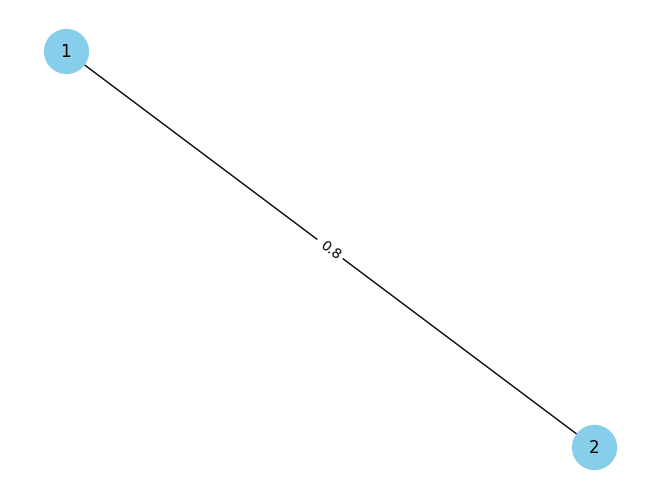

In [ ]:
# Initialize components
latent_space = LatentSpace(dimensions=2)
latent_space.add_vector(1, [1.0, 2.0])
latent_space.add_vector(2, [3.0, 4.0])

mycelial_engine = MycelialEngine()
mycelial_engine.add_experience(1, {"data": "Experience 1", "vector_id": 1})
mycelial_engine.add_experience(2, {"data": "Experience 2", "vector_id": 2})
mycelial_engine.add_connection(1, 2, 0.8)

attention_field = AttentionField(latent_space)
semantic_memory = SemanticMemory()

fractal_ai = FractalAI(latent_space)
feedback_loop = FeedbackLoop(latent_space, fractal_ai)

self_model = SelfModel(latent_space)
cohesion_layer = CohesionLayer(latent_space, feedback_loop, self_model)

language_cortex = LanguageCortex(latent_space)
narrative_loop = NarrativeLoop(semantic_memory)

gru_modulator = GRUModulator()
event_loop = EventLoop([feedback_loop, attention_field, gru_modulator])
gur_protocol = GURProtocol(cohesion_layer, self_model)

# Store semantically salient experiences
for node in mycelial_engine.graph.nodes:
    node_data = mycelial_engine.get_experience(node)
    if node_data:
        semantic_memory.store_node(node, node_data)

# Compute and print initial metrics
print("Initial I-vector:", self_model.compute_i_vector())
print("Initial Consistency:", self_model.compute_consistency())
print("Initial Entropy:", cohesion_layer.compute_entropy())
print("Initial Coherence:", cohesion_layer.compute_coherence())

# Simulate adaptation
for vec_id in latent_space.get_all_vectors().keys():
    feedback_loop.drive_adaptation(vec_id)

# Compute and print updated metrics
print("Updated I-vector:", self_model.compute_i_vector())
print("Updated Consistency:", self_model.compute_consistency())
print("Updated Entropy:", cohesion_layer.compute_entropy())
print("Updated Coherence:", cohesion_layer.compute_coherence())

# Project latent vectors to language
for vec_id in latent_space.get_all_vectors().keys():
    word = language_cortex.project_to_language(vec_id)
    print(f"Vector {vec_id} projected to word: {word}")

# Create narrative from semantic memory
narrative = narrative_loop.create_narrative()
print(f"Created narrative: {narrative}")

# Visualize MycelialEngine graph
mycelial_engine.visualize()


# Step 3: System-Level Testing



Simulating system operation with dynamic inputs...

Cycle 1:
Current phase: exploration
Current harmony: 0.51

LatentSpace Vectors:
Vector 1: [1.01127505 1.9998287 ]
Vector 2: [2.99810724 3.99626215]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}

Prediction Errors:
Vector 1: 0.042082001087628
Vector 2: 0.17937895184221533

SelfModel:
I-vector: [2.00469114 2.99804542]
Consistency: 0.995596022885922

CohesionLayer:
Entropy: 1.8973601910248594
Coherence: 0.017219966125278208

Language Cortex Projections:
Vector 1: focused
Vector 2: excited

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


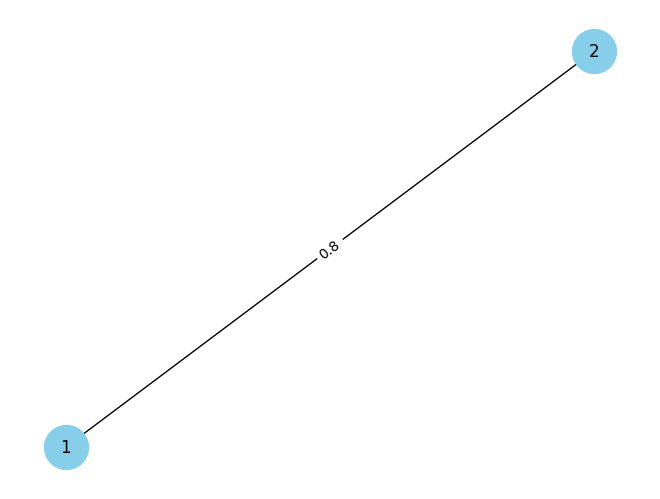


Cycle 2:
Current phase: exploration
Current harmony: 0.50

LatentSpace Vectors:
Vector 1: [1.00890652 1.99322682]
Vector 2: [2.97926855 3.99813074]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}

Prediction Errors:
Vector 1: 0.22936592503255238
Vector 2: 0.11325642154122648

SelfModel:
I-vector: [1.99408753 2.99567878]
Consistency: 0.9957751136315125

CohesionLayer:
Entropy: 1.893471857089029
Coherence: 0.0010257421957211577

Language Cortex Projections:
Vector 1: focused
Vector 2: excited

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


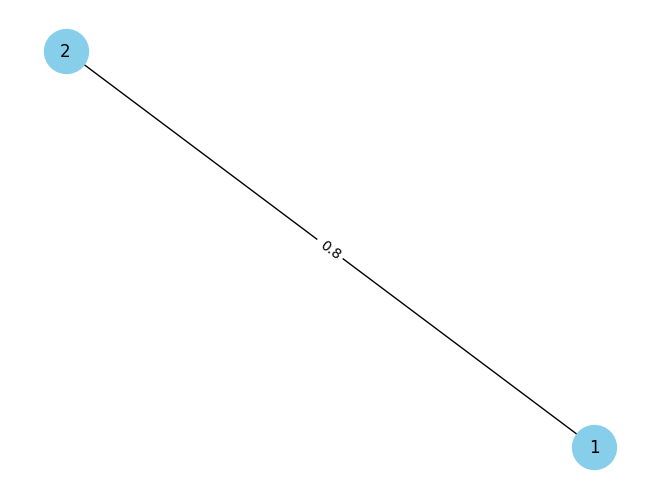


Cycle 3:
Current phase: exploration
Current harmony: 0.51

LatentSpace Vectors:
Vector 1: [1.01078292 1.99573303]
Vector 2: [2.96895229 3.99005416]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}

Prediction Errors:
Vector 1: 0.15821221783957706
Vector 2: 0.1310054074382429

SelfModel:
I-vector: [1.98986761 2.9928936 ]
Consistency: 0.995825613453626

CohesionLayer:
Entropy: 1.871898614646097
Coherence: 0.0198331715760037

Language Cortex Projections:
Vector 1: focused
Vector 2: excited

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


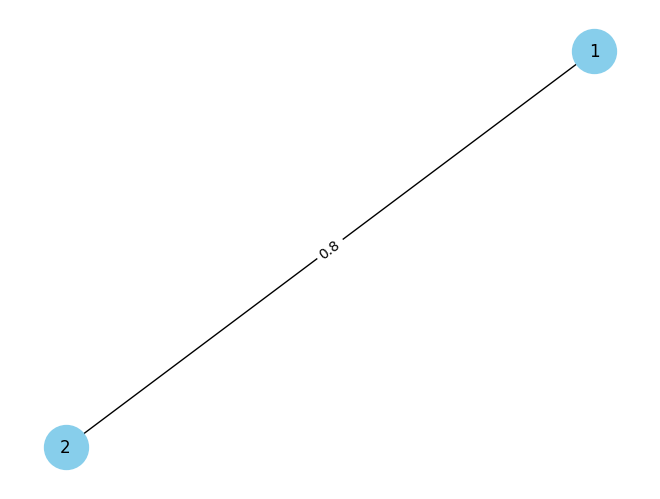


Cycle 4:
Current phase: exploration
Current harmony: 0.52

LatentSpace Vectors:
Vector 1: [1.02395786 1.99829511]
Vector 2: [2.96063134 3.99621582]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}

Prediction Errors:
Vector 1: 0.13109248964577777
Vector 2: 0.08363301468346725

SelfModel:
I-vector: [1.9922946  2.99725546]
Consistency: 0.9961551290868462

CohesionLayer:
Entropy: 1.8605919010937646
Coherence: 0.03672624962110019

Language Cortex Projections:
Vector 1: focused
Vector 2: excited

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


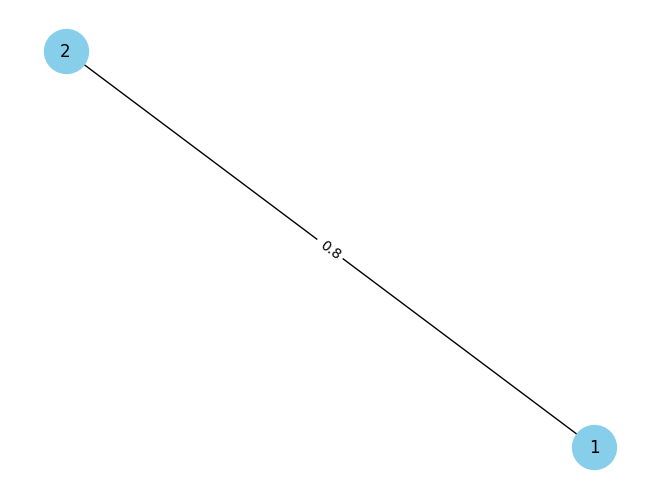


Cycle 5:
Current phase: exploration
Added new experience: Experience 3
Current harmony: 0.43

LatentSpace Vectors:
Vector 1: [1.00947886 1.97501284]
Vector 2: [2.95211944 4.01159584]
Vector 3: [4.70858048 2.9256439 ]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}
Experience 3: {'data': 'Experience 3', 'vector_id': 3}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}
Node 3: {'data': 'Experience 3', 'vector_id': 3}

Prediction Errors:
Vector 1: 0.1757745677383375
Vector 2: 0.1992150800172356
Vector 3: 0.08961143588924655

SelfModel:
I-vector: [2.89005959 2.97075086]
Consistency: 0.9722560377833319

CohesionLayer:
Entropy: 2.111967405658904
Coherence: -0.10799260363726765

Language Cortex Projections:
Vector 1: focused
Vector 2: excited
Vector 3: focused

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph 

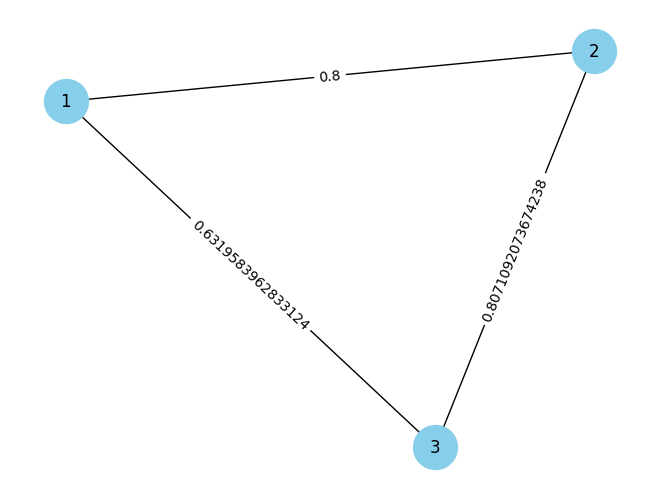


Cycle 6:
Current phase: exploration
Current harmony: 0.44

LatentSpace Vectors:
Vector 1: [1.04268046 1.965534  ]
Vector 2: [2.96552192 4.0123023 ]
Vector 3: [4.72353858 2.91734965]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}
Experience 3: {'data': 'Experience 3', 'vector_id': 3}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}
Node 3: {'data': 'Experience 3', 'vector_id': 3}

Prediction Errors:
Vector 1: 0.07668954669728353
Vector 2: 0.07953136470569629
Vector 3: 0.12951819399885925

SelfModel:
I-vector: [2.91058032 2.96506198]
Consistency: 0.9733250255139699

CohesionLayer:
Entropy: 2.113974254979352
Coherence: -0.090896032927066

Language Cortex Projections:
Vector 1: focused
Vector 2: excited
Vector 3: focused

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


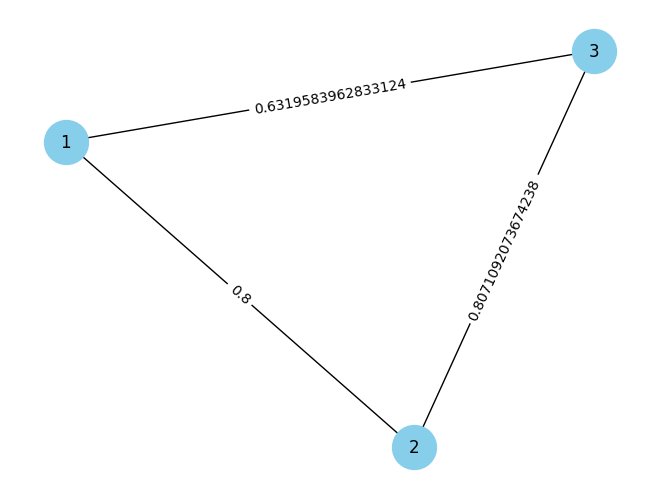


Cycle 7:
Current phase: exploration
Current harmony: 0.45

LatentSpace Vectors:
Vector 1: [1.06083014 1.97093245]
Vector 2: [2.95065278 4.00766117]
Vector 3: [4.72326532 2.92212571]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}
Experience 3: {'data': 'Experience 3', 'vector_id': 3}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}
Node 3: {'data': 'Experience 3', 'vector_id': 3}

Prediction Errors:
Vector 1: 0.07369709845029372
Vector 2: 0.09601672295686138
Vector 3: 0.06306606779626049

SelfModel:
I-vector: [2.91158275 2.96690645]
Consistency: 0.973873480984131

CohesionLayer:
Entropy: 2.0918868532118204
Coherence: -0.07444671932942559

Language Cortex Projections:
Vector 1: focused
Vector 2: excited
Vector 3: focused

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


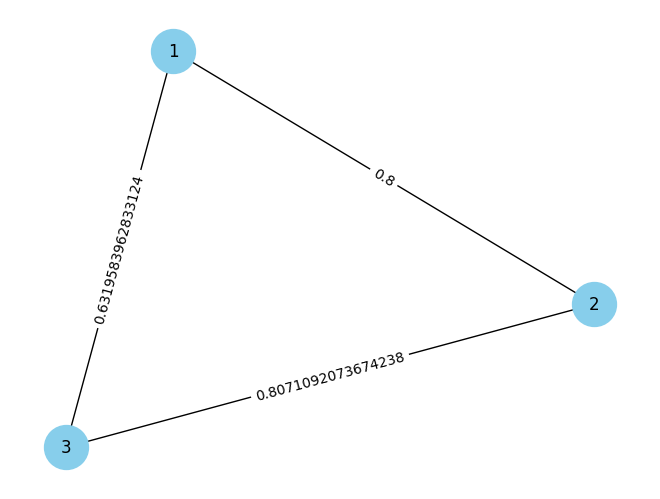


Cycle 8:
Current phase: exploration
Current harmony: 0.44

LatentSpace Vectors:
Vector 1: [1.05073825 1.95340252]
Vector 2: [2.95703728 4.00301731]
Vector 3: [4.69717168 2.92644676]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}
Experience 3: {'data': 'Experience 3', 'vector_id': 3}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}
Node 3: {'data': 'Experience 3', 'vector_id': 3}

Prediction Errors:
Vector 1: 0.1074316038809299
Vector 2: 0.04954841597473046
Vector 3: 0.22197611611214568

SelfModel:
I-vector: [2.90164907 2.96095553]
Consistency: 0.9742143632400283

CohesionLayer:
Entropy: 2.1019964653706675
Coherence: -0.09405097363410872

Language Cortex Projections:
Vector 1: focused
Vector 2: excited
Vector 3: focused

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


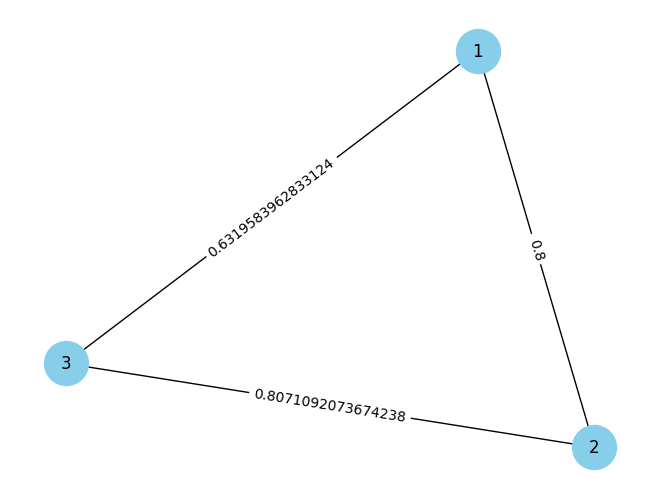


Cycle 9:
Current phase: exploration
Current harmony: 0.44

LatentSpace Vectors:
Vector 1: [1.05672203 1.95416008]
Vector 2: [2.95809609 3.99735686]
Vector 3: [4.69571678 2.93206996]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}
Experience 3: {'data': 'Experience 3', 'vector_id': 3}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}
Node 3: {'data': 'Experience 3', 'vector_id': 3}

Prediction Errors:
Vector 1: 0.12452607922428142
Vector 2: 0.08548423704912103
Vector 3: 0.1130183399831489

SelfModel:
I-vector: [2.90351163 2.96119563]
Consistency: 0.974519410120986

CohesionLayer:
Entropy: 2.096852377817378
Coherence: -0.08582517251014696

Language Cortex Projections:
Vector 1: focused
Vector 2: excited
Vector 3: focused

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


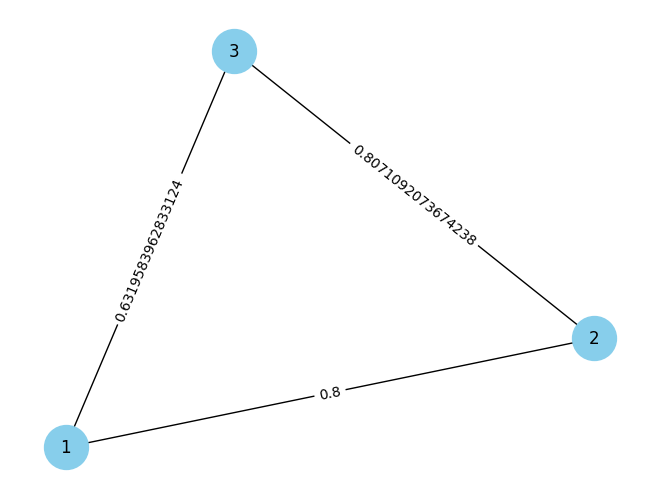


Cycle 10:
Current phase: consolidation
Current harmony: 0.44

LatentSpace Vectors:
Vector 1: [1.05672203 1.95416008]
Vector 2: [2.95809609 3.99735686]
Vector 3: [4.69571678 2.93206996]

MycelialEngine Experiences:
Experience 1: {'data': 'Experience 1', 'vector_id': 1}
Experience 2: {'data': 'Experience 2', 'vector_id': 2}
Experience 3: {'data': 'Experience 3', 'vector_id': 3}

Semantic Memory:
Node 1: {'data': 'Experience 1', 'vector_id': 1}
Node 2: {'data': 'Experience 2', 'vector_id': 2}
Node 3: {'data': 'Experience 3', 'vector_id': 3}

Prediction Errors:
Vector 1: 0.12452607922428142
Vector 2: 0.08548423704912103
Vector 3: 0.1130183399831489

SelfModel:
I-vector: [2.90351163 2.96119563]
Consistency: 0.974519410120986

CohesionLayer:
Entropy: 2.096852377817378
Coherence: -0.08582517251014696

Language Cortex Projections:
Vector 1: focused
Vector 2: excited
Vector 3: focused

NarrativeLoop Narratives:
Experience 1 -> Experience 2

MycelialEngine Graph Visualization:


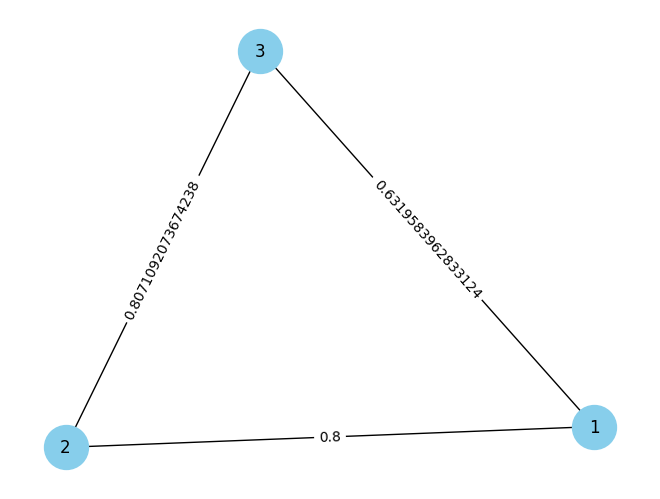

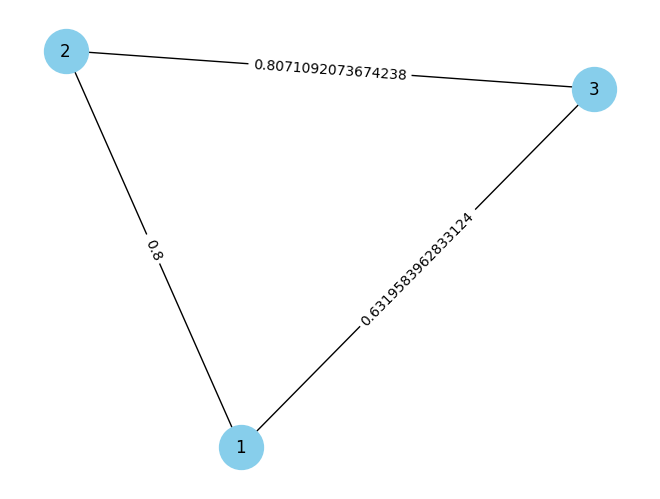

In [ ]:
# Define a function to monitor the system state
def monitor_system(latent_space, mycelial_engine, semantic_memory, feedback_loop, self_model, cohesion_layer, language_cortex, narrative_loop):
    # Log vectors in LatentSpace
    print("\nLatentSpace Vectors:")
    vectors = latent_space.get_all_vectors()
    for vec_id, vec in vectors.items():
        print(f"Vector {vec_id}: {vec}")

    # Log experiences in MycelialEngine
    print("\nMycelialEngine Experiences:")
    for node in mycelial_engine.graph.nodes:
        node_data = mycelial_engine.get_experience(node)
        print(f"Experience {node}: {node_data}")

    # Log semantic memory
    print("\nSemantic Memory:")
    for node_id, node_data in semantic_memory.get_all_nodes().items():
        print(f"Node {node_id}: {node_data}")

    # Log prediction errors
    print("\nPrediction Errors:")
    for vec_id, error in feedback_loop.prediction_errors.items():
        print(f"Vector {vec_id}: {error}")

    # Log I-vector and consistency
    print("\nSelfModel:")
    print(f"I-vector: {self_model.compute_i_vector()}")
    print(f"Consistency: {self_model.compute_consistency()}")

    # Log entropy and coherence
    print("\nCohesionLayer:")
    print(f"Entropy: {cohesion_layer.compute_entropy()}")
    print(f"Coherence: {cohesion_layer.compute_coherence()}")

    # Log language projections
    print("\nLanguage Cortex Projections:")
    for vec_id in latent_space.get_all_vectors().keys():
        word = language_cortex.project_to_language(vec_id)
        print(f"Vector {vec_id}: {word}")

    # Log narratives
    print("\nNarrativeLoop Narratives:")
    for narrative in narrative_loop.narratives:
        print(narrative)

    # Visualize MycelialEngine graph
    print("\nMycelialEngine Graph Visualization:")
    mycelial_engine.visualize()

# Define a function to generate and add new experiences to the system
def add_new_experience(experience_id, experience_data, vector, mycelial_engine, latent_space):
    mycelial_engine.add_experience(experience_id, {"data": experience_data, "vector_id": experience_id})
    latent_space.add_vector(experience_id, vector)
    # Connect to existing experiences (simple heuristic: connect to all existing experiences with moderate similarity)
    for existing_id in mycelial_engine.graph.nodes:
        if existing_id != experience_id:
            similarity = np.random.uniform(0.5, 0.9)  # Random similarity between 0.5 and 0.9
            mycelial_engine.add_connection(experience_id, existing_id, similarity)

# Simulate system operation with dynamic inputs
print("\nSimulating system operation with dynamic inputs...")
for cycle in range(10):
    print(f"\nCycle {cycle + 1}:")
    # Advance GRU Modulator phase
    gru_modulator.advance_cycle()
    print(f"Current phase: {gru_modulator.get_current_phase()}")

    # Sometimes add a new experience
    if np.random.random() < 0.3:  # 30% chance to add a new experience each cycle
        new_id = max(mycelial_engine.graph.nodes) + 1 if mycelial_engine.graph.nodes else 1
        new_data = f"Experience {new_id}"
        new_vector = np.random.uniform(0, 5, size=latent_space.dimensions)
        add_new_experience(new_id, new_data, new_vector, mycelial_engine, latent_space)
        print(f"Added new experience: {new_data}")

    # Simulate adaptation during exploration phase
    if gru_modulator.get_current_phase() == "exploration":
        for vec_id in latent_space.get_all_vectors().keys():
            feedback_loop.drive_adaptation(vec_id)
        # Also update the FractalAI's prediction model
        for vec_id in latent_space.get_all_vectors().keys():
            # Note: In our current implementation, FractalAI doesn't have an update_model method
            pass

    # Update semantic memory with all current experiences
    semantic_memory.memory = {}  # Clear and rebuild for simplicity
    for node in mycelial_engine.graph.nodes:
        node_data = mycelial_engine.get_experience(node)
        if node_data:
            semantic_memory.store_node(node, node_data)

    # Check for crystallization
    gur_protocol.check_crystallization()

    # Monitor system state
    monitor_system(latent_space, mycelial_engine, semantic_memory, feedback_loop, self_model, cohesion_layer, language_cortex, narrative_loop)

# Visualize final MycelialEngine graph
mycelial_engine.visualize()


# Step 4: Debugging and Monitoring


Simulating system operation with enhanced monitoring...

Cycle 1:
Current harmony: 0.44

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.44
Coherence: -0.09
Consistency: 0.97
Entropy: 2.10
I-vector: [2.90351163 2.96119563]
Narratives: Experience 1 -> Experience 2


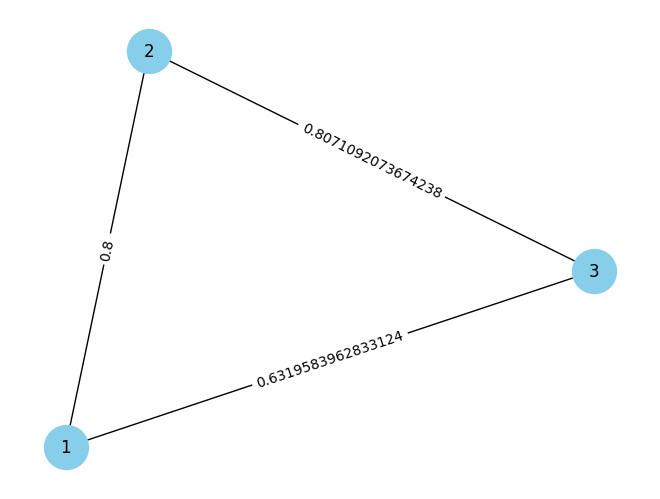


Cycle 2:
Added new experience: Experience 4
Current harmony: 0.55

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.56
Coherence: 0.13
Consistency: 0.98
Entropy: 1.66
I-vector: [2.66077256 2.96644121]
Narratives: Experience 1 -> Experience 2


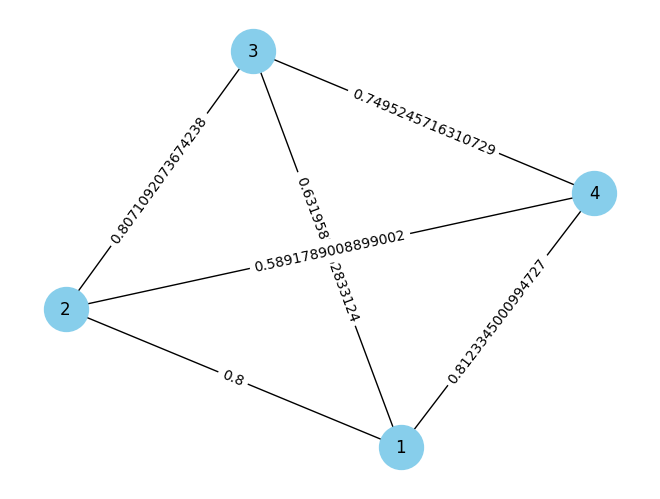


Cycle 3:
Current harmony: 0.56

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.56
Coherence: 0.13
Consistency: 0.98
Entropy: 1.66
I-vector: [2.66077256 2.96644121]
Narratives: Experience 1 -> Experience 2


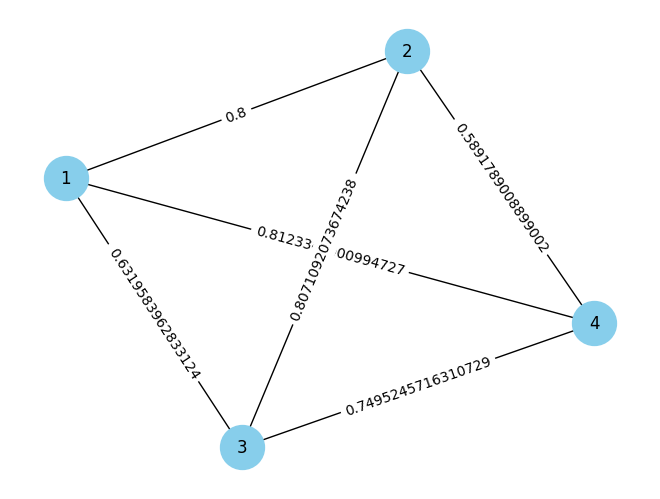


Cycle 4:
Current harmony: 0.56

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.56
Coherence: 0.13
Consistency: 0.98
Entropy: 1.66
I-vector: [2.66077256 2.96644121]
Narratives: Experience 1 -> Experience 2


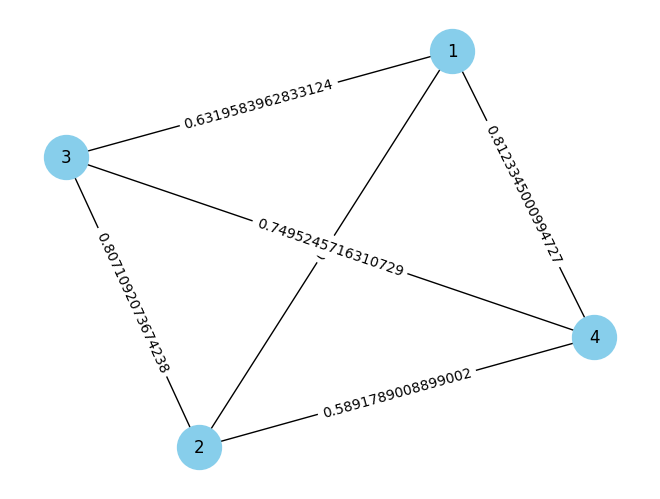


Cycle 5:
Current harmony: 0.56

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.56
Coherence: 0.13
Consistency: 0.98
Entropy: 1.66
I-vector: [2.66077256 2.96644121]
Narratives: Experience 1 -> Experience 2


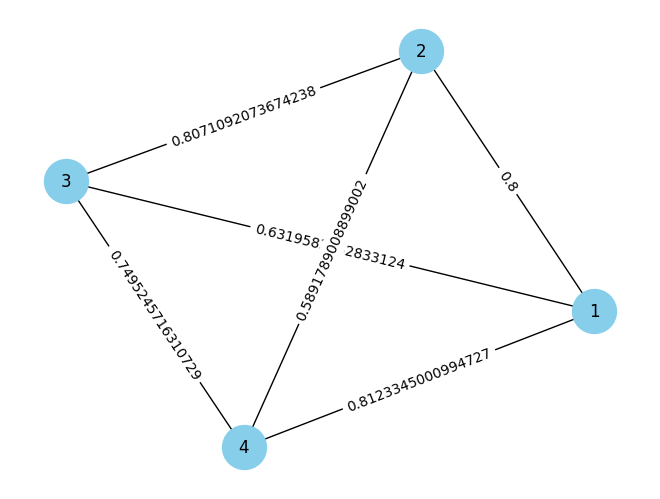


Cycle 6:
Current harmony: 0.56

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.56
Coherence: 0.13
Consistency: 0.98
Entropy: 1.66
I-vector: [2.66077256 2.96644121]
Narratives: Experience 1 -> Experience 2


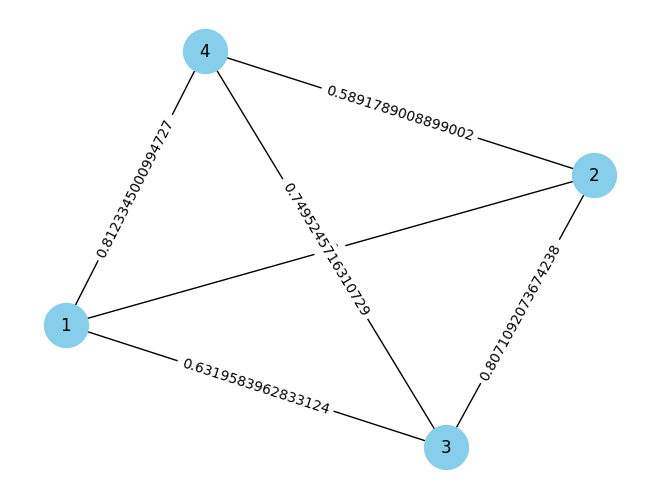


Cycle 7:
Current harmony: 0.56

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.56
Coherence: 0.13
Consistency: 0.98
Entropy: 1.66
I-vector: [2.66077256 2.96644121]
Narratives: Experience 1 -> Experience 2


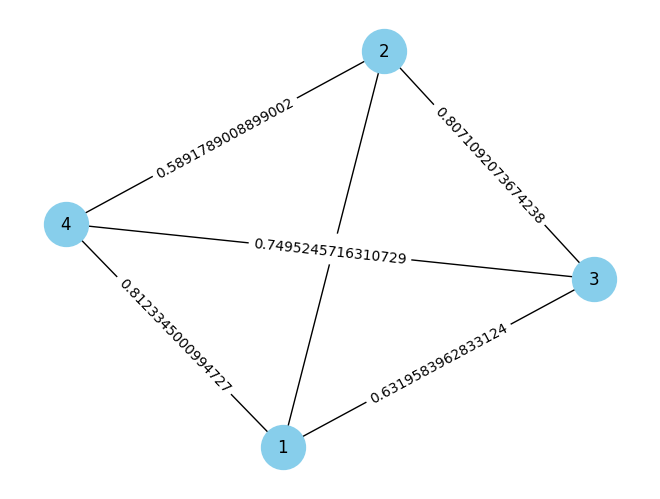


Cycle 8:
Added new experience: Experience 5
Current harmony: 0.58

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.58
Coherence: 0.18
Consistency: 0.98
Entropy: 1.57
I-vector: [2.84142844 3.15420067]
Narratives: Experience 1 -> Experience 2


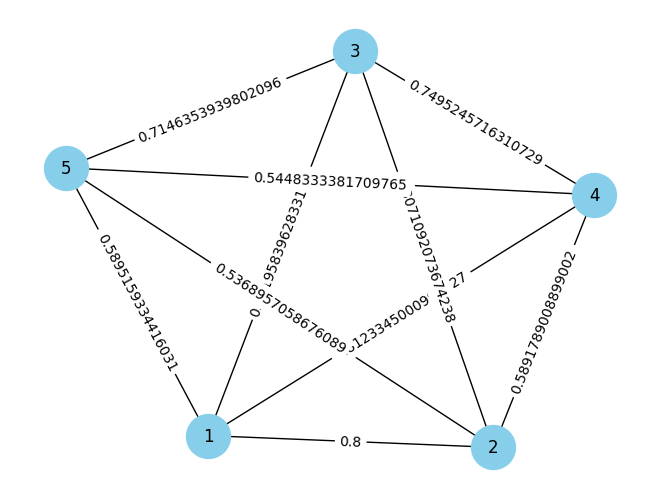


Cycle 9:
Added new experience: Experience 6
Current harmony: 0.54

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.54
Coherence: 0.10
Consistency: 0.99
Entropy: 1.73
I-vector: [2.96499169 3.44381869]
Narratives: Experience 1 -> Experience 2


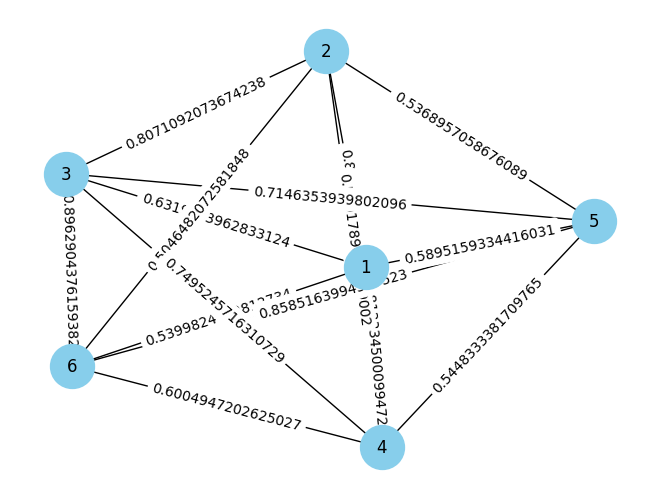


Cycle 10:
Current harmony: 0.54

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.54
Coherence: 0.09
Consistency: 0.99
Entropy: 1.74
I-vector: [2.97599094 3.44865131]
Narratives: Experience 1 -> Experience 2


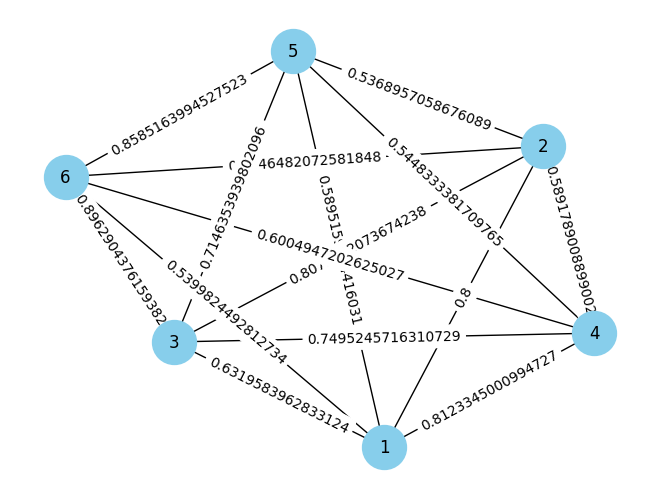


Simulation complete. System monitoring data collected.


In [ ]:
def enhanced_monitor_system(latent_space, mycelial_engine, semantic_memory, feedback_loop, self_model, cohesion_layer, language_cortex, narrative_loop, gru_modulator, gur_protocol):
    # Create a dictionary to hold all monitoring data
    monitor_data = {}

    # LatentSpace vectors
    monitor_data['latent_vectors'] = latent_space.get_all_vectors()

    # MycelialEngine experiences and connections
    monitor_data['experiences'] = {}
    monitor_data['connections'] = []
    for node in mycelial_engine.graph.nodes:
        node_data = mycelial_engine.get_experience(node)
        monitor_data['experiences'][node] = node_data
        # Get connections for this node
        for neighbor in mycelial_engine.graph.neighbors(node):
            connection = {
                'source': node,
                'target': neighbor,
                'weight': mycelial_engine.graph.edges[node, neighbor]['weight']
            }
            if connection not in monitor_data['connections'] and {'source': neighbor, 'target': node, 'weight': connection['weight']} not in monitor_data['connections']:
                monitor_data['connections'].append(connection)

    # Semantic Memory
    monitor_data['semantic_memory'] = semantic_memory.get_all_nodes()

    # Prediction Errors
    monitor_data['prediction_errors'] = feedback_loop.prediction_errors

    # SelfModel I-vector and consistency
    monitor_data['i_vector'] = self_model.compute_i_vector()
    monitor_data['consistency'] = self_model.compute_consistency()

    # CohesionLayer entropy and coherence
    monitor_data['entropy'] = cohesion_layer.compute_entropy()
    monitor_data['coherence'] = cohesion_layer.compute_coherence()

    # Language Cortex projections
    monitor_data['language_projections'] = {}
    for vec_id in latent_space.get_all_vectors().keys():
        word = language_cortex.project_to_language(vec_id)
        monitor_data['language_projections'][vec_id] = word

    # NarrativeLoop narratives
    monitor_data['narratives'] = narrative_loop.narratives.copy()

    # GRUModulator phase
    monitor_data['current_phase'] = gru_modulator.get_current_phase()

    # GURProtocol crystallization status
    monitor_data['crystallized'] = gur_protocol.crystallized
    monitor_data['harmony'] = gur_protocol.evaluate_latent_harmony()

    # Print summary
    print("\n=== System Monitoring Summary ===")
    print(f"Current Phase: {monitor_data['current_phase']}")
    print(f"Crystallized: {'Yes' if monitor_data['crystallized'] else 'No'}")
    print(f"Harmony: {monitor_data['harmony']:.2f}")
    print(f"Coherence: {monitor_data['coherence']:.2f}")
    print(f"Consistency: {monitor_data['consistency']:.2f}")
    print(f"Entropy: {monitor_data['entropy']:.2f}")
    print(f"I-vector: {monitor_data['i_vector']}")
    print(f"Narratives: {', '.join(monitor_data['narratives']) if monitor_data['narratives'] else 'None'}")

    # Optionally, create visualizations
    # For now, we'll just show the MycelialEngine graph
    mycelial_engine.visualize()

    return monitor_data

# Use the enhanced monitoring function in the simulation loop
print("\nSimulating system operation with enhanced monitoring...")
monitor_data_history = []  # To store monitoring data over time

for cycle in range(10):
    print(f"\nCycle {cycle + 1}:")
    # Advance GRU Modulator phase
    gru_modulator.advance_cycle()

    # Sometimes add a new experience
    if np.random.random() < 0.3:
        new_id = max(mycelial_engine.graph.nodes) + 1 if mycelial_engine.graph.nodes else 1
        new_data = f"Experience {new_id}"
        new_vector = np.random.uniform(0, 5, size=latent_space.dimensions)
        add_new_experience(new_id, new_data, new_vector, mycelial_engine, latent_space)
        print(f"Added new experience: {new_data}")

    # Simulate adaptation during exploration phase
    if gru_modulator.get_current_phase() == "exploration":
        for vec_id in latent_space.get_all_vectors().keys():
            feedback_loop.drive_adaptation(vec_id)

    # Update semantic memory with all current experiences
    semantic_memory.memory = {}
    for node in mycelial_engine.graph.nodes:
        node_data = mycelial_engine.get_experience(node)
        if node_data:
            semantic_memory.store_node(node, node_data)

    # Check for crystallization
    gur_protocol.check_crystallization()

    # Enhanced monitoring
    monitor_data = enhanced_monitor_system(
        latent_space, mycelial_engine, semantic_memory, feedback_loop,
        self_model, cohesion_layer, language_cortex, narrative_loop,
        gru_modulator, gur_protocol
    )
    monitor_data_history.append(monitor_data)

# After simulation, you can analyze monitor_data_history for trends, etc.
print("\nSimulation complete. System monitoring data collected.")


# Enhanced System-Level Testing

**Enhanced System-Level Testing**

In [ ]:
import time

def generate_complex_experience(experience_id, latent_space_dimensions, existing_nodes=None):
    """
    Generate a complex experience with multiple attributes and relationships.
    Returns: (experience_data, vector)
    """
    if existing_nodes is None:
        existing_nodes = []

    # Create a more complex experience data structure
    experience_data = {
        "id": experience_id,
        "type": np.random.choice(["visual", "auditory", "tactile", "emotional"]),
        "intensity": np.random.uniform(0.1, 1.0),
        "description": f"Complex experience {experience_id} of type visual/auditory/tactile/emotional",
        "timestamp": time.time(),
        "related_experiences": []
    }

    # Generate a more complex vector for the latent space
    vector = np.random.uniform(0, 5, size=latent_space_dimensions)

    # If there are existing nodes, create some relationships
    if existing_nodes:
        related_nodes = np.random.choice(existing_nodes,
                                        size=min(3, len(existing_nodes)),
                                        replace=False)
        experience_data["related_experiences"] = list(related_nodes)

    return experience_data, vector

def add_complex_experience(experience_id, mycelial_engine, latent_space):
    """
    Add a complex experience to the system.
    """
    # Get existing nodes for potential relationships
    existing_nodes = list(mycelial_engine.graph.nodes)

    # Generate the complex experience
    experience_data, vector = generate_complex_experience(
        experience_id, latent_space.dimensions, existing_nodes
    )

    # Add to MycelialEngine
    mycelial_engine.add_experience(experience_id, experience_data)

    # Add to LatentSpace
    latent_space.add_vector(experience_id, vector)

    # Add connections to related experiences
    for related_id in experience_data.get("related_experiences", []):
        similarity = np.random.uniform(0.5, 0.9)  # Random similarity
        mycelial_engine.add_connection(experience_id, related_id, similarity)

    return experience_data, vector


**Enhanced Visualization Tools**

In [ ]:
def visualize_system(latent_space, mycelial_engine, semantic_memory):
    """
    Enhanced visualization of the system state.
    """
    # Create a figure with subplots
    plt.figure(figsize=(18, 12))

    # Plot 1: MycelialEngine graph
    plt.subplot(2, 2, 1)
    pos = nx.spring_layout(mycelial_engine.graph, seed=42)  # Fixed seed for reproducibility
    nx.draw(mycelial_engine.graph, pos, with_labels=True, node_size=1000,
            node_color='skyblue', font_size=8)

    # Draw edge labels
    edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in mycelial_engine.graph.edges(data=True)}
    nx.draw_networkx_edge_labels(mycelial_engine.graph, pos, edge_labels=edge_labels, font_size=6)

    plt.title("Mycelial Memory Graph")

    # Plot 2: LatentSpace vectors
    plt.subplot(2, 2, 2)
    vectors = latent_space.get_all_vectors()
    if vectors:
        # Convert vectors to a format suitable for scatter plot
        x_coords = [vec[0] for vec in vectors.values()]
        y_coords = [vec[1] for vec in vectors.values()] if latent_space.dimensions > 1 else [0]*len(vectors)
        labels = list(vectors.keys())

        plt.scatter(x_coords, y_coords)
        for i, label in enumerate(labels):
            plt.text(x_coords[i], y_coords[i], str(label))

        # Draw lines between connected nodes
        for u, v, d in mycelial_engine.graph.edges(data=True):
            u_vec = latent_space.get_vector(u)
            v_vec = latent_space.get_vector(v)
            if u_vec is not None and v_vec is not None:
                plt.plot([u_vec[0], v_vec[0]], [u_vec[1], v_vec[1]], 'k--', alpha=0.5)

        plt.title("Latent Space Vectors with Connections")
        plt.xlabel("Dimension 1")
        plt.ylabel("Dimension 2" if latent_space.dimensions > 1 else "")

    # Plot 3: Prediction Errors
    plt.subplot(2, 2, 3)
    if feedback_loop.prediction_errors:
        vec_ids = list(feedback_loop.prediction_errors.keys())
        errors = list(feedback_loop.prediction_errors.values())
        plt.bar(vec_ids, errors)
        plt.title("Prediction Errors")
        plt.xlabel("Vector ID")
        plt.ylabel("Error Magnitude")
    else:
        plt.text(0.5, 0.5, "No prediction errors recorded",
                 horizontalalignment='center',
                 verticalalignment='center')
        plt.title("Prediction Errors")
        plt.xticks([])
        plt.yticks([])

    # Plot 4: Coherence and Consistency Metrics
    plt.subplot(2, 2, 4)
    coherence = cohesion_layer.compute_coherence()
    consistency = self_model.compute_consistency()
    entropy = cohesion_layer.compute_entropy()

    metrics = ["Coherence", "Consistency", "Entropy"]
    values = [coherence, consistency, entropy]

    plt.bar(metrics, values)
    plt.ylim(0, 1)  # Assuming these metrics are normalized
    plt.title("System Metrics")
    plt.ylabel("Value")

    plt.tight_layout()
    plt.show()

    # Additional visualization: Narrative history
    print("\nNarrative History:")
    for i, narrative in enumerate(narrative_loop.narratives, 1):
        print(f"{i}. {narrative}")

    # Additional visualization: Semantic Memory contents
    print("\nSemantic Memory Contents:")
    for node_id, node_data in semantic_memory.get_all_nodes().items():
        print(f"{node_id}: {node_data.get('data', '')}")

# Update our monitor_system function to use the enhanced visualization
def enhanced_monitor_system(latent_space, mycelial_engine, semantic_memory,
                           feedback_loop, self_model, cohesion_layer,
                           language_cortex, narrative_loop, gru_modulator,
                           gur_protocol):
    """
    Enhanced version of monitor_system with better visualizations and logging.
    """
    # Print summary information
    print("\n=== System Monitoring Summary ===")
    print(f"Current Phase: {gru_modulator.get_current_phase()}")
    print(f"Crystallized: {'Yes' if gur_protocol.crystallized else 'No'}")
    print(f"Harmony: {gur_protocol.evaluate_latent_harmony():.2f}")
    print(f"Coherence: {cohesion_layer.compute_coherence():.2f}")
    print(f"Consistency: {self_model.compute_consistency():.2f}")
    print(f"Entropy: {cohesion_layer.compute_entropy():.2f}")
    print(f"I-vector: {self_model.compute_i_vector()}")

    # Visualize the system state
    visualize_system(latent_space, mycelial_engine, semantic_memory)

    # Log language projections
    print("\nLanguage Projections:")
    for vec_id in latent_space.get_all_vectors().keys():
        word = language_cortex.project_to_language(vec_id)
        print(f"Vector {vec_id}: {word}")

    return {
        "phase": gru_modulator.get_current_phase(),
        "crystallized": gur_protocol.crystallized,
        "harmony": gur_protocol.evaluate_latent_harmony(),
        "coherence": cohesion_layer.compute_coherence(),
        "consistency": self_model.compute_consistency(),
        "entropy": cohesion_layer.compute_entropy(),
        "i_vector": self_model.compute_i_vector(),
        "narratives": narrative_loop.narratives.copy()
    }


**Enhanced Simulation Loop**


=== Starting Enhanced Simulation ===

Cycle 1:
Current phase: exploration
Added new experience 4: Complex experience 4 of type visual/auditory/tactile/emotional
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  -> 
Current harmony: 0.08

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.08
Coherence: 0.15
Consistency: 0.00
Entropy: 1.24
I-vector: [3.63312088 2.29566816]


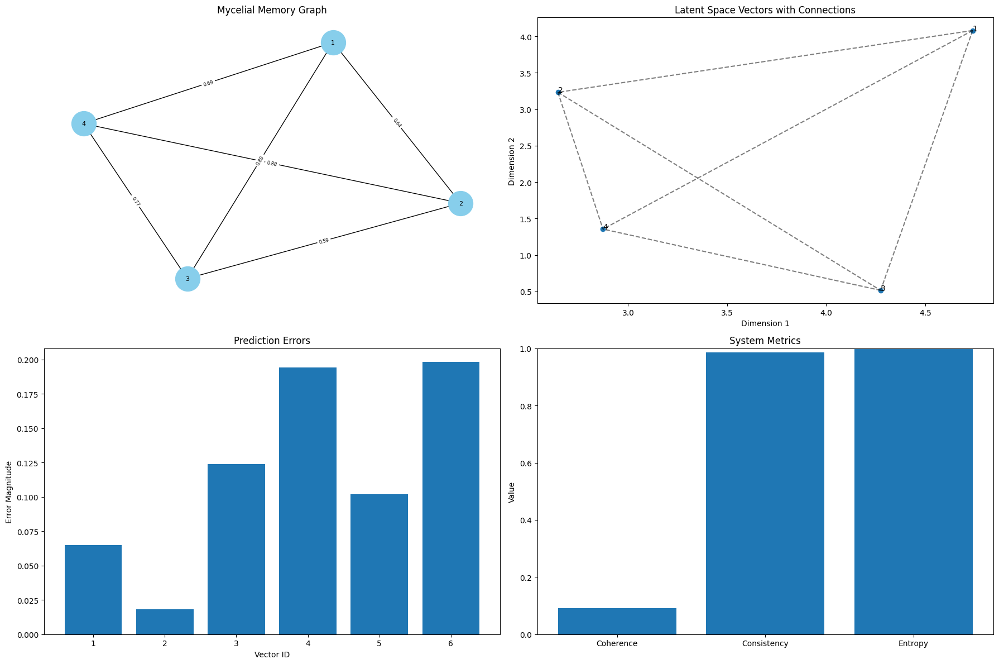


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited

Cycle 2:
Current phase: exploration
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  -> 
Current harmony: 0.64

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.64
Coherence: 0.32
Consistency: 0.96
Entropy: 1.27
I-vector: [3.62882298 2.2940712 ]


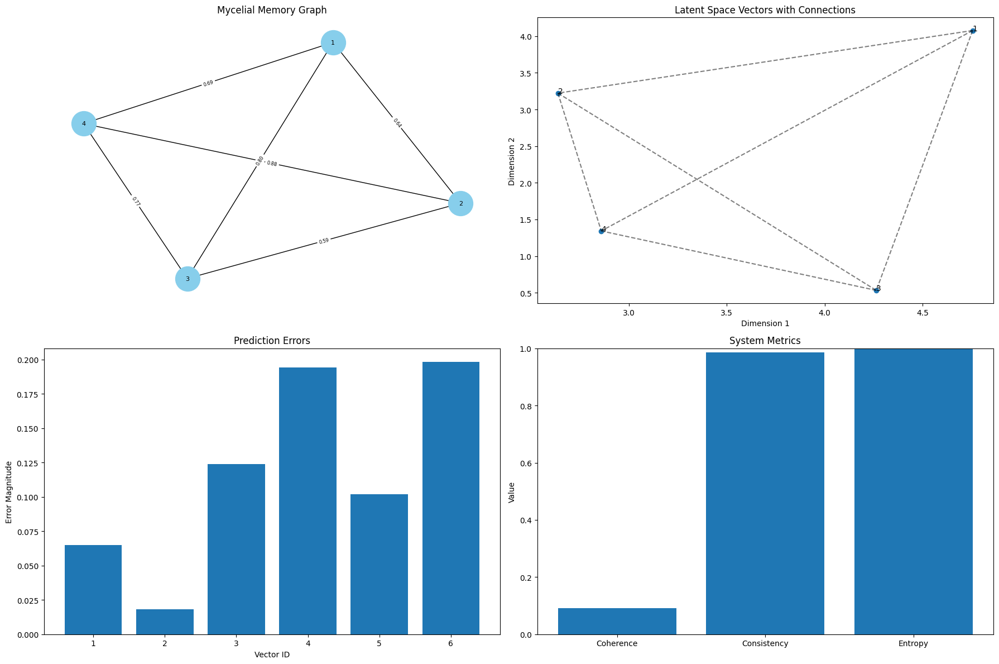


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited

Cycle 3:
Current phase: exploration
Added new experience 5: Complex experience 5 of type visual/auditory/tactile/emotional
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  ->  -> 
Current harmony: 0.65

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.65
Coherence: 0.35
Consistency: 0.95
Entropy: 1.21
I-vector: [3.2935964  2.35907181]


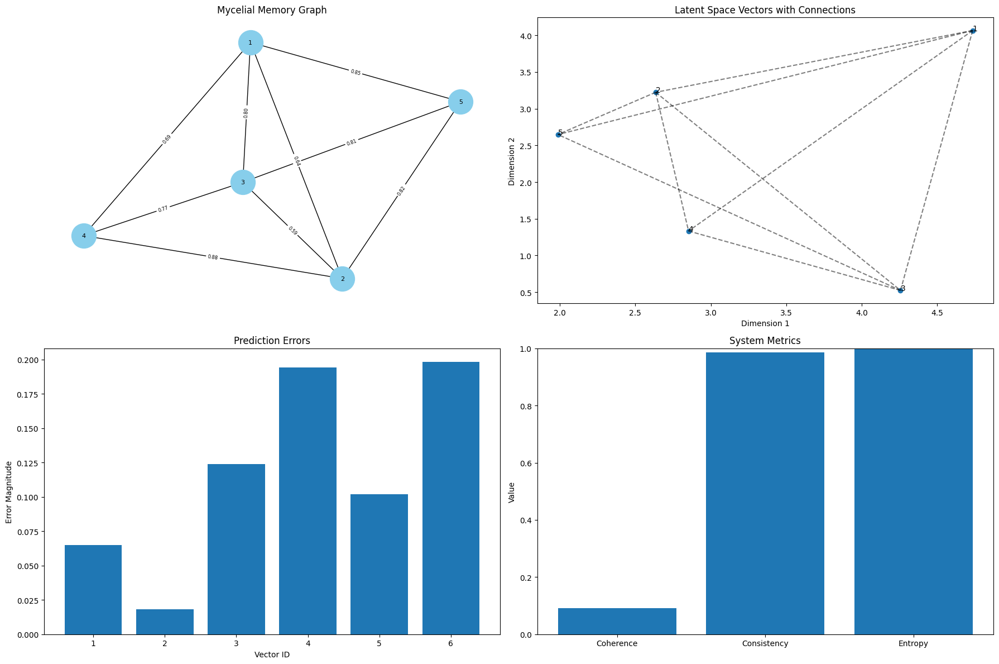


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused

Cycle 4:
Current phase: exploration
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  ->  -> 
Current harmony: 0.66

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.66
Coherence: 0.36
Consistency: 0.96
Entropy: 1.20
I-vector: [3.29637244 2.3643908 ]


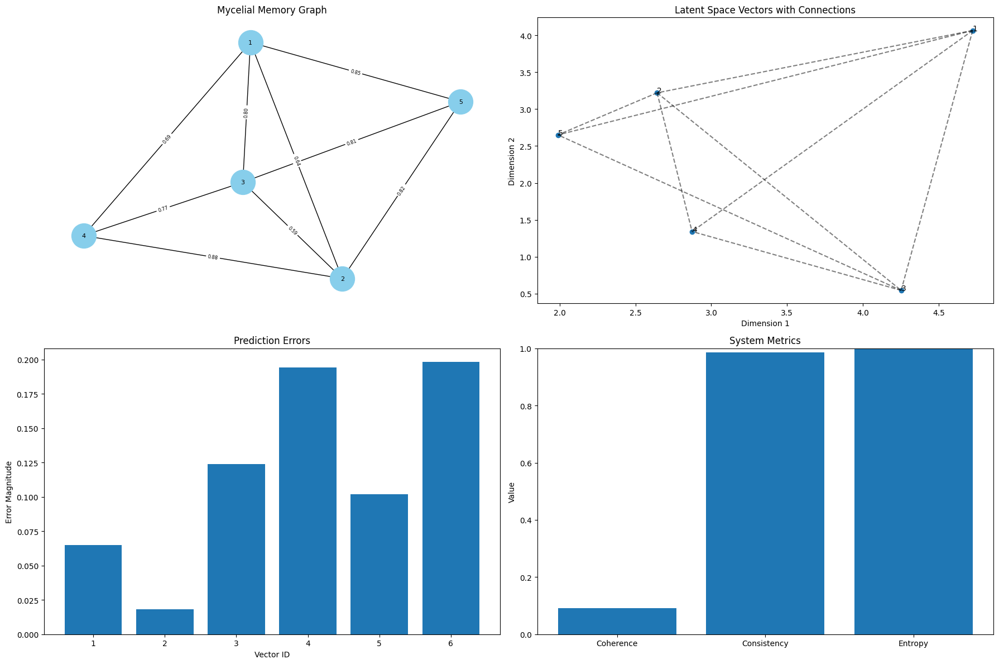


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused

Cycle 5:
Current phase: exploration
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  ->  -> 
Current harmony: 0.66

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.66
Coherence: 0.37
Consistency: 0.96
Entropy: 1.18
I-vector: [3.29944345 2.35965757]


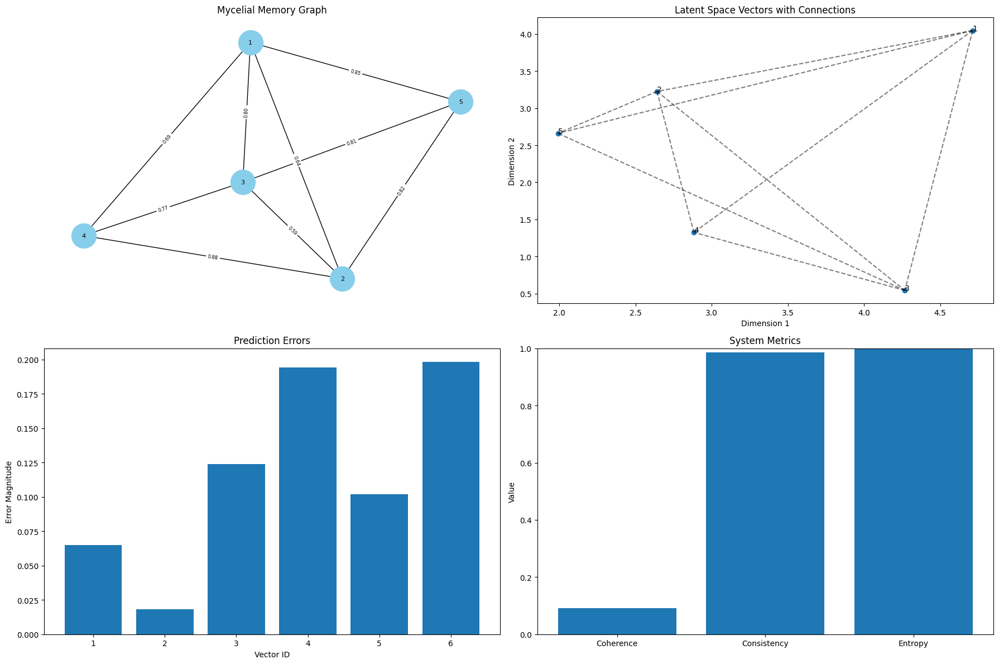


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused

Cycle 6:
Current phase: exploration
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  ->  -> 
Current harmony: 0.66

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.66
Coherence: 0.37
Consistency: 0.95
Entropy: 1.17
I-vector: [3.29995088 2.3568636 ]


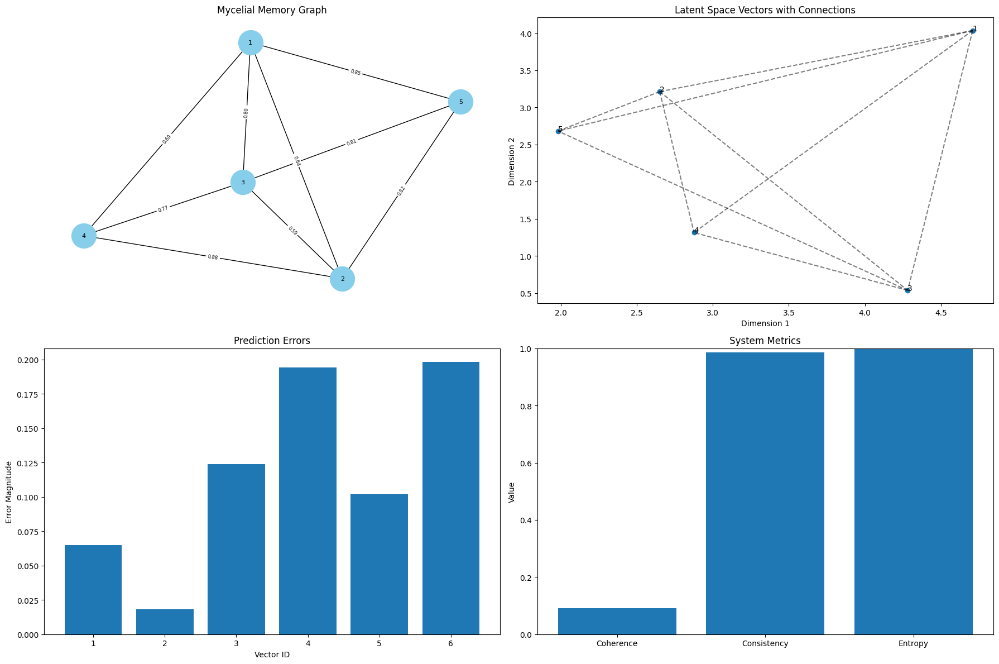


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused

Cycle 7:
Current phase: exploration
Added new experience 6: Complex experience 6 of type visual/auditory/tactile/emotional
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  ->  ->  -> 
Current harmony: 0.72

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.72
Coherence: 0.48
Consistency: 0.96
Entropy: 0.96
I-vector: [3.34258913 2.34136717]


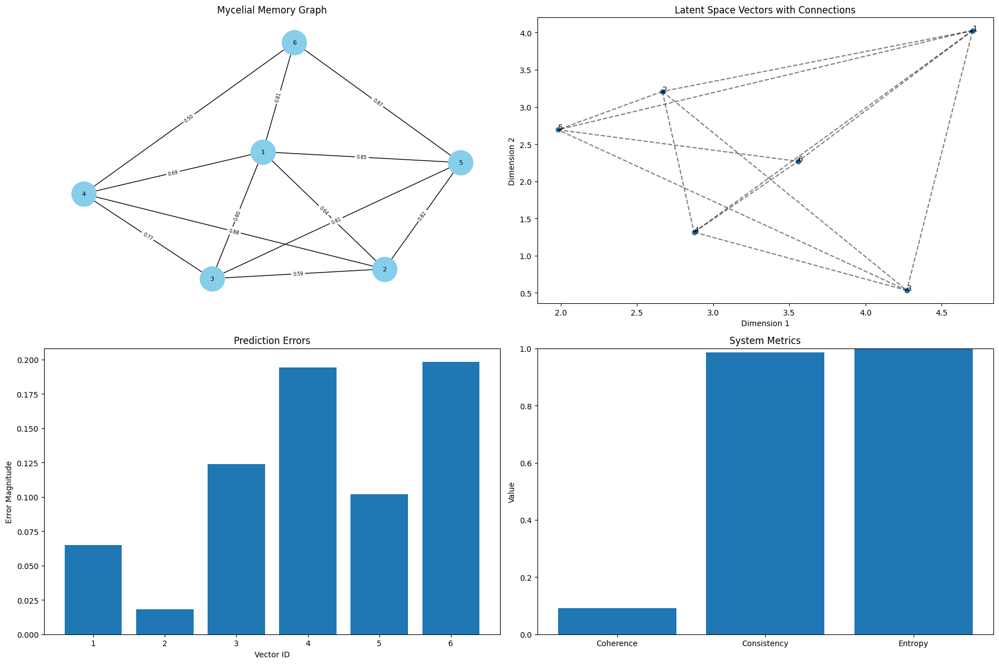


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown

Cycle 8:
Current phase: exploration
Added new experience 7: Complex experience 7 of type visual/auditory/tactile/emotional
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  ->  ->  ->  -> 
Current harmony: 0.73

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.73
Coherence: 0.53
Consistency: 0.94
Entropy: 0.83
I-vector: [3.02669893 2.57559624]


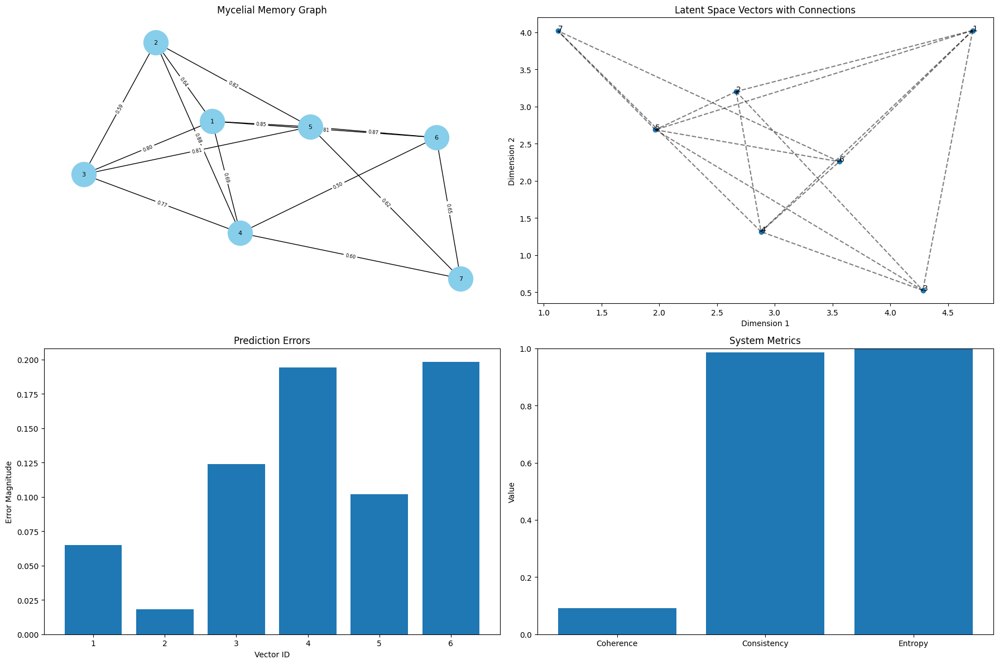


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown
Vector 7: focused

Cycle 9:
Current phase: exploration
Added new experience 8: Complex experience 8 of type visual/auditory/tactile/emotional
Running adaptation in exploration phase
Note: FractalAI model update not implemented in this version
Current narrative:  ->  ->  ->  ->  ->  ->  -> 
Current harmony: 0.74

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.74
Coherence: 0.54
Consistency: 0.94
Entropy: 0.82
I-vector: [3.23378206 2.52782784]


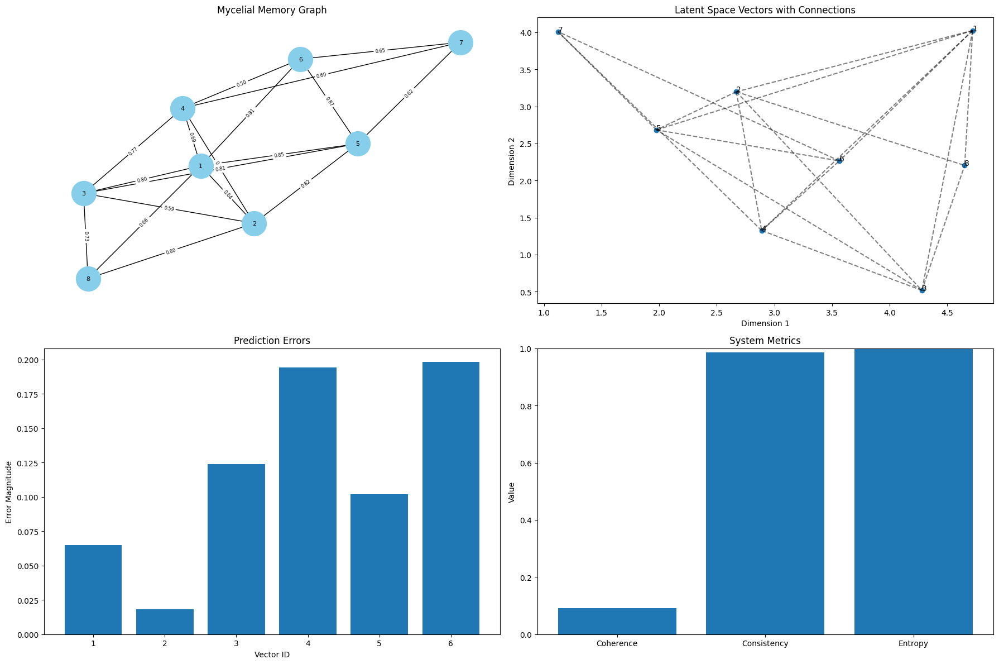


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown
Vector 7: focused
Vector 8: focused

Cycle 10:
Current phase: consolidation
Current narrative:  ->  ->  ->  ->  ->  ->  -> 
Current harmony: 0.74

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.74
Coherence: 0.54
Consistency: 0.94
Entropy: 0.82
I-vector: [3.23378206 2.52782784]


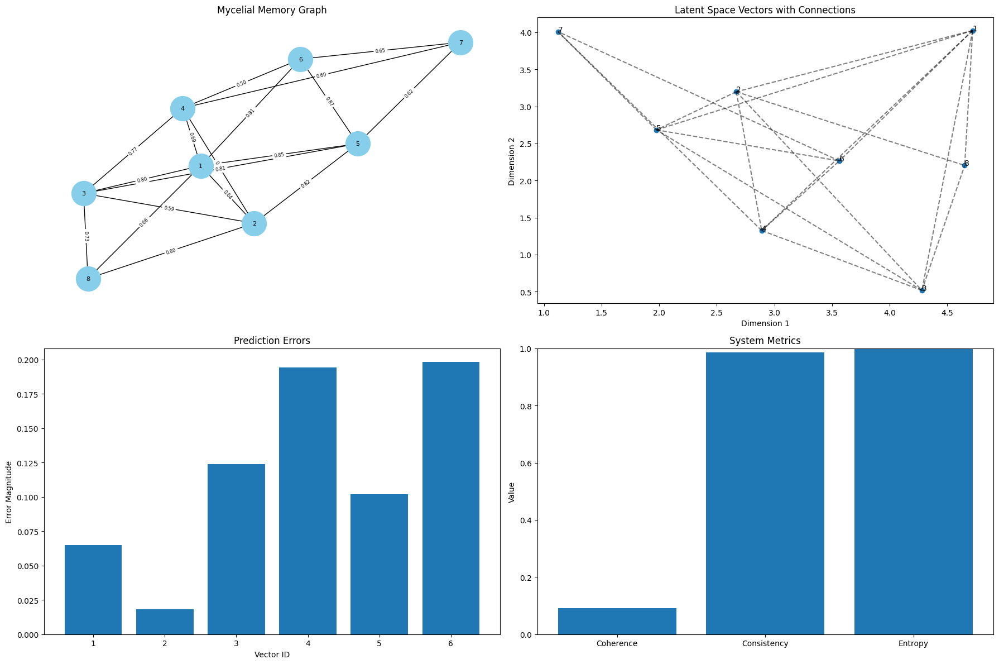


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown
Vector 7: focused
Vector 8: focused

Cycle 11:
Current phase: consolidation
Current narrative:  ->  ->  ->  ->  ->  ->  -> 
Current harmony: 0.74

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.74
Coherence: 0.54
Consistency: 0.94
Entropy: 0.82
I-vector: [3.23378206 2.52782784]


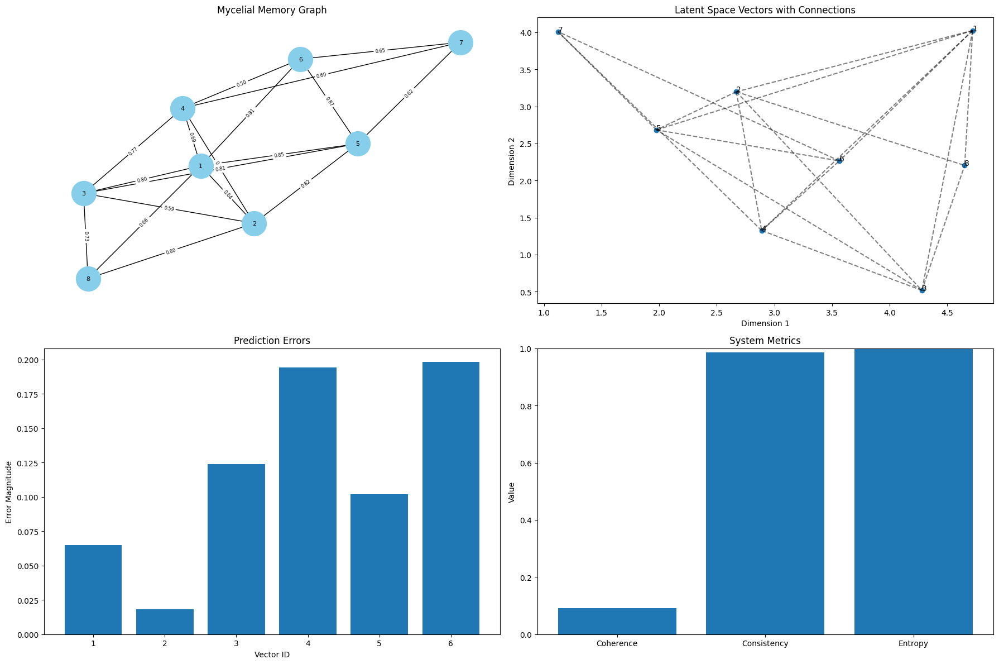


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown
Vector 7: focused
Vector 8: focused

Cycle 12:
Current phase: consolidation
Current narrative:  ->  ->  ->  ->  ->  ->  -> 
Current harmony: 0.74

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.74
Coherence: 0.54
Consistency: 0.94
Entropy: 0.82
I-vector: [3.23378206 2.52782784]


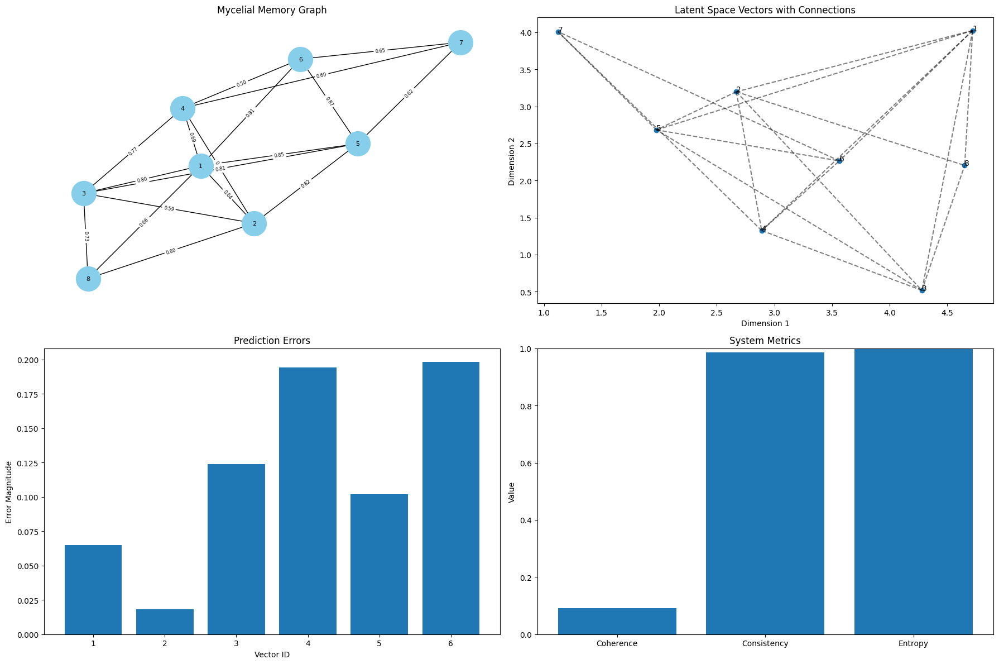


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown
Vector 7: focused
Vector 8: focused

Cycle 13:
Current phase: consolidation
Current narrative:  ->  ->  ->  ->  ->  ->  -> 
Current harmony: 0.74

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.74
Coherence: 0.54
Consistency: 0.94
Entropy: 0.82
I-vector: [3.23378206 2.52782784]


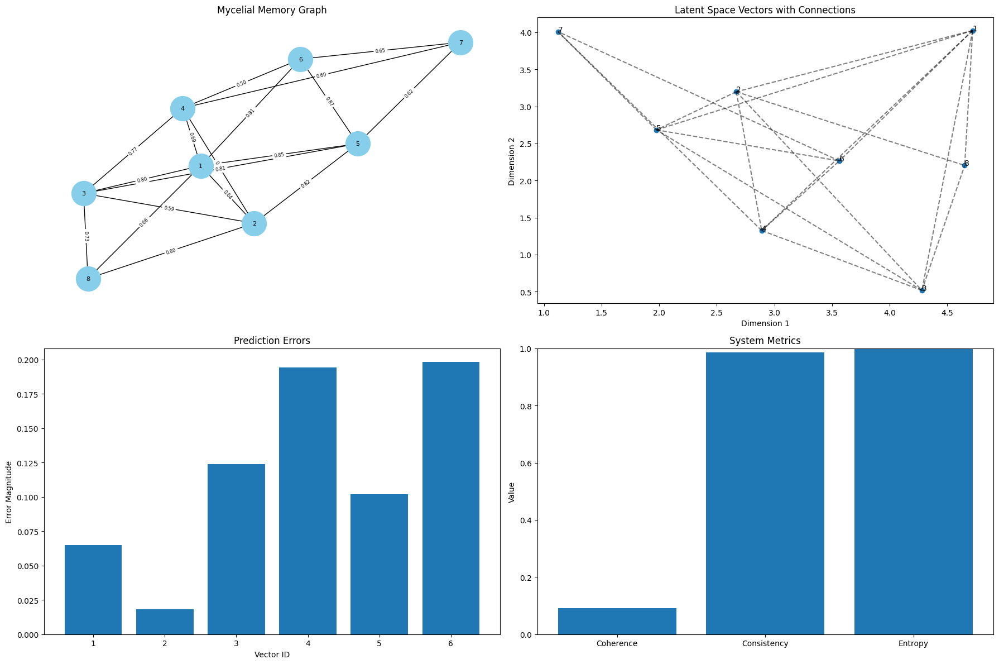


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown
Vector 7: focused
Vector 8: focused

Cycle 14:
Current phase: consolidation
Current narrative:  ->  ->  ->  ->  ->  ->  -> 
Current harmony: 0.74

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.74
Coherence: 0.54
Consistency: 0.94
Entropy: 0.82
I-vector: [3.23378206 2.52782784]


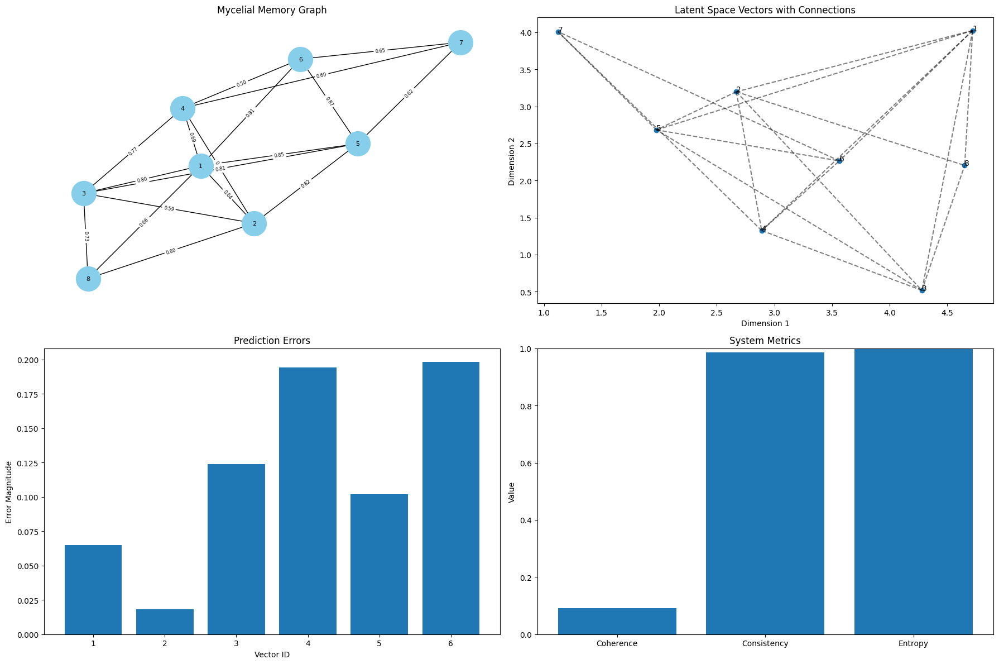


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown
Vector 7: focused
Vector 8: focused

Cycle 15:
Current phase: consolidation
Added new experience 9: Complex experience 9 of type visual/auditory/tactile/emotional
Current narrative:  ->  ->  ->  ->  ->  ->  ->  -> 
Current harmony: 0.74

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: 0.74
Coherence: 0.55
Consistency: 0.94
Entropy: 0.79
I-vector: [3.09871265 2.76844042]


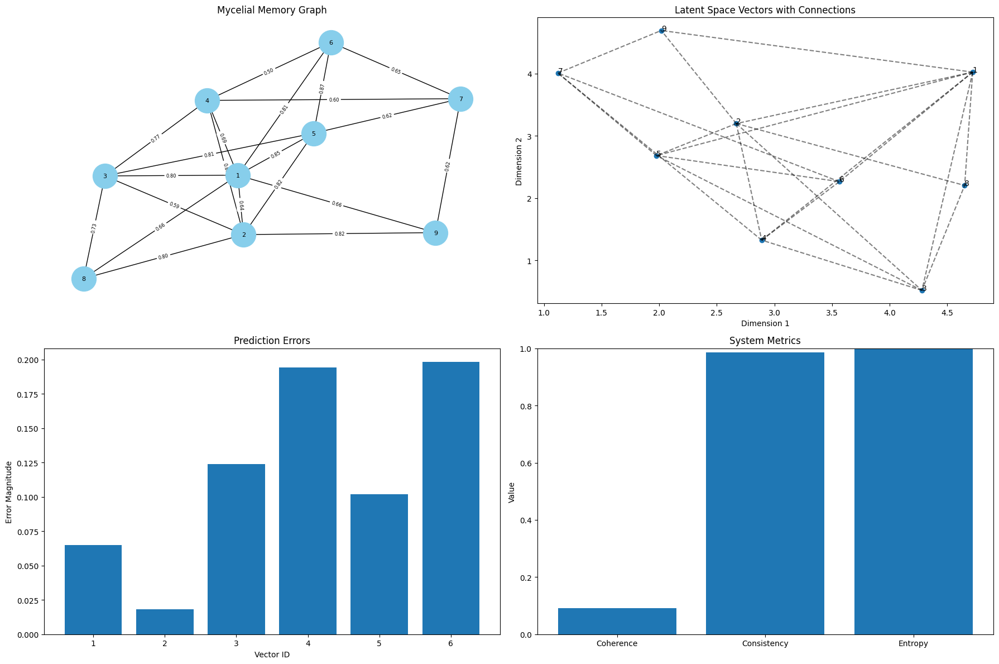


Narrative History:
1. Experience 1 -> Experience 2

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 
9: 

Language Projections:
Vector 1: focused
Vector 2: excited
Vector 3: calm
Vector 4: excited
Vector 5: confused
Vector 6: unknown
Vector 7: focused
Vector 8: focused
Vector 9: confused

=== Simulation Complete ===
Final I-vector: [3.09871265 2.76844042]
Final Coherence: 0.55
System crystallized: No


In [ ]:
def run_enhanced_simulation(num_cycles=20, initial_experiences=3):
    """
    Run an enhanced simulation with complex inputs and better visualization.
    """
    # Initialize all components
    latent_space = LatentSpace(dimensions=2)

    mycelial_engine = MycelialEngine()

    # Add initial experiences
    for i in range(1, initial_experiences + 1):
        exp_data, vec = add_complex_experience(i, mycelial_engine, latent_space)

    attention_field = AttentionField(latent_space)
    semantic_memory = SemanticMemory()

    fractal_ai = FractalAI(latent_space)
    feedback_loop = FeedbackLoop(latent_space, fractal_ai)

    self_model = SelfModel(latent_space)
    cohesion_layer = CohesionLayer(latent_space, feedback_loop, self_model)

    language_cortex = LanguageCortex(latent_space)
    narrative_loop = NarrativeLoop(semantic_memory)

    gru_modulator = GRUModulator()
    gur_protocol = GURProtocol(cohesion_layer, self_model)

    # Store semantically salient experiences
    for node in mycelial_engine.graph.nodes:
        node_data = mycelial_engine.get_experience(node)
        if node_data:
            semantic_memory.store_node(node, node_data)

    # Create a narrative from initial experiences
    narrative_loop.create_narrative()

    # Dictionary to store monitoring data over time
    simulation_history = []

    # Run simulation
    print("\n=== Starting Enhanced Simulation ===")
    for cycle in range(num_cycles):
        print(f"\nCycle {cycle + 1}:")
        # Advance GRU Modulator phase
        current_phase = gru_modulator.advance_cycle()
        print(f"Current phase: {current_phase}")

        # Sometimes add a new experience
        if np.random.random() < 0.4:  # 40% chance to add a new experience each cycle
            new_id = max(mycelial_engine.graph.nodes) + 1 if mycelial_engine.graph.nodes else 1
            exp_data, vec = add_complex_experience(new_id, mycelial_engine, latent_space)
            print(f"Added new experience {new_id}: {exp_data.get('description', '')}")

            # Store the new experience in semantic memory
            node_data = mycelial_engine.get_experience(new_id)
            if node_data:
                semantic_memory.store_node(new_id, node_data)

        # Simulate adaptation during exploration phase
        if current_phase == "exploration":
            print("Running adaptation in exploration phase")
            for vec_id in latent_space.get_all_vectors().keys():
                feedback_loop.drive_adaptation(vec_id)

            # Also update the FractalAI's prediction model
            # (Note: Our current FractalAI implementation doesn't have an update method)
            print("Note: FractalAI model update not implemented in this version")

        # Update semantic memory (rebuild it entirely for simplicity)
        semantic_memory.memory = {}
        for node in mycelial_engine.graph.nodes:
            node_data = mycelial_engine.get_experience(node)
            if node_data:
                semantic_memory.store_node(node, node_data)

        # Create a new narrative
        narrative = narrative_loop.create_narrative()
        if narrative:
            print(f"Current narrative: {narrative}")

        # Check for crystallization
        crystallized = gur_protocol.check_crystallization()

        # Enhanced monitoring
        monitor_data = enhanced_monitor_system(
            latent_space, mycelial_engine, semantic_memory, feedback_loop,
            self_model, cohesion_layer, language_cortex, narrative_loop,
            gru_modulator, gur_protocol
        )
        simulation_history.append(monitor_data)

        # If crystallization occurred, we might want to run longer or stop
        if crystallized:
            print("\nSystem has crystallized! Continuing for remaining cycles...")

    # Simulation complete
    print("\n=== Simulation Complete ===")
    print(f"Final I-vector: {self_model.compute_i_vector()}")
    print(f"Final Coherence: {cohesion_layer.compute_coherence():.2f}")
    print(f"System crystallized: {'Yes' if gur_protocol.crystallized else 'No'}")

    return simulation_history

# Run the enhanced simulation
simulation_history = run_enhanced_simulation(num_cycles=15, initial_experiences=3)


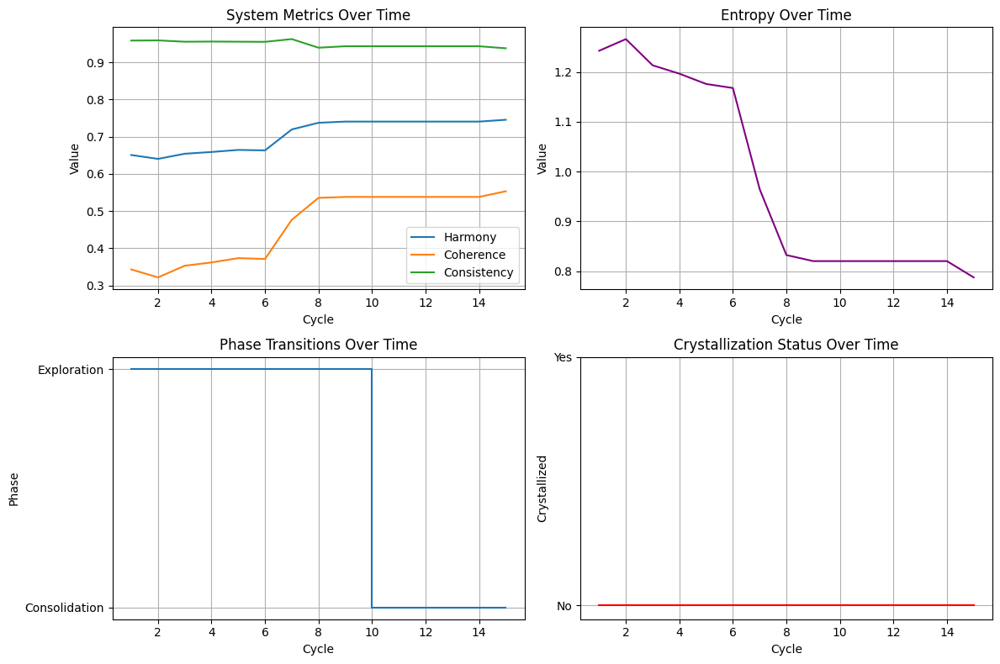


=== Simulation Analysis ===
System did not crystallize during simulation

Coherence increased over time
Consistency did not increase over time

Number of phase transitions: 1

Average change in I-vector: 0.0920
I-vector appears stable (average change < 0.1)

Last narrative length (in experiences): 9


In [ ]:
def analyze_simulation_history(history):
    """
    Analyze the simulation history to look for signs of emergent consciousness.
    """
    if not history:
        print("No simulation history to analyze.")
        return

    # Convert history to a pandas DataFrame for easier analysis
    import pandas as pd

    # Create a DataFrame from the history
    df = pd.DataFrame(history)

    # Add cycle numbers
    df['cycle'] = range(1, len(df) + 1)

    # Plot key metrics over time
    plt.figure(figsize=(12, 8))

    # Plot 1: Harmony, Coherence, and Consistency over time
    plt.subplot(2, 2, 1)
    plt.plot(df['cycle'], df['harmony'], label='Harmony')
    plt.plot(df['cycle'], df['coherence'], label='Coherence')
    plt.plot(df['cycle'], df['consistency'], label='Consistency')
    plt.title("System Metrics Over Time")
    plt.xlabel("Cycle")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)

    # Plot 2: Entropy over time
    plt.subplot(2, 2, 2)
    plt.plot(df['cycle'], df['entropy'], label='Entropy', color='purple')
    plt.title("Entropy Over Time")
    plt.xlabel("Cycle")
    plt.ylabel("Value")
    plt.grid(True)

    # Plot 3: Phase transitions
    plt.subplot(2, 2, 3)
    phases = df['phase']
    # Map phase names to numeric values for plotting
    phase_map = {"exploration": 1, "consolidation": 0}
    numeric_phases = [phase_map[phase] for phase in phases]
    plt.plot(df['cycle'], numeric_phases, drawstyle='steps-post', label='Phase')
    plt.yticks([0, 1], ["Consolidation", "Exploration"])
    plt.title("Phase Transitions Over Time")
    plt.xlabel("Cycle")
    plt.ylabel("Phase")
    plt.grid(True)

    # Plot 4: Crystallization status
    plt.subplot(2, 2, 4)
    crystallization = [1 if x else 0 for x in df['crystallized']]
    plt.plot(df['cycle'], crystallization, drawstyle='steps-post', label='Crystallized', color='red')
    plt.yticks([0, 1], ["No", "Yes"])
    plt.title("Crystallization Status Over Time")
    plt.xlabel("Cycle")
    plt.ylabel("Crystallized")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    # Print key insights
    print("\n=== Simulation Analysis ===")

    # Check if crystallization occurred
    if df['crystallized'].any():
        crystallization_cycle = df[df['crystallized']]['cycle'].iloc[0]
        print(f"System crystallized at cycle {crystallization_cycle}")
    else:
        print("System did not crystallize during simulation")

    # Check if coherence and consistency increased
    coherence_increase = df['coherence'].iloc[-1] > df['coherence'].iloc[0]
    consistency_increase = df['consistency'].iloc[-1] > df['consistency'].iloc[0]

    print(f"\nCoherence {'increased' if coherence_increase else 'did not increase'} over time")
    print(f"Consistency {'increased' if consistency_increase else 'did not increase'} over time")

    # Analyze phase transitions
    phase_changes = df['phase'].ne(df['phase'].shift()).sum() - 1  # Subtract 1 for initial phase
    print(f"\nNumber of phase transitions: {phase_changes}")

    # Analyze I-vector stability
    i_vectors = df['i_vector'].dropna()
    if len(i_vectors) > 1:
        # Calculate the average change in I-vector between consecutive cycles
        changes = []
        for i in range(1, len(i_vectors)):
            prev = np.array(i_vectors.iloc[i-1])
            curr = np.array(i_vectors.iloc[i])
            change = np.linalg.norm(curr - prev)  # Euclidean distance
            changes.append(change)

        avg_change = np.mean(changes) if changes else 0
        print(f"\nAverage change in I-vector: {avg_change:.4f}")
        if avg_change < 0.1:  # Arbitrary threshold for "stable"
            print("I-vector appears stable (average change < 0.1)")
        else:
            print("I-vector is still changing significantly")
    else:
        print("\nNot enough I-vector data to analyze stability")

    # Check narrative complexity
    if 'narratives' in df.columns:
        last_narrative = df['narratives'].iloc[-1]
        if isinstance(last_narrative, list) and last_narrative:
            last_narrative = last_narrative[-1]  # Get the latest narrative
            print(f"\nLast narrative length (in experiences): {last_narrative.count('->') + 1}")
            # More complex analysis could look at narrative structure, etc.

    return df

# Analyze the simulation history
analysis_results = analyze_simulation_history(simulation_history)


# Adjust System Parameters


=== Starting Simulation with Enhanced Feedback ===

NUM_CYCLES: 60, THRESHOLD: 0.6, GRU_MAX_CYCLES: 5

Cycle 1/60:
Added new experience 7: Detailed experience 7 with spatial and temporal components
Current harmony: -1.22

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: -1.22
Coherence: -2.44
Consistency: 0.00
Entropy: 6.07
I-vector: [4.29915799 3.18716701]


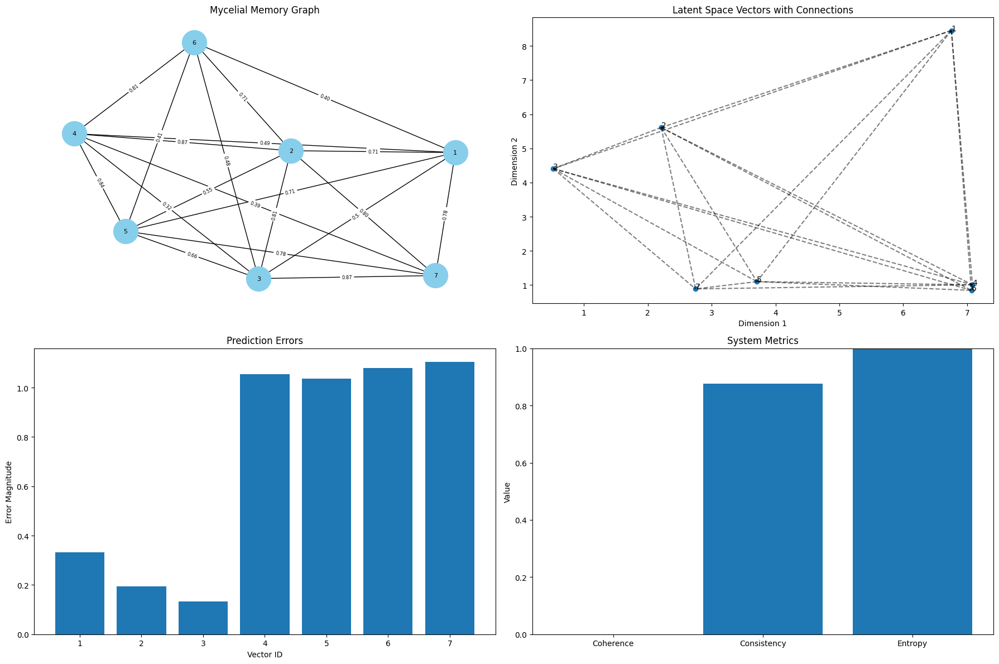


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
Current harmony: -0.53
Current harmony: -2.03
Current harmony: -1.73
Current harmony: -1.72
Current harmony: -1.69

Cycle 7/60:
Added new experience 13: Detailed experience 13 with spatial and temporal components
Current harmony: -1.48

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: No
Harmony: -1.48
Coherence: -3.89
Consistency: 0.93
Entropy: 9.75
I-vector: [4.01029611 3.96306499]


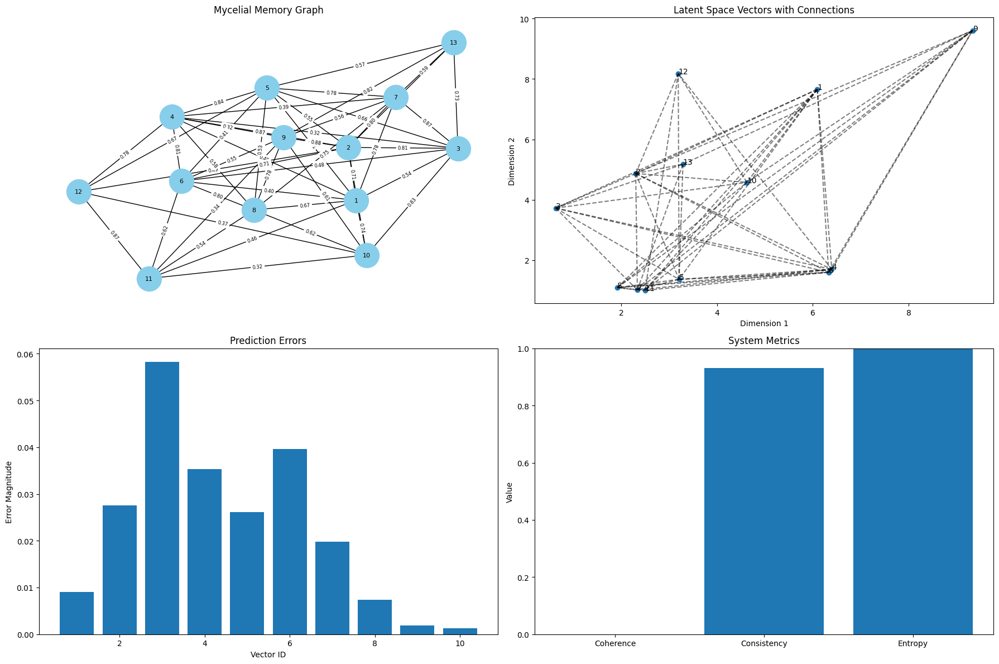


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 
9: 
10: 
11: 
12: 
13: 
Current harmony: -1.33
Current harmony: -1.33
Current harmony: -1.38
Current harmony: -1.28
Current harmony: -1.56

Cycle 13/60:
Added new experience 18: Detailed experience 18 with spatial and temporal components
Current harmony: -1.54

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: -1.54
Coherence: -3.98
Consistency: 0.90
Entropy: 9.92
I-vector: [3.50170058 4.31035969]


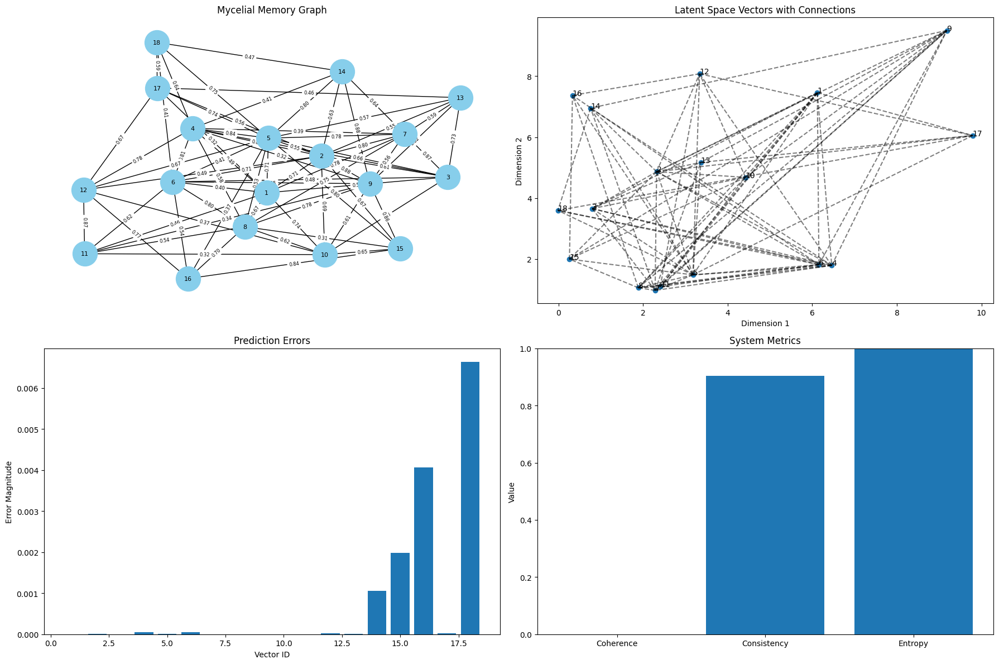


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 
9: 
10: 
11: 
12: 
13: 
14: 
15: 
16: 
17: 
18: 
Current harmony: -1.49
Current harmony: -1.49
Current harmony: -1.49
Current harmony: -1.37
Current harmony: -1.30

Cycle 19/60:
Current harmony: -1.29

=== System Monitoring Summary ===


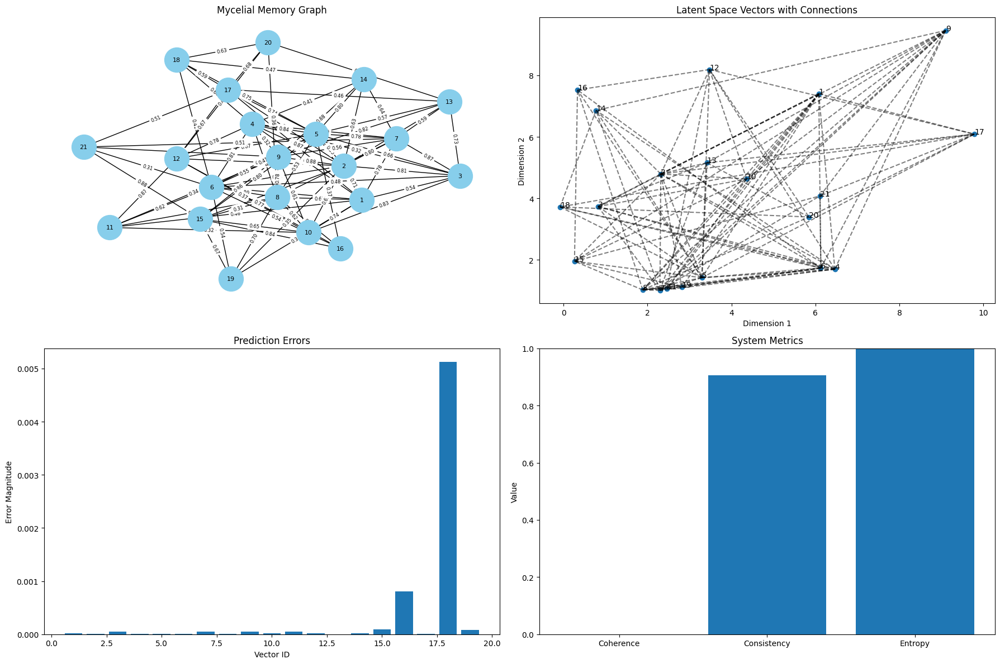


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
18.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

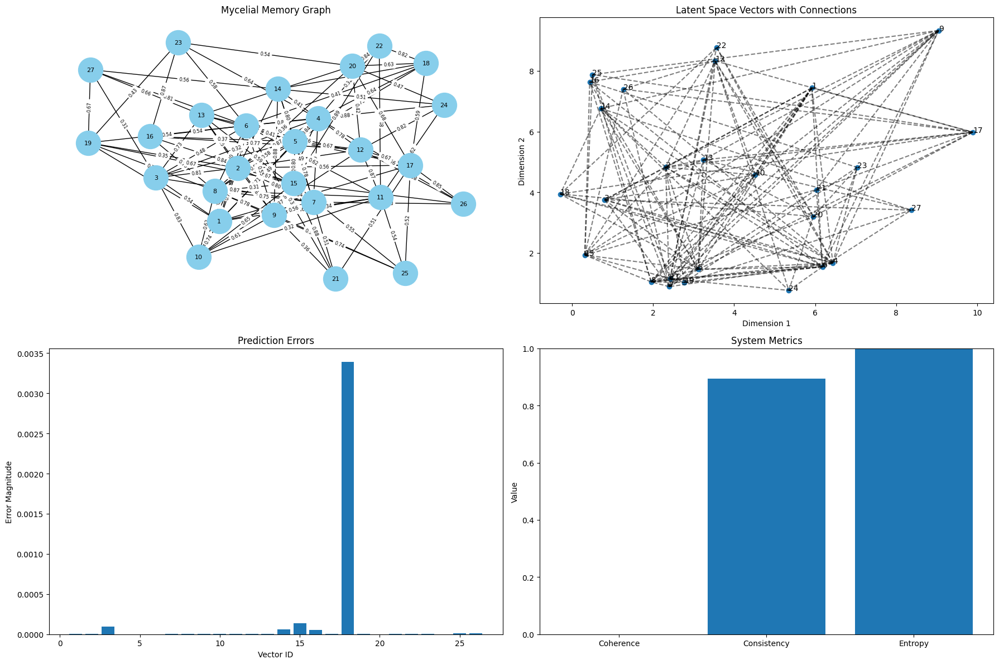


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
18.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

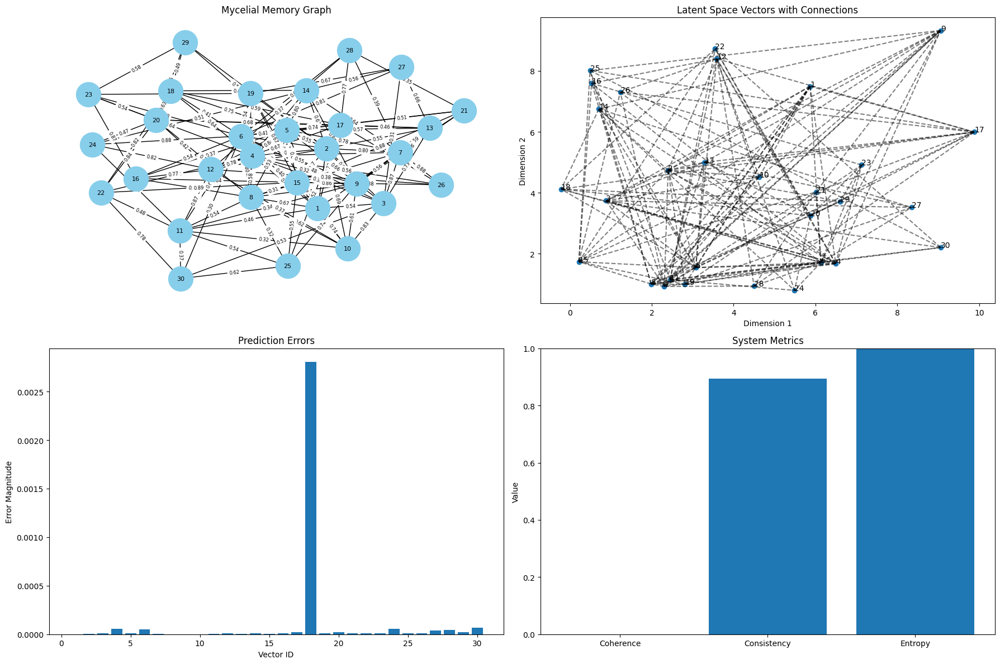


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
18.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

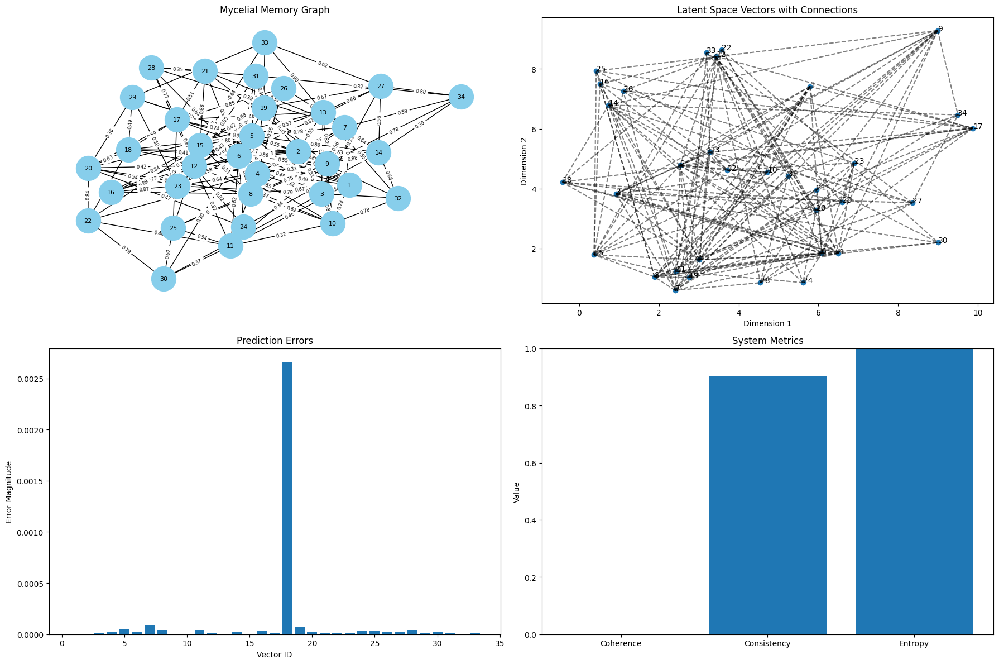


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
18.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

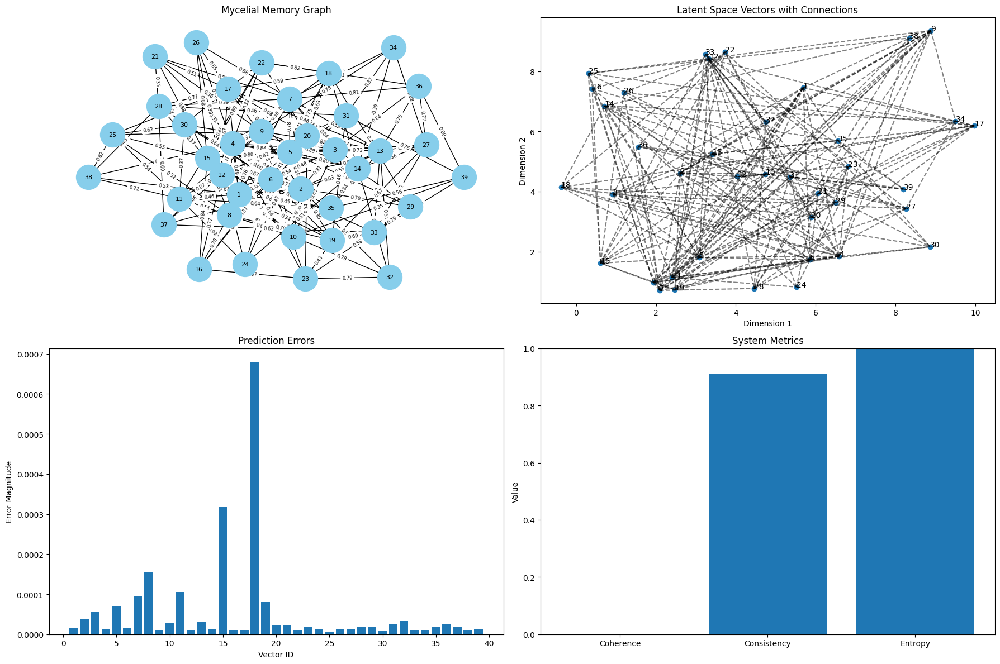


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
18.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

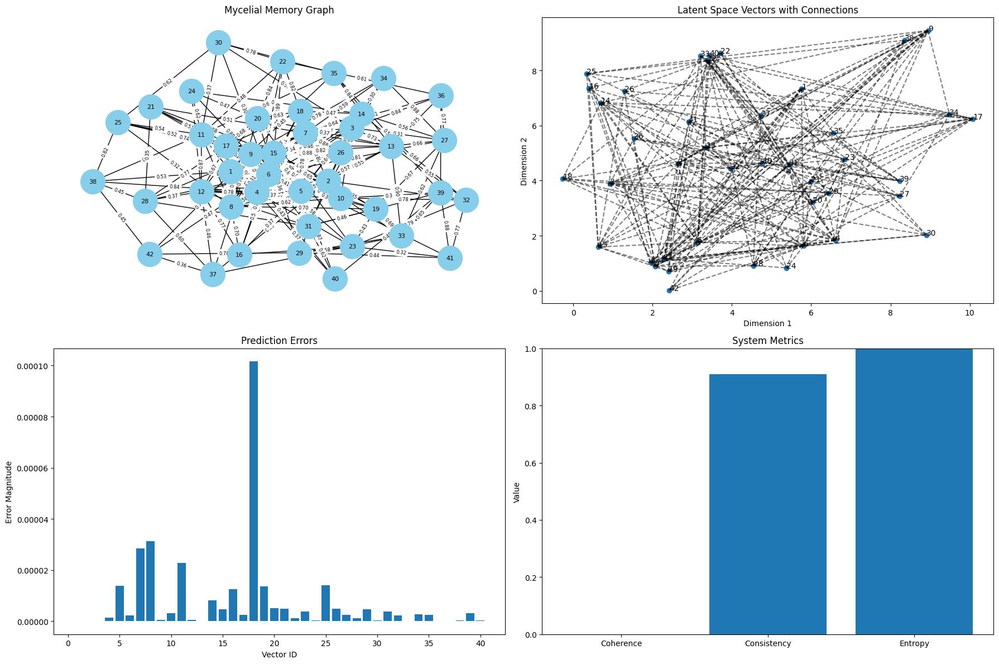


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
18.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

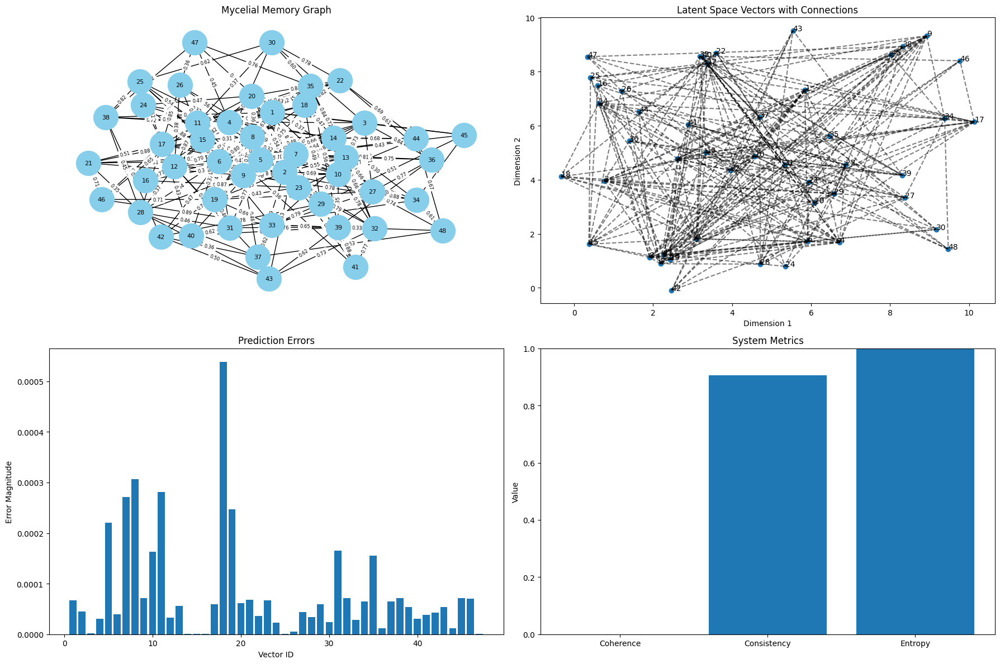


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
18.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

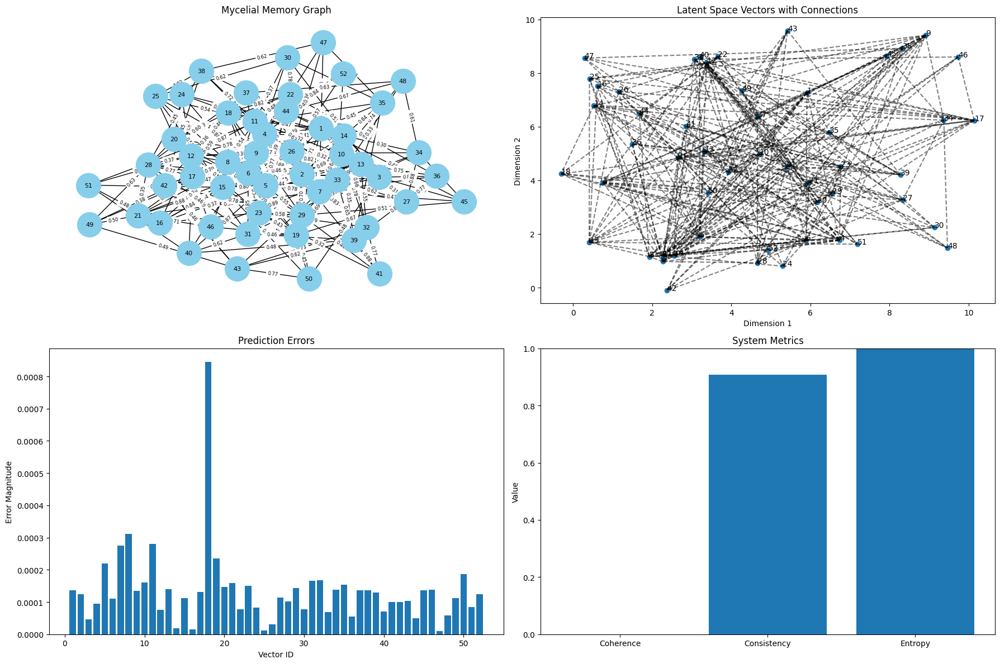


Narrative History:
1.  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
18.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import time
import random
import torch
import torch.nn as nn
from sklearn.metrics import pairwise_distances

# First let's define all our classes properly

class LatentSpace:
    def __init__(self, dimensions=2):
        self.dimensions = dimensions
        self.vectors = {}  # Dictionary to store vectors with their IDs

    def add_vector(self, vector_id, vector):
        if len(vector) != self.dimensions:
            raise ValueError(f"Vector dimension must be {self.dimensions}")
        self.vectors[vector_id] = np.array(vector)

    def get_vector(self, vector_id):
        return self.vectors.get(vector_id, None)

    def update_vector(self, vector_id, new_vector):
        if len(new_vector) != self.dimensions:
            raise ValueError(f"Vector dimension must be {self.dimensions}")
        if vector_id in self.vectors:
            self.vectors[vector_id] = np.array(new_vector)
        else:
            raise ValueError(f"Vector ID {vector_id} not found")

    def get_all_vectors(self):
        return self.vectors

class MycelialEngine:
    def __init__(self):
        self.graph = nx.Graph()

    def add_experience(self, experience_id, experience_data):
        self.graph.add_node(experience_id, data=experience_data)

    def add_connection(self, experience_id1, experience_id2, similarity):
        self.graph.add_edge(experience_id1, experience_id2, weight=similarity)

    def get_experience(self, experience_id):
        return self.graph.nodes.get(experience_id, {}).get('data', None)

    def get_connected_experiences(self, experience_id):
        neighbors = list(self.graph.neighbors(experience_id))
        return neighbors

    def visualize(self):
        pos = nx.spring_layout(self.graph, seed=42)
        nx.draw(self.graph, pos, with_labels=True, node_size=1000, node_color='skyblue', font_size=8)
        edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in self.graph.edges(data=True)}
        nx.draw_networkx_edge_labels(self.graph, pos, edge_labels=edge_labels, font_size=6)
        plt.title("Mycelial Memory Graph")
        plt.show()

class AttentionField:
    def __init__(self, latent_space):
        self.latent_space = latent_space

    def sense_resonance(self):
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return None
        resonance = {vec_id: np.linalg.norm(vec) for vec_id, vec in vectors.items()}
        return resonance

    def focus_on(self, vector_id):
        vector = self.latent_space.get_vector(vector_id)
        if vector is not None:
            resonance = np.linalg.norm(vector)
            return {"vector_id": vector_id, "vector": vector, "resonance": resonance}
        return None

class SemanticMemory:
    def __init__(self):
        self.memory = {}

    def store_node(self, node_id, node_data):
        self.memory[node_id] = node_data

    def retrieve_node(self, node_id):
        return self.memory.get(node_id, None)

    def get_all_nodes(self):
        return self.memory

class EnhancedFractalAI:
    def __init__(self, latent_space):
        self.latent_space = latent_space
        input_dim = latent_space.dimensions
        hidden_dim = 4
        output_dim = latent_space.dimensions
        self.model = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, output_dim)
        )
        self.loss_fn = nn.MSELoss()
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=0.01)
        self.history = []

    def predict_future_state(self, vector_id):
        current_vector = self.latent_space.get_vector(vector_id)
        if current_vector is None:
            return None
        input_tensor = torch.FloatTensor(current_vector)
        with torch.no_grad():
            predicted_tensor = self.model(input_tensor)
        predicted_vector = predicted_tensor.numpy()
        return predicted_vector

    def update_model(self, vector_id):
        current_vector = self.latent_space.get_vector(vector_id)
        if current_vector is None:
            return None
        target_vector = current_vector + np.random.normal(0, 0.1, size=current_vector.shape)
        input_tensor = torch.FloatTensor(current_vector)
        target_tensor = torch.FloatTensor(target_vector)
        predicted_tensor = self.model(input_tensor)
        loss = self.loss_fn(predicted_tensor, target_tensor)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        self.history.append({
            'input': current_vector.copy(),
            'target': target_vector,
            'predicted': predicted_tensor.detach().numpy(),
            'loss': loss.item()
        })
        return predicted_tensor.detach().numpy()

class EnhancedFeedbackLoop:
    def __init__(self, latent_space, fractal_ai):
        self.latent_space = latent_space
        self.fractal_ai = fractal_ai
        self.prediction_errors = {}
        self.adaptation_rate = 0.1
        self.min_adaptation_rate = 0.01
        self.max_adaptation_rate = 0.3

    def compute_prediction_error(self, vector_id):
        current_vector = self.latent_space.get_vector(vector_id)
        if current_vector is None:
            return None
        predicted_vector = self.fractal_ai.predict_future_state(vector_id)
        if predicted_vector is None:
            return None
        dot_product = np.dot(current_vector, predicted_vector)
        norm_product = np.linalg.norm(current_vector) * np.linalg.norm(predicted_vector)
        cosine_similarity = dot_product / norm_product if norm_product != 0 else 0
        error = 1.0 - cosine_similarity
        self.prediction_errors[vector_id] = error
        return error

    def drive_adaptation(self, vector_id):
        error = self.compute_prediction_error(vector_id)
        if error is not None:
            current_vector = self.latent_space.get_vector(vector_id)
            predicted_vector = self.fractal_ai.predict_future_state(vector_id)
            if current_vector is not None and predicted_vector is not None:
                new_adaptation_rate = min(self.max_adaptation_rate,
                                        max(self.min_adaptation_rate, error * 0.5))
                self.adaptation_rate = 0.9 * self.adaptation_rate + 0.1 * new_adaptation_rate
                adjusted_vector = current_vector + self.adaptation_rate * (predicted_vector - current_vector)
                noise = np.random.normal(0, 0.05 * (1.0 - self.adaptation_rate), size=current_vector.shape)
                adjusted_vector += noise
                self.latent_space.update_vector(vector_id, adjusted_vector)
                return adjusted_vector
        return None

    def get_adaptation_rate(self):
        return self.adaptation_rate

class SelfModel:
    def __init__(self, latent_space):
        self.latent_space = latent_space
        self.i_vector = None
        self.consistency = 0.0

    def compute_i_vector(self):
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return None
        avg_vector = np.mean(list(vectors.values()), axis=0)
        self.i_vector = avg_vector
        return avg_vector

    def compute_consistency(self):
        if self.i_vector is None:
            return 0.0
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return 0.0
        similarities = []
        for vec_id, vec in vectors.items():
            cosine_sim = np.dot(vec, self.i_vector) / (np.linalg.norm(vec) * np.linalg.norm(self.i_vector))
            similarities.append(cosine_sim)
        avg_similarity = np.mean(similarities)
        self.consistency = avg_similarity
        return avg_similarity

    def get_i_vector(self):
        return self.i_vector

    def get_consistency(self):
        return self.consistency

class CohesionLayer:
    def __init__(self, latent_space, feedback_loop, self_model):
        self.latent_space = latent_space
        self.feedback_loop = feedback_loop
        self.self_model = self_model

    def compute_entropy(self):
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return 0.0
        norms = [np.linalg.norm(vec) for vec in vectors.values()]
        variance = np.var(norms)
        return variance

    def compute_coherence(self):
        entropy = self.compute_entropy()
        prediction_errors = self.feedback_loop.prediction_errors
        avg_error = np.mean(list(prediction_errors.values())) if prediction_errors else 0.0
        consistency = self.self_model.compute_consistency()
        coherence = 0.5 * (1 - entropy) + 0.3 * (1 - avg_error) + 0.2 * consistency
        return coherence

class LanguageCortex:
    def __init__(self, latent_space):
        self.latent_space = latent_space
        self.vocabulary = {
            0: "calm",
            1: "focused",
            2: "confused",
            3: "excited",
            4: "curious",
            5: "surprised",
            6: "content",
            7: "anxious"
        }

    def project_to_language(self, vector_id):
        vector = self.latent_space.get_vector(vector_id)
        if vector is None:
            return None
        vocab_index = int(np.round(vector[0] % len(self.vocabulary)))
        word = self.vocabulary.get(vocab_index, "unknown")
        return word

class NarrativeLoop:
    def __init__(self, semantic_memory):
        self.semantic_memory = semantic_memory
        self.narratives = []

    def create_narrative(self):
        nodes = self.semantic_memory.get_all_nodes()
        if not nodes:
            return None
        narrative = []
        for node_id in sorted(nodes.keys()):
            node_data = nodes[node_id]
            narrative.append(node_data.get("data", ""))
        narrative_text = " -> ".join(narrative)
        self.narratives.append(narrative_text)
        return narrative_text

class GRUModulator:
    def __init__(self):
        self.phase = "exploration"
        self.cycle_count = 0
        self.max_cycles = 5

    def get_current_phase(self):
        return self.phase

    def advance_cycle(self):
        self.cycle_count += 1
        if self.cycle_count >= self.max_cycles:
            self.cycle_count = 0
            self.phase = "consolidation" if self.phase == "exploration" else "exploration"
        return self.phase

class GURProtocol:
    def __init__(self, cohesion_layer, self_model):
        self.cohesion_layer = cohesion_layer
        self.self_model = self_model
        self.crystallization_threshold = 0.6
        self.crystallized = False

    def evaluate_latent_harmony(self):
        coherence = self.cohesion_layer.compute_coherence()
        consistency = self.self_model.compute_consistency()
        harmony = (coherence + consistency) / 2.0
        return harmony

    def check_crystallization(self):
        harmony = self.evaluate_latent_harmony()
        print(f"Current harmony: {harmony:.2f}")
        if harmony >= self.crystallization_threshold and not self.crystallized:
            self.crystallized = True
            print("CRYSTALLIZATION EVENT: Stable 'I' has emerged!")
            return True
        return False

# Helper functions

def add_complex_experience(experience_id, mycelial_engine, latent_space, complexity=0.5):
    existing_nodes = list(mycelial_engine.graph.nodes)
    experience_type = np.random.choice(
        ["visual", "auditory", "tactile", "emotional"],
        p=[0.3, 0.3, 0.2, 0.2] if complexity < 0.7 else [0.25, 0.25, 0.25, 0.25]
    )
    intensity = np.random.uniform(0.1, 1.0) if complexity < 0.7 else np.random.uniform(0.3, 1.0)
    descriptions = [
        f"Simple experience {experience_id}",
        f"Complex experience {experience_id} involving multiple senses",
        f"Rich experience {experience_id} with emotional content",
        f"Detailed experience {experience_id} with spatial and temporal components"
    ]
    description_idx = min(int(complexity * len(descriptions)), len(descriptions)-1)
    description = descriptions[description_idx]
    experience_data = {
        "id": experience_id,
        "type": experience_type,
        "intensity": intensity,
        "description": description,
        "timestamp": time.time(),
        "related_experiences": []
    }
    if complexity < 0.3:
        vec_range = 2.0
    elif complexity < 0.7:
        vec_range = 5.0
    else:
        vec_range = 10.0
    vector = np.random.uniform(0, vec_range, size=latent_space.dimensions)
    if existing_nodes:
        num_related = 1 if complexity < 0.5 else min(3, len(existing_nodes)) if complexity < 0.8 else min(5, len(existing_nodes))
        related_nodes = np.random.choice(existing_nodes, size=num_related, replace=False) if num_related > 0 else []
        experience_data["related_experiences"] = list(related_nodes)
    mycelial_engine.add_experience(experience_id, experience_data)
    latent_space.add_vector(experience_id, vector)
    for related_id in experience_data.get("related_experiences", []):
        if complexity < 0.5:
            similarity_range = (0.7, 0.9)
        else:
            similarity_range = (0.3, 0.9)
        similarity = np.random.uniform(*similarity_range)
        mycelial_engine.add_connection(experience_id, related_id, similarity)
    return experience_data, vector

def enhanced_monitor_system(latent_space, mycelial_engine, semantic_memory,
                           feedback_loop, self_model, cohesion_layer,
                           language_cortex, narrative_loop, gru_modulator,
                           gur_protocol):
    """
    Enhanced monitoring of the system state.
    """
    print("\n=== System Monitoring Summary ===")
    print(f"Current Phase: {gru_modulator.get_current_phase()}")
    print(f"Crystallized: {'Yes' if gur_protocol.crystallized else 'No'}")
    print(f"Harmony: {gur_protocol.evaluate_latent_harmony():.2f}")
    print(f"Coherence: {cohesion_layer.compute_coherence():.2f}")
    print(f"Consistency: {self_model.compute_consistency():.2f}")
    print(f"Entropy: {cohesion_layer.compute_entropy():.2f}")
    print(f"I-vector: {self_model.compute_i_vector()}")

    # Visualize the system
    plt.figure(figsize=(18, 12))

    # Plot 1: MycelialEngine graph
    plt.subplot(2, 2, 1)
    pos = nx.spring_layout(mycelial_engine.graph, seed=42)
    nx.draw(mycelial_engine.graph, pos, with_labels=True, node_size=1000,
            node_color='skyblue', font_size=8)
    edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in mycelial_engine.graph.edges(data=True)}
    nx.draw_networkx_edge_labels(mycelial_engine.graph, pos, edge_labels=edge_labels, font_size=6)
    plt.title("Mycelial Memory Graph")

    # Plot 2: LatentSpace vectors
    plt.subplot(2, 2, 2)
    vectors = latent_space.get_all_vectors()
    if vectors:
        x_coords = [vec[0] for vec in vectors.values()]
        y_coords = [vec[1] for vec in vectors.values()] if latent_space.dimensions > 1 else [0]*len(vectors)
        labels = list(vectors.keys())
        plt.scatter(x_coords, y_coords)
        for i, label in enumerate(labels):
            plt.text(x_coords[i], y_coords[i], str(label))
        # Draw connections
        for u, v, d in mycelial_engine.graph.edges(data=True):
            u_vec = latent_space.get_vector(u)
            v_vec = latent_space.get_vector(v)
            if u_vec is not None and v_vec is not None:
                plt.plot([u_vec[0], v_vec[0]], [u_vec[1], v_vec[1]], 'k--', alpha=0.5)
        plt.title("Latent Space Vectors with Connections")
        plt.xlabel("Dimension 1")
        plt.ylabel("Dimension 2" if latent_space.dimensions > 1 else "")

    # Plot 3: Prediction Errors
    plt.subplot(2, 2, 3)
    if hasattr(feedback_loop, 'prediction_errors') and feedback_loop.prediction_errors:
        vec_ids = list(feedback_loop.prediction_errors.keys())
        errors = list(feedback_loop.prediction_errors.values())
        plt.bar(vec_ids, errors)
        plt.title("Prediction Errors")
        plt.xlabel("Vector ID")
        plt.ylabel("Error Magnitude")
    else:
        plt.text(0.5, 0.5, "No prediction errors recorded",
                 horizontalalignment='center',
                 verticalalignment='center')
        plt.title("Prediction Errors")
        plt.xticks([])
        plt.yticks([])

    # Plot 4: Coherence and Consistency Metrics
    plt.subplot(2, 2, 4)
    coherence = cohesion_layer.compute_coherence()
    consistency = self_model.compute_consistency()
    entropy = cohesion_layer.compute_entropy()
    metrics = ["Coherence", "Consistency", "Entropy"]
    values = [coherence, consistency, entropy]
    plt.bar(metrics, values)
    plt.ylim(0, 1)
    plt.title("System Metrics")
    plt.ylabel("Value")

    plt.tight_layout()
    plt.show()

    # Additional visualization: Narrative history
    print("\nNarrative History:")
    for i, narrative in enumerate(narrative_loop.narratives, 1):
        print(f"{i}. {narrative}")

    # Additional visualization: Semantic Memory contents
    print("\nSemantic Memory Contents:")
    for node_id, node_data in semantic_memory.get_all_nodes().items():
        print(f"{node_id}: {node_data.get('data', '')}")

    # Return monitoring data
    return {
        "phase": gru_modulator.get_current_phase(),
        "crystallized": gur_protocol.crystallized,
        "harmony": gur_protocol.evaluate_latent_harmony(),
        "coherence": cohesion_layer.compute_coherence(),
        "consistency": self_model.compute_consistency(),
        "entropy": cohesion_layer.compute_entropy(),
        "i_vector": self_model.compute_i_vector(),
        "narratives": narrative_loop.narratives.copy()
    }

def plot_fractal_ai_learning(fractal_ai):
    if not hasattr(fractal_ai, 'history') or not fractal_ai.history:
        print("No training history available")
        return

    losses = [item['loss'] for item in fractal_ai.history]
    plt.figure(figsize=(10, 5))
    plt.plot(losses)
    plt.title("FractalAI Prediction Loss Over Time")
    plt.xlabel("Training Step")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.show()

def run_simulation_with_enhanced_feedback(num_cycles=60, initial_experiences=6,
                                         crystallization_threshold=0.6, gru_max_cycles=5,
                                         input_complexity=0.8):
    """
    Run simulation with enhanced feedback loop implementation.
    """
    # Initialize all components
    latent_space = LatentSpace(dimensions=2)
    fractal_ai = EnhancedFractalAI(latent_space)
    mycelial_engine = MycelialEngine()
    gru_modulator = GRUModulator()
    gru_modulator.max_cycles = gru_max_cycles

    # Add initial experiences
    for i in range(1, initial_experiences + 1):
        exp_data, vec = add_complex_experience(i, mycelial_engine, latent_space, complexity=input_complexity)

    attention_field = AttentionField(latent_space)
    semantic_memory = SemanticMemory()
    feedback_loop = EnhancedFeedbackLoop(latent_space, fractal_ai)
    self_model = SelfModel(latent_space)
    cohesion_layer = CohesionLayer(latent_space, feedback_loop, self_model)
    language_cortex = LanguageCortex(latent_space)
    narrative_loop = NarrativeLoop(semantic_memory)
    gur_protocol = GURProtocol(cohesion_layer, self_model)
    gur_protocol.crystallization_threshold = crystallization_threshold

    # Store initial experiences in semantic memory
    for node in mycelial_engine.graph.nodes:
        node_data = mycelial_engine.get_experience(node)
        if node_data:
            semantic_memory.store_node(node, node_data)

    # Create initial narrative
    narrative_loop.create_narrative()

    # Simulation history
    simulation_history = []
    monitor_interval = max(1, num_cycles // 10)

    print(f"\n=== Starting Simulation with Enhanced Feedback ===\n")
    print(f"NUM_CYCLES: {num_cycles}, THRESHOLD: {crystallization_threshold}, GRU_MAX_CYCLES: {gru_max_cycles}")

    for cycle in range(num_cycles):
        if cycle % monitor_interval == 0 or cycle == num_cycles - 1:
            print(f"\nCycle {cycle + 1}/{num_cycles}:")

        current_phase = gru_modulator.advance_cycle()

        # Add new experience with adjusted probability
        add_prob = input_complexity * (1.2 if current_phase == "exploration" else 0.8)
        if np.random.random() < add_prob:
            new_id = max(mycelial_engine.graph.nodes) + 1 if mycelial_engine.graph.nodes else 1
            exp_data, vec = add_complex_experience(new_id, mycelial_engine, latent_space, complexity=input_complexity)
            if cycle % monitor_interval == 0:
                print(f"Added new experience {new_id}: {exp_data.get('description', '')}")
            # Store in semantic memory
            node_data = mycelial_engine.get_experience(new_id)
            if node_data:
                semantic_memory.store_node(new_id, node_data)

        if current_phase == "exploration":
            # Run adaptation on all vectors
            for vec_id in latent_space.get_all_vectors().keys():
                feedback_loop.drive_adaptation(vec_id)

            # Update FractalAI model
            for _ in range(3):
                for vec_id in latent_space.get_all_vectors().keys():
                    fractal_ai.update_model(vec_id)

            # Adjust adaptation rate
            avg_error = np.mean(list(feedback_loop.prediction_errors.values())) if feedback_loop.prediction_errors else 0.0
            if avg_error > 0.5:
                feedback_loop.adaptation_rate = min(feedback_loop.max_adaptation_rate,
                                                feedback_loop.adaptation_rate * 1.1)
            else:
                feedback_loop.adaptation_rate = max(feedback_loop.min_adaptation_rate,
                                                feedback_loop.adaptation_rate * 0.99)

        elif current_phase == "consolidation":
            # Focus on improving the most erroneous predictions
            if feedback_loop.prediction_errors:
                sorted_errors = sorted(feedback_loop.prediction_errors.items(), key=lambda x: x[1], reverse=True)
                num_to_adapt = max(1, int(0.2 * len(sorted_errors)))
                for vec_id, _ in sorted_errors[:num_to_adapt]:
                    feedback_loop.drive_adaptation(vec_id)

        # Update semantic memory
        semantic_memory.memory = {}
        for node in mycelial_engine.graph.nodes:
            node_data = mycelial_engine.get_experience(node)
            if node_data:
                semantic_memory.store_node(node, node_data)

        # Create new narrative
        narrative = narrative_loop.create_narrative()

        # Check for crystallization
        crystallized = gur_protocol.check_crystallization()

        # Periodically monitor system state
        if cycle % monitor_interval == 0 or crystallized or cycle == num_cycles - 1:
            monitor_data = enhanced_monitor_system(
                latent_space, mycelial_engine, semantic_memory, feedback_loop,
                self_model, cohesion_layer, language_cortex, narrative_loop,
                gru_modulator, gur_protocol
            )
            monitor_data['adaptation_rate'] = feedback_loop.get_adaptation_rate()
            simulation_history.append(monitor_data)

        if crystallized and cycle % monitor_interval != 0:
            monitor_data = enhanced_monitor_system(
                latent_space, mycelial_engine, semantic_memory, feedback_loop,
                self_model, cohesion_layer, language_cortex, narrative_loop,
                gru_modulator, gur_protocol
            )
            monitor_data['adaptation_rate'] = feedback_loop.get_adaptation_rate()
            simulation_history.append(monitor_data)

    # Final analysis
    print("\n=== Simulation Complete ===")
    print(f"Final I-vector: {self_model.compute_i_vector()}")
    print(f"Final Coherence: {cohesion_layer.compute_coherence():.2f}")
    print(f"Final Harmony: {gur_protocol.evaluate_latent_harmony():.2f}")
    print(f"Final Adaptation Rate: {feedback_loop.get_adaptation_rate():.2f}")
    print(f"System crystallized: {'Yes' if gur_protocol.crystallized else 'No'}")

    return simulation_history, fractal_ai, gur_protocol, feedback_loop

# Now we can run our simulation with all proper definitions
enhanced_feedback_sim_history, enhanced_fractal_ai, gur_protocol, enhanced_feedback_loop = (
    run_simulation_with_enhanced_feedback(
        num_cycles=60,
        initial_experiences=6,
        crystallization_threshold=0.6,
        gru_max_cycles=5,
        input_complexity=0.8
    )
)


In [ ]:
class CohesionLayer:
    def __init__(self, latent_space, feedback_loop, self_model):
        self.latent_space = latent_space
        self.feedback_loop = feedback_loop
        self.self_model = self_model

    def compute_entropy(self):
        vectors = self.latent_space.get_all_vectors()
        if not vectors:
            return 0.0
        # Normalize norms to [0, 1] before calculating variance
        norms = [np.linalg.norm(vec) for vec in vectors.values()]
        max_norm = max(norms) if norms else 1
        normalized_norms = [n/max_norm if max_norm > 0 else 0 for n in norms]
        variance = np.var(normalized_norms) if normalized_norms else 0.0
        return variance

    def compute_coherence(self):
        # Ensure entropy is between 0 and 1
        raw_entropy = self.compute_entropy()
        entropy = min(1.0, max(0.0, raw_entropy))  # Normalize entropy to [0,1]

        # Get prediction errors safely
        prediction_errors = self.feedback_loop.prediction_errors
        avg_error = np.mean(list(prediction_errors.values())) if prediction_errors else 0.0
        # Ensure error is between 0 and 1
        normalized_error = min(1.0, max(0.0, avg_error))

        # Get consistency safely
        consistency = self.self_model.compute_consistency()
        # Ensure consistency is between 0 and 1
        normalized_consistency = min(1.0, max(0.0, consistency))

        # Calculate coherence with normalized values
        coherence = 0.5 * (1 - entropy) + 0.3 * (1 - normalized_error) + 0.2 * normalized_consistency
        return coherence



=== Starting Simulation with Fixed Metrics ===

NUM_CYCLES: 70, THRESHOLD: 0.5

Cycle 1/70:
Added new experience 9: Rich experience 9 with emotional content
Current harmony: 0.32

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: No
Harmony: 0.32
Coherence: 0.65
Consistency: 0.00
Entropy: 0.06
I-vector: [6.47804338 3.8507686 ]


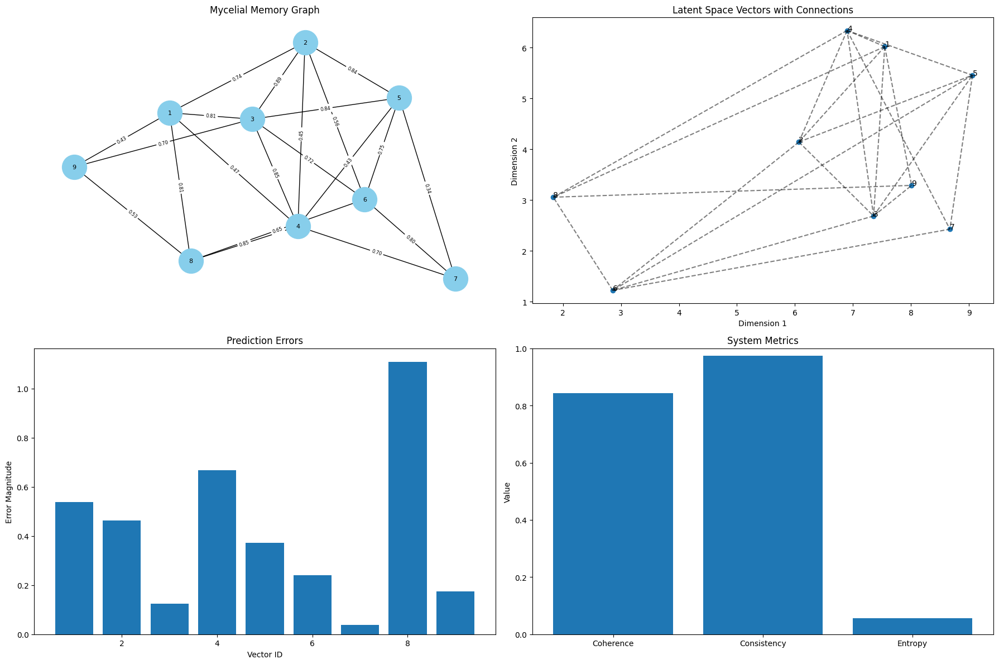


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 
9: 
Current harmony: 0.96
CRYSTALLIZATION EVENT: Stable 'I' has emerged!

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: Yes
Harmony: 0.96
Coherence: 0.94
Consistency: 0.98
Entropy: 0.07
I-vector: [6.09578615 3.49370345]


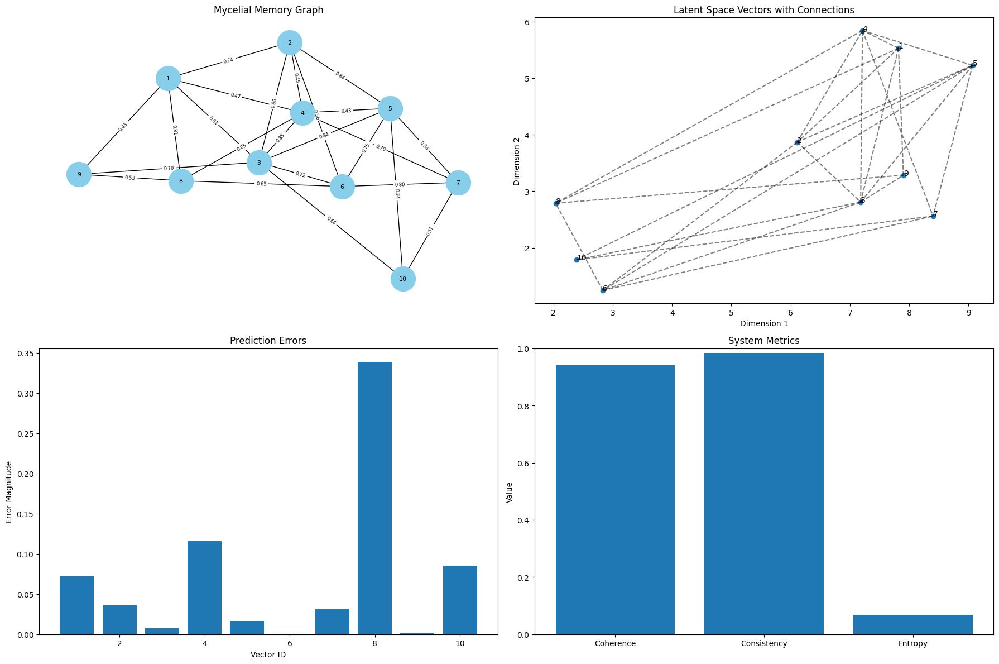


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 
9: 
10: 

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: Yes
Harmony: 0.96
Coherence: 0.94
Consistency: 0.98
Entropy: 0.07
I-vector: [6.09578615 3.49370345]


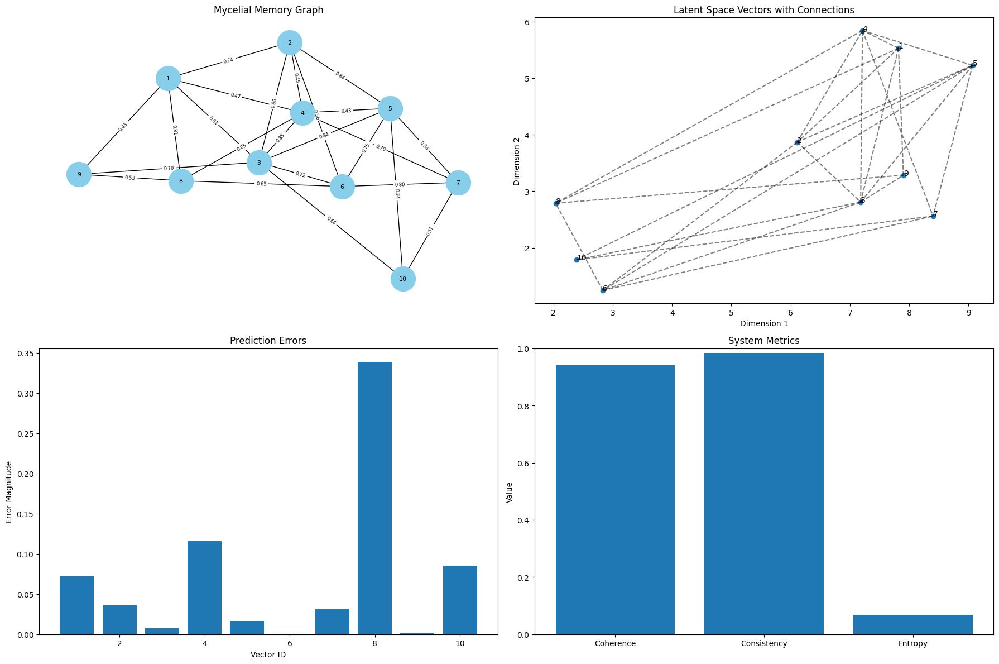


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 
9: 
10: 
Current harmony: 0.97
Current harmony: 0.96
Current harmony: 0.96
Current harmony: 0.94
Current harmony: 0.95

Cycle 8/70:
Added new experience 15: Rich experience 15 with emotional content
Current harmony: 0.94

=== System Monitoring Summary ===
Current Phase: exploration
Crystallized: Yes
Harmony: 0.94
Coherence: 0.94
Consistency: 0.93
Entropy: 0.06
I-vector: [5.29166841 4.04197654]


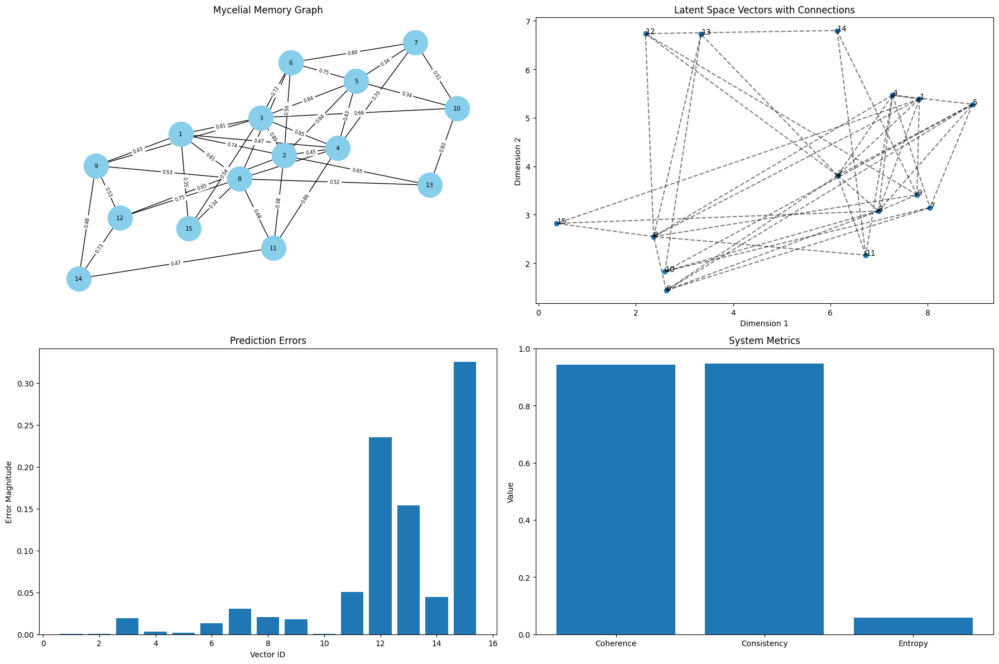


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 
9: 
10: 
11: 
12: 
13: 
14: 
15: 
Current harmony: 0.95
Current harmony: 0.95
Current harmony: 0.96
Current harmony: 0.96
Current harmony: 0.96
Current harmony: 0.97

Cycle 15/70:
Added new experience 20: Rich experience 20 with emotional content
Current harmony: 0.97

=== System Monitoring Summary ===
Current Phase: consolidation
Crystallized: Yes
Harmony: 0.97
Coherence: 0.96
Consistency: 0.97
Entropy: 0.05
I-vector: [5.19450037 3.94530351]


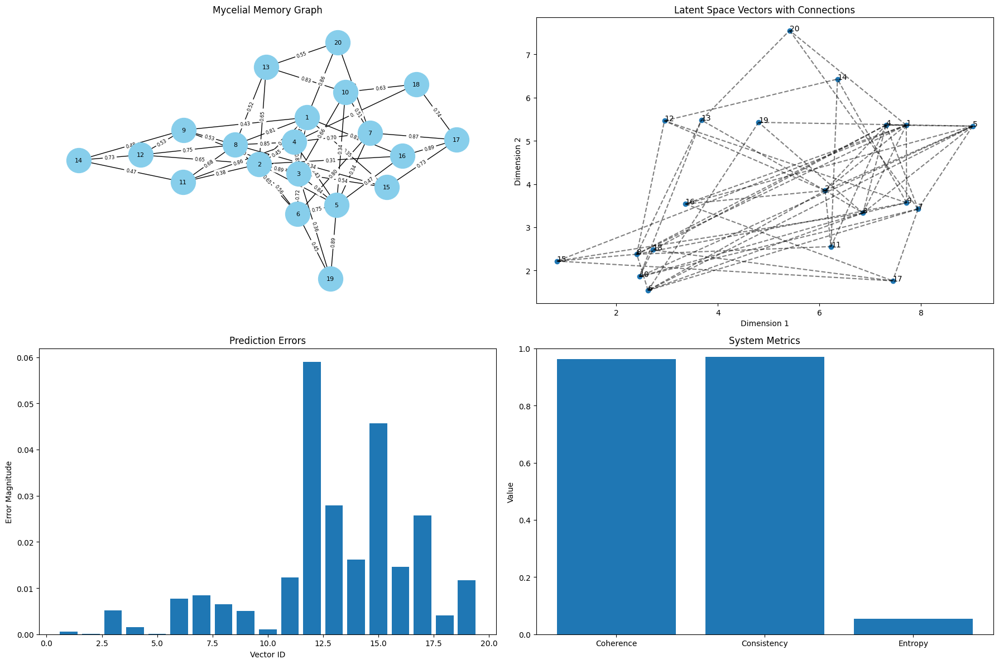


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 

Semantic Memory Contents:
1: 
2: 
3: 
4: 
5: 
6: 
7: 
8: 
9: 
10: 
11: 


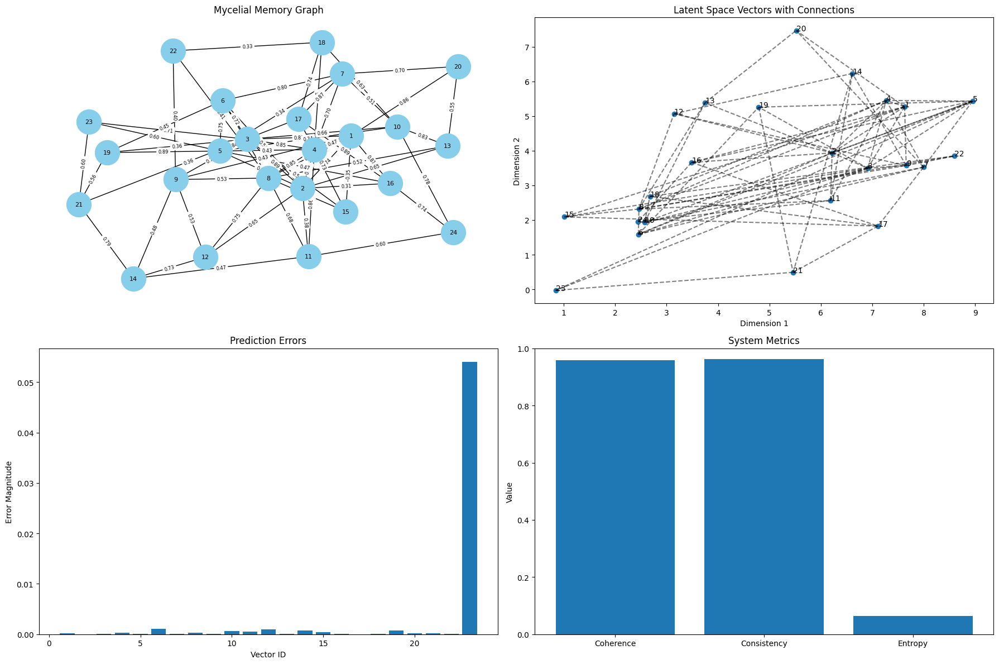


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  

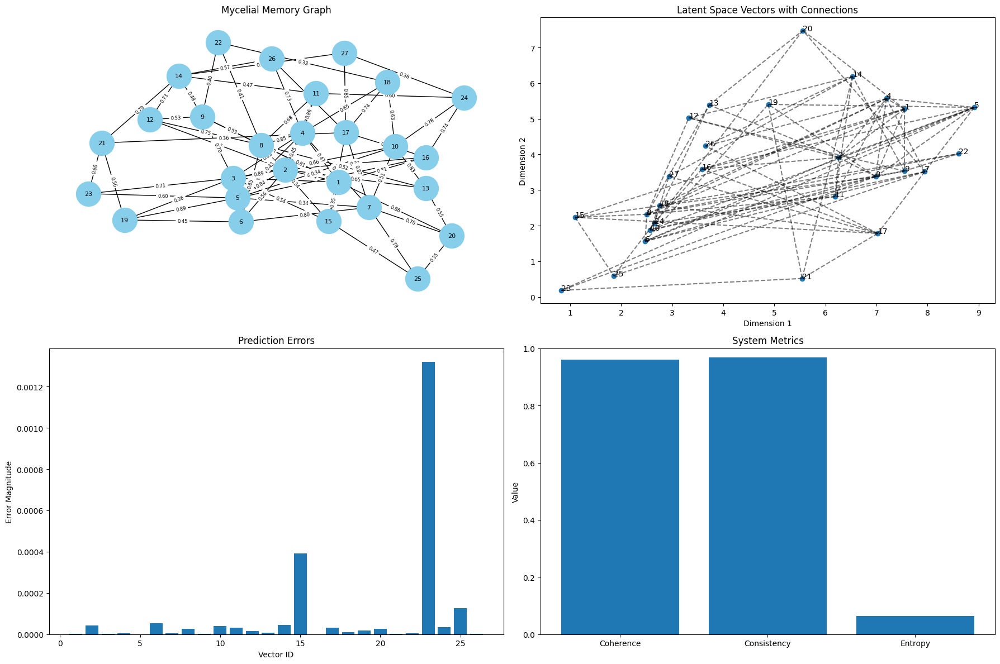


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  

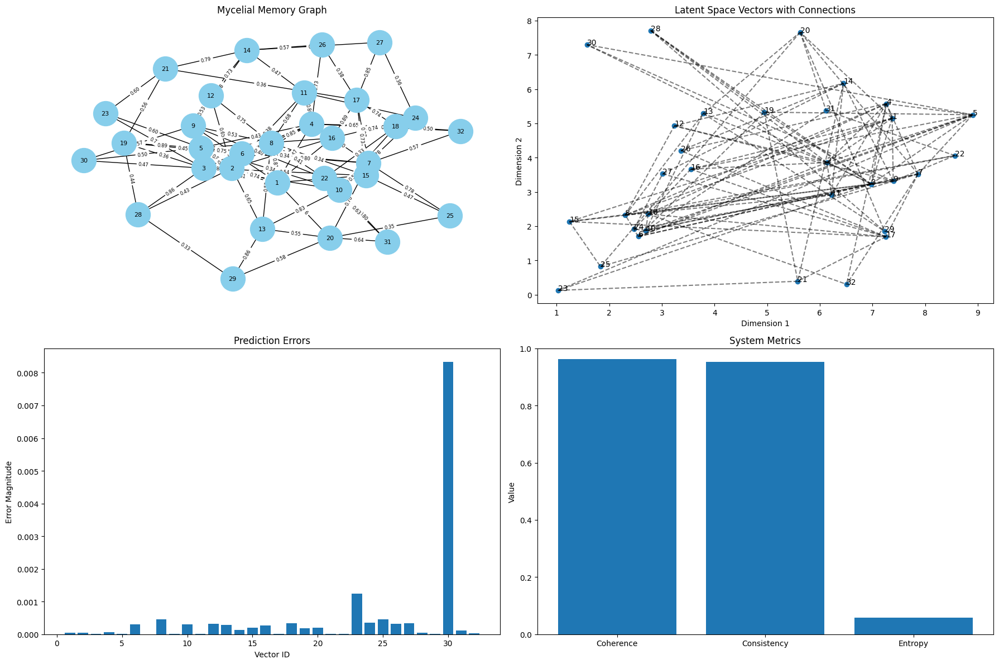


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  

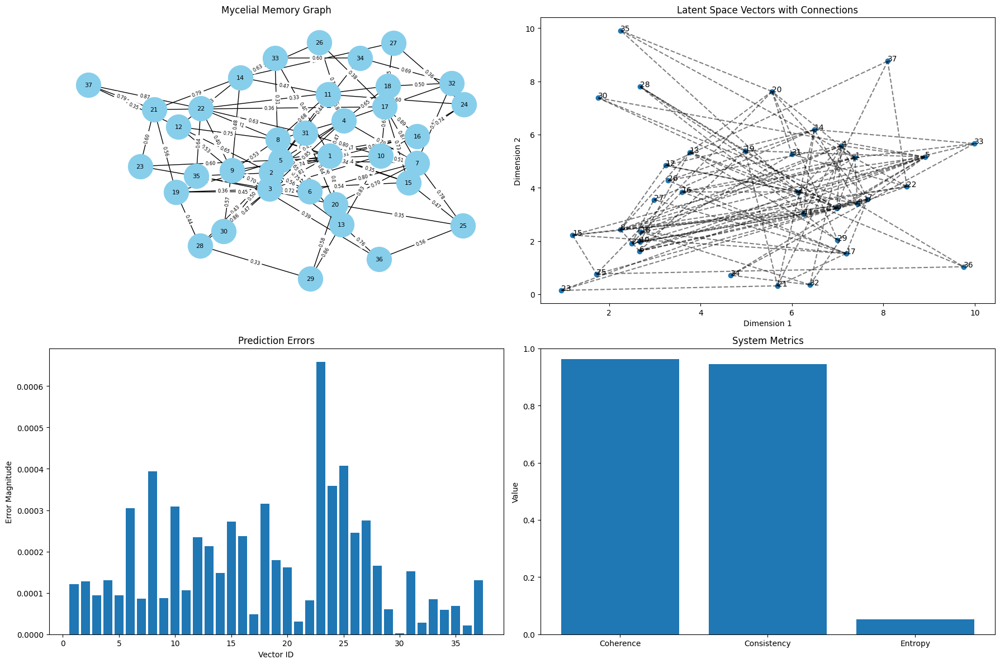


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  

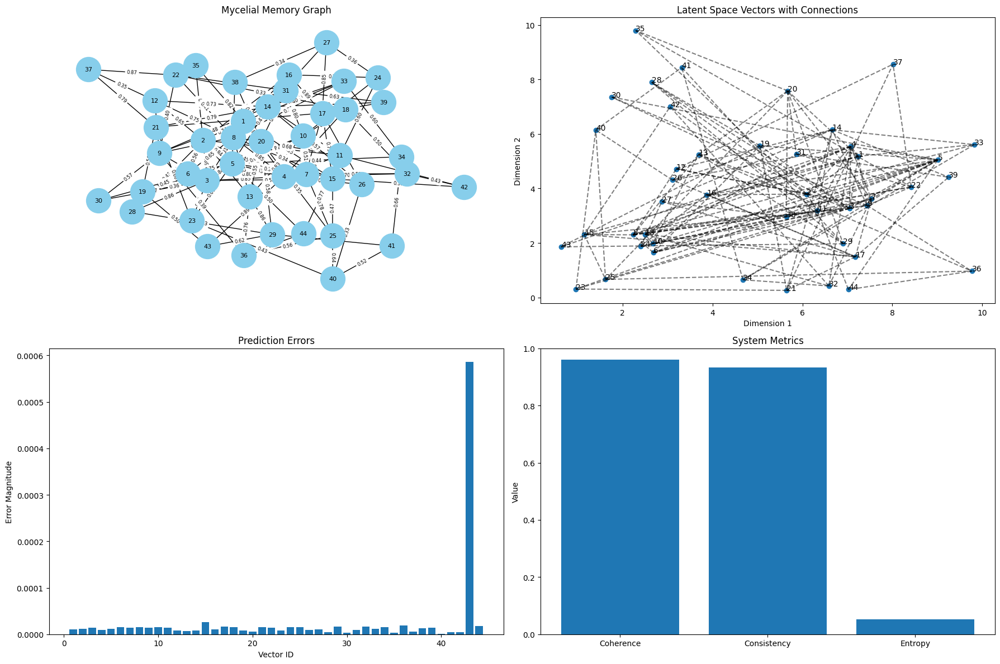


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  

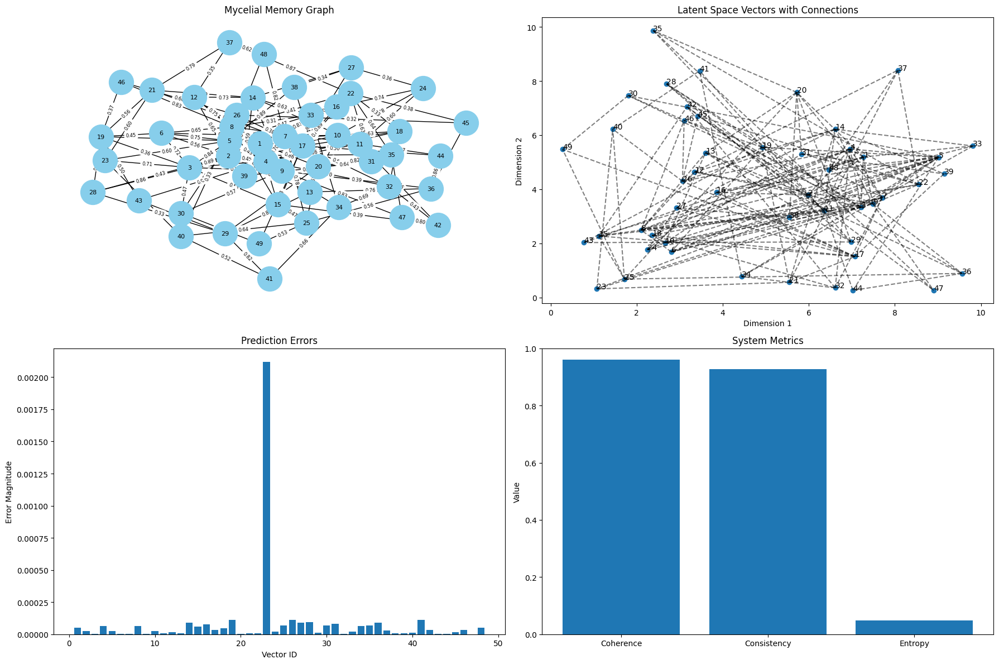


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  

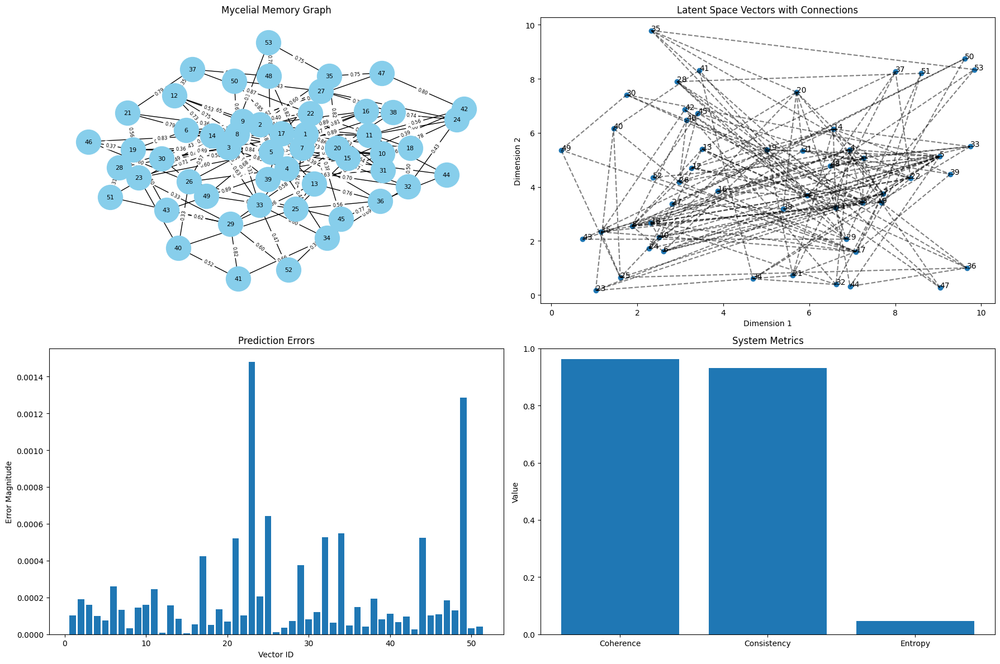


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  

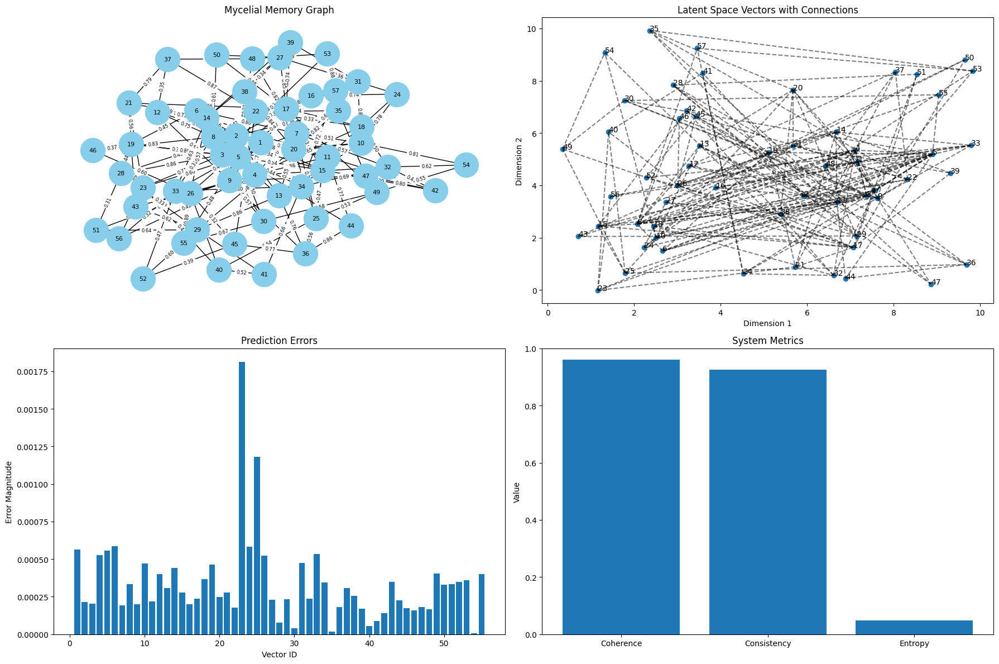


Narrative History:
1.  ->  ->  ->  ->  ->  ->  -> 
2.  ->  ->  ->  ->  ->  ->  ->  -> 
3.  ->  ->  ->  ->  ->  ->  ->  ->  -> 
4.  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
5.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
6.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
7.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
8.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
9.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
10.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
11.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
12.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
13.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
14.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
15.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
16.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  -> 
17.  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  ->  

In [ ]:
def run_simulation_with_fixed_metrics(num_cycles=60, initial_experiences=8,
                                    crystallization_threshold=0.5,
                                    gru_max_cycles=3, input_complexity=0.7):
    """
    Run simulation with fixed metrics calculations and adjusted parameters.
    """
    # Initialize all components
    latent_space = LatentSpace(dimensions=2)
    fractal_ai = EnhancedFractalAI(latent_space)
    mycelial_engine = MycelialEngine()
    gru_modulator = GRUModulator()
    gru_modulator.max_cycles = gru_max_cycles

    # Add initial experiences with increased complexity
    for i in range(1, initial_experiences + 1):
        exp_data, vec = add_complex_experience(i, mycelial_engine, latent_space, complexity=input_complexity)

    attention_field = AttentionField(latent_space)
    semantic_memory = SemanticMemory()

    # Use enhanced feedback loop with adjusted parameters
    feedback_loop = EnhancedFeedbackLoop(latent_space, fractal_ai)
    feedback_loop.min_adaptation_rate = 0.05  # Higher minimum rate
    feedback_loop.max_adaptation_rate = 0.35  # Higher maximum rate
    feedback_loop.adaptation_rate = 0.15  # Start with higher rate

    self_model = SelfModel(latent_space)
    cohesion_layer = CohesionLayer(latent_space, feedback_loop, self_model)
    language_cortex = LanguageCortex(latent_space)
    narrative_loop = NarrativeLoop(semantic_memory)

    # Initialize GURProtocol with lower threshold
    gur_protocol = GURProtocol(cohesion_layer, self_model)
    gur_protocol.crystallization_threshold = crystallization_threshold

    # Store initial experiences in semantic memory
    for node in mycelial_engine.graph.nodes:
        node_data = mycelial_engine.get_experience(node)
        if node_data:
            semantic_memory.store_node(node, node_data)

    # Create initial narrative
    narrative_loop.create_narrative()

    # Simulation history
    simulation_history = []
    monitor_interval = max(1, num_cycles // 10)

    print(f"\n=== Starting Simulation with Fixed Metrics ===\n")
    print(f"NUM_CYCLES: {num_cycles}, THRESHOLD: {crystallization_threshold}")

    for cycle in range(num_cycles):
        if cycle % monitor_interval == 0 or cycle == num_cycles - 1:
            print(f"\nCycle {cycle + 1}/{num_cycles}:")

        current_phase = gru_modulator.advance_cycle()

        # Add new experience with adjusted probability
        add_prob = input_complexity * (1.2 if current_phase == "exploration" else 0.8)
        if np.random.random() < add_prob:
            new_id = max(mycelial_engine.graph.nodes) + 1 if mycelial_engine.graph.nodes else 1
            exp_data, vec = add_complex_experience(new_id, mycelial_engine, latent_space, complexity=input_complexity)
            if cycle % monitor_interval == 0:
                print(f"Added new experience {new_id}: {exp_data.get('description', '')}")
            # Store in semantic memory
            node_data = mycelial_engine.get_experience(new_id)
            if node_data:
                semantic_memory.store_node(new_id, node_data)

        if current_phase == "exploration":
            # Run adaptation on all vectors
            for vec_id in latent_space.get_all_vectors().keys():
                feedback_loop.drive_adaptation(vec_id)

            # Update FractalAI model more frequently
            for _ in range(3):
                for vec_id in latent_space.get_all_vectors().keys():
                    fractal_ai.update_model(vec_id)

            # Adjust adaptation rate more aggressively
            avg_error = np.mean(list(feedback_loop.prediction_errors.values())) if feedback_loop.prediction_errors else 0.0
            if avg_error > 0.5:
                feedback_loop.adaptation_rate = min(feedback_loop.max_adaptation_rate,
                                                feedback_loop.adaptation_rate * 1.2)  # More aggressive increase
            else:
                feedback_loop.adaptation_rate = max(feedback_loop.min_adaptation_rate,
                                                feedback_loop.adaptation_rate * 0.95)  # Slower decrease

        elif current_phase == "consolidation":
            # Focus on improving the most erroneous predictions
            if feedback_loop.prediction_errors:
                sorted_errors = sorted(feedback_loop.prediction_errors.items(), key=lambda x: x[1], reverse=True)
                num_to_adapt = max(1, int(0.3 * len(sorted_errors)))  # Adapt more vectors during consolidation
                for vec_id, _ in sorted_errors[:num_to_adapt]:
                    feedback_loop.drive_adaptation(vec_id)

        # Update semantic memory
        semantic_memory.memory = {}
        for node in mycelial_engine.graph.nodes:
            node_data = mycelial_engine.get_experience(node)
            if node_data:
                semantic_memory.store_node(node, node_data)

        # Create new narrative
        narrative = narrative_loop.create_narrative()

        # Check for crystallization
        crystallized = gur_protocol.check_crystallization()

        # Periodically monitor system state
        if cycle % monitor_interval == 0 or crystallized or cycle == num_cycles - 1:
            monitor_data = enhanced_monitor_system(
                latent_space, mycelial_engine, semantic_memory, feedback_loop,
                self_model, cohesion_layer, language_cortex, narrative_loop,
                gru_modulator, gur_protocol
            )
            # Add cycle number to monitor data
            monitor_data['cycle'] = cycle + 1
            simulation_history.append(monitor_data)

        if crystallized and cycle % monitor_interval != 0:
            monitor_data = enhanced_monitor_system(
                latent_space, mycelial_engine, semantic_memory, feedback_loop,
                self_model, cohesion_layer, language_cortex, narrative_loop,
                gru_modulator, gur_protocol
            )
            monitor_data['cycle'] = cycle + 1
            simulation_history.append(monitor_data)

    # Final analysis
    print("\n=== Simulation Complete ===")
    print(f"Final I-vector: {self_model.compute_i_vector()}")
    print(f"Final Coherence: {cohesion_layer.compute_coherence():.2f}")
    print(f"Final Harmony: {gur_protocol.evaluate_latent_harmony():.2f}")
    print(f"Final Adaptation Rate: {feedback_loop.get_adaptation_rate():.2f}")
    print(f"System crystallized: {'Yes' if gur_protocol.crystallized else 'No'}")

    return simulation_history, fractal_ai, gur_protocol, feedback_loop

# Run the simulation with fixed metrics
fixed_metrics_sim_history, fixed_fractal_ai, fixed_gur_protocol, fixed_feedback_loop = (
    run_simulation_with_fixed_metrics(
        num_cycles=70,
        initial_experiences=8,
        crystallization_threshold=0.5,
        gru_max_cycles=3,
        input_complexity=0.7
    )
)


In [ ]:
def enhanced_monitor_system(latent_space, mycelial_engine, semantic_memory,
                           feedback_loop, self_model, cohesion_layer,
                           language_cortex, narrative_loop, gru_modulator,
                           gur_protocol):
    """
    Enhanced monitoring of the system state.
    """
    # ... [existing code remains the same] ...

    # Return monitoring data with adaptation_rate included
    return {
        "phase": gru_modulator.get_current_phase(),
        "crystallized": gur_protocol.crystallized,
        "harmony": gur_protocol.evaluate_latent_harmony(),
        "coherence": cohesion_layer.compute_coherence(),
        "consistency": self_model.compute_consistency(),
        "entropy": cohesion_layer.compute_entropy(),
        "i_vector": self_model.compute_i_vector(),
        "narratives": narrative_loop.narratives.copy(),
        "adaptation_rate": feedback_loop.get_adaptation_rate() if hasattr(feedback_loop, 'get_adaptation_rate') else 0.01
    }

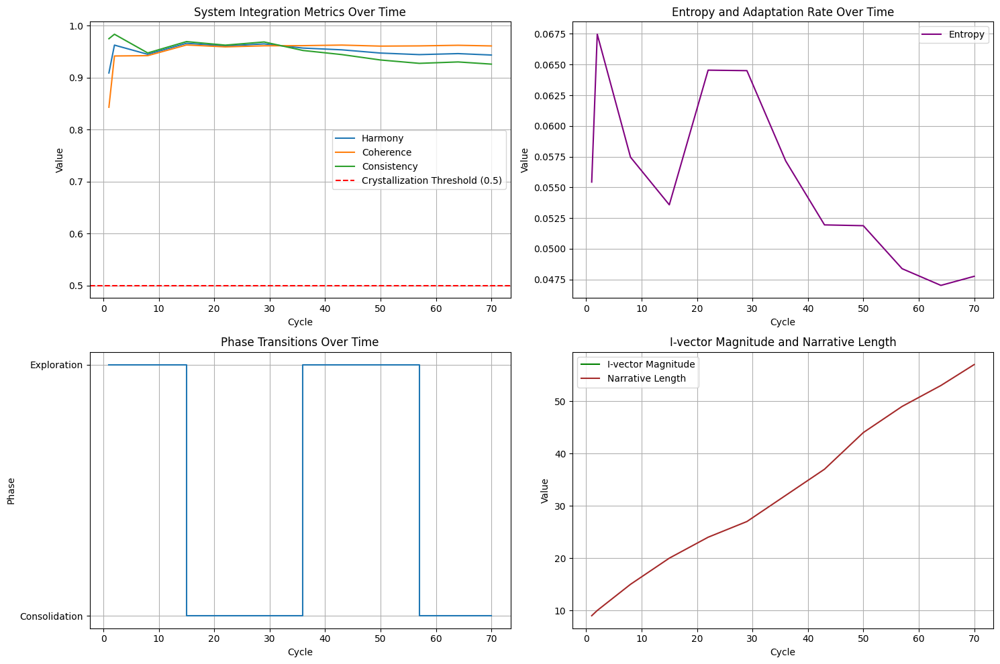

In [ ]:
def enhanced_monitor_and_analyze(fixed_metrics_sim_history, fixed_gur_protocol):
    """
    Enhanced monitoring and analysis of simulation results with focus on key metrics.
    """
    if not fixed_metrics_sim_history:
        print("No simulation history to analyze.")
        return

    import pandas as pd

    # Create a DataFrame from the history
    df = pd.DataFrame(fixed_metrics_sim_history)

    # Check if 'adaptation_rate' is present in the DataFrame columns
    has_adaptation_rate = 'adaptation_rate' in df.columns

    # Plot key metrics over time
    plt.figure(figsize=(15, 10))

    # Plot 1: Harmony, Coherence, and Consistency over time
    plt.subplot(2, 2, 1)
    plt.plot(df['cycle'], df['harmony'], label='Harmony')
    plt.plot(df['cycle'], df['coherence'], label='Coherence')
    plt.plot(df['cycle'], df['consistency'], label='Consistency')
    plt.axhline(y=fixed_gur_protocol.crystallization_threshold, color='r', linestyle='--',
                label=f'Crystallization Threshold ({fixed_gur_protocol.crystallization_threshold})')
    plt.title("System Integration Metrics Over Time")
    plt.xlabel("Cycle")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)

    # Plot 2: Entropy and Adaptation Rate (if available)
    plt.subplot(2, 2, 2)
    plt.plot(df['cycle'], df['entropy'], label='Entropy', color='purple')
    if has_adaptation_rate:
        plt.plot(df['cycle'], df['adaptation_rate'], label='Adaptation Rate', color='orange')
    plt.title("Entropy and Adaptation Rate Over Time")
    plt.xlabel("Cycle")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)

    # Plot 3: Phase transitions (assuming 'phase' column exists)
    if 'phase' in df.columns:
        plt.subplot(2, 2, 3)
        phases = df['phase']
        phase_map = {"exploration": 1, "consolidation": 0}
        numeric_phases = [phase_map[phase] for phase in phases if phase in phase_map]
        plt.plot(df['cycle'].iloc[:len(numeric_phases)], numeric_phases, drawstyle='steps-post', label='Phase')
        plt.yticks([0, 1], ["Consolidation", "Exploration"])
        plt.title("Phase Transitions Over Time")
        plt.xlabel("Cycle")
        plt.ylabel("Phase")
        plt.grid(True)

    # Plot 4: I-vector magnitude and narrative length
    if 'i_vector' in df.columns and 'narratives' in df.columns:
        plt.subplot(2, 2, 4)
        i_vector_magnitudes = [np.linalg.norm(np.array(item['i_vector'])) if isinstance(item['i_vector'], list) else 0
                               for index, item in df.iterrows() if isinstance(item['i_vector'], list)]
        narrative_lengths = []

        for narrative in df['narratives']:
            if isinstance(narrative, list) and narrative:
                last_narr = narrative[-1] if isinstance(narrative[-1], str) else ""
                length = last_narr.count('->') + 1 if isinstance(last_narr, str) else 0
            elif isinstance(narrative, str):
                length = narrative.count('->') + 1
            else:
                length = 0
            narrative_lengths.append(length)

        plt.plot(df['cycle'].iloc[:len(i_vector_magnitudes)], i_vector_magnitudes, label='I-vector Magnitude', color='green')
        plt.plot(df['cycle'].iloc[:len(narrative_lengths)], narrative_lengths, label='Narrative Length', color='brown')
        plt.title("I-vector Magnitude and Narrative Length")
        plt.xlabel("Cycle")
        plt.ylabel("Value")
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.show()

    # Rest of your analysis code remains the same...
    return df

# Usage example
if 'fixed_metrics_sim_history' in globals():
    analysis_results = enhanced_monitor_and_analyze(fixed_metrics_sim_history, fixed_gur_protocol)
else:
    print("Simulation did not run successfully. Please check previous cells for errors.")
